# Importation of libraries

In [1]:
import os
from utils.custom_utils import RetrieveData
from astropy.io import fits
from astropy.stats import mad_std
import matplotlib.pyplot as plt
import numpy as np
from numpy.random import choice,shuffle
from photutils.segmentation import detect_sources, detect_threshold
from photutils.centroids import centroid_quadratic
from scipy.optimize import curve_fit
import statmorph
from statmorph.utils.image_diagnostics import make_figure
import warnings
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn import tree
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, confusion_matrix, log_loss,roc_auc_score, precision_recall_fscore_support

# Downloading data

In [2]:
URL='https://tinyurl.com/hdd4kwva'

RetrieveData(URL)

# Data check

In a first step,we will select data that have all necessary files (ie: LRG_only, lensed_source_only, lens_simulation, RMS and PSF)
In a second step, we will make a sanity check of images and how simulations are made.

## Data importation

In [3]:
path='./data/Savary_training_set_lenses/'# path of the data directory

### directories for different type of files
lensed='Lens_simulations/' # Files containing simulations of gravitational lenses
non_lensed='LRG_only/' # Files containing lenses only (LRG type galaxies)
lensed_source='lensed_source_only/' # Files containing only lensed galaxies (without the lens galaxy)
RMS='Lenses/RMS/' # Files containing the RMS image
PSF='Lenses/PSF/' # Files containing the PSF image

### List of every files within a directory
files_lensed=os.listdir(path+lensed)
files_non_lensed=os.listdir(path+non_lensed)
files_lensed_source=os.listdir(path+lensed_source)
files_rms=os.listdir(path+RMS)
files_psf=os.listdir(path+PSF)

In [4]:
### Se./data/ion of data with all required files
data=[file for file in files_lensed if (file in files_non_lensed and file in files_lensed_source and file in files_rms and file in files_psf)]

### Data visualisation
9 first images of each type of files

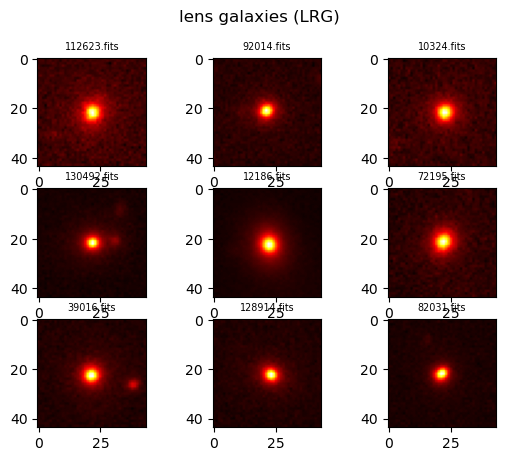

[[-0.14891902 -0.03406619  2.5951173  ...  2.7815037   2.5418334
   1.0443852 ]
 [ 1.0258368   3.5630279   0.11222305 ... -0.2992858   0.78510994
  -0.42591467]
 [-3.824454   -5.7751837  -3.85355    ... -0.91026986  1.1749513
   3.047733  ]
 ...
 [-0.9580343   0.5947155   0.33116996 ... -1.7261217  -1.4630445
  -1.2632405 ]
 [ 0.85445946 -1.8792344   1.440637   ... -0.01883855  2.9685318
   0.71046245]
 [ 0.8709023   1.3420706  -0.69719535 ...  1.5081378   2.0736992
   3.0283797 ]]


In [5]:
for count, file in zip(range(1,10),data[10:20]):
    file_path=path+non_lensed+file
    image, header = fits.getdata(file_path, header=True)
    plt.suptitle('lens galaxies (LRG)')
    plt.subplot(330+count)
    plt.title(file, fontsize='x-small')
    plt.imshow(image, cmap='hot')
plt.savefig('img/LRG_only.png')
plt.show()
print(image)

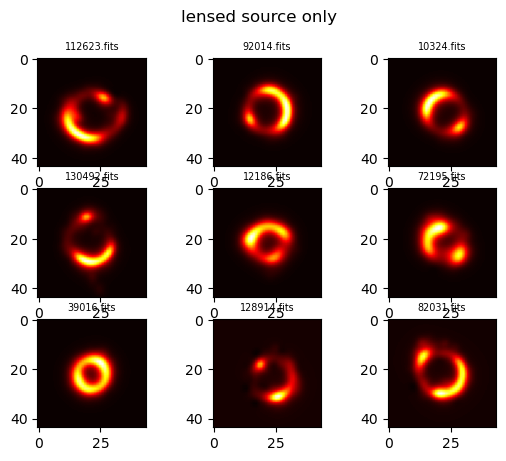

[[ 1.40121281e-09  1.19273223e-06  2.37438150e-05 ... -4.44089210e-16
  -4.44089210e-16 -2.22044605e-16]
 [ 7.67464226e-08  1.22924294e-05  1.33421999e-04 ... -3.88578059e-16
  -4.44089210e-16 -4.44089210e-16]
 [ 3.92652092e-06  7.93972149e-05  4.57325289e-04 ... -2.22044605e-16
  -2.22044605e-16  0.00000000e+00]
 ...
 [ 1.11022302e-16 -4.17599288e-12  2.40275717e-08 ... -2.46828091e-07
  -2.47184495e-11  6.66133815e-16]
 [ 1.11022302e-16  0.00000000e+00  0.00000000e+00 ...  8.33882928e-11
   8.88178420e-16  6.66133815e-16]
 [ 2.22044605e-16  2.22044605e-16  0.00000000e+00 ...  8.88178420e-16
   8.88178420e-16  4.44089210e-16]]


In [6]:
for count, file in zip(range(1,10),data[10:20]):
    file_path=path+lensed_source+file
    image, header = fits.getdata(file_path, header=True)
    plt.suptitle('lensed source only')
    plt.subplot(330+count)
    plt.title(file, fontsize='x-small')
    plt.imshow(image, cmap='hot')
plt.savefig('img/Lensed_source_only.png')
plt.show()
print(image)

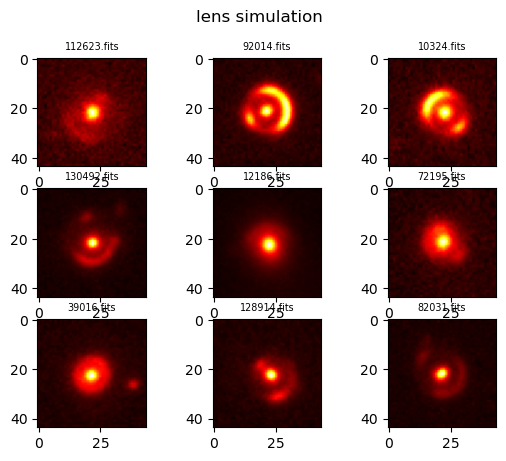

[[-0.14891901 -0.034065    2.59514107 ...  2.78150368  2.5418334
   1.04438519]
 [ 1.0258369   3.56304015  0.11235647 ... -0.2992858   0.78510994
  -0.42591467]
 [-3.82445014 -5.77510428 -3.85309263 ... -0.91026986  1.17495131
   3.04773307]
 ...
 [-0.95803428  0.59471548  0.33116999 ... -1.72612191 -1.46304452
  -1.26324046]
 [ 0.85445946 -1.87923443  1.44063699 ... -0.01883855  2.96853185
   0.71046245]
 [ 0.8709023   1.34207058 -0.69719535 ...  1.50813782  2.07369924
   3.02837968]]


In [7]:
for count, file in zip(range(1,10),data[10:20]):
    file_path=path+lensed+file
    image, header = fits.getdata(file_path, header=True)
    plt.suptitle('lens simulation')
    plt.subplot(330+count)
    plt.title(file, fontsize='x-small')
    plt.imshow(image, cmap='hot')
plt.savefig('img/Lens_simulation.png')
plt.show()

print(image)

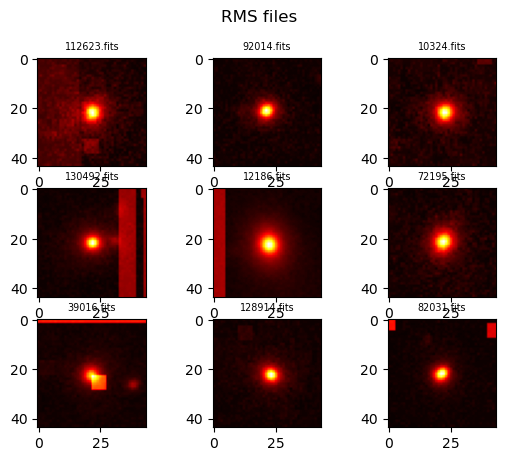

In [8]:
for count, file in zip(range(1,10),data[10:20]):
    file_path=path+RMS+file
    image, header = fits.getdata(file_path, header=True)
    plt.suptitle('RMS files')
    plt.subplot(330+count)
    plt.title(file, fontsize='x-small')
    plt.imshow(image, cmap='hot')
plt.savefig('img/RMS.png')
plt.show()

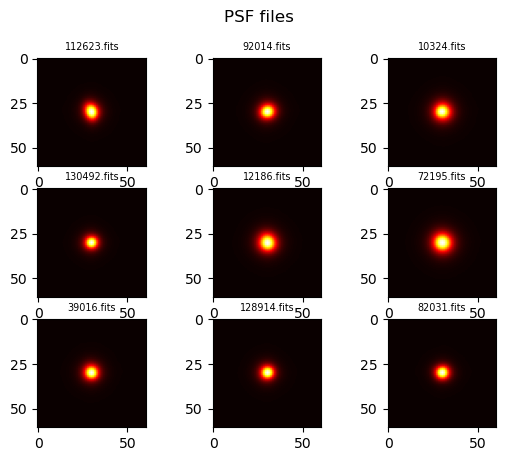

In [9]:
for count, file in zip(range(1,10),data[10:20]):
    file_path=path+PSF+file
    image, header = fits.getdata(file_path, header=True)
    plt.suptitle('PSF files')
    plt.subplot(330+count)
    plt.title(file, fontsize='x-small')
    plt.imshow(image, cmap='hot')
plt.savefig('img/PSF.png')
plt.show()

## redshift

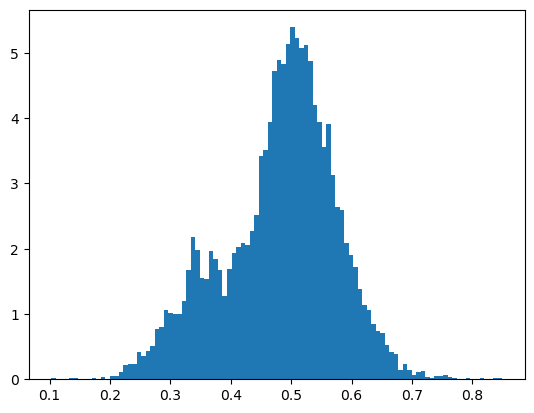

In [10]:
redshift=[]
for file in data:
    file_path=path+non_lensed+file
    image, header = fits.getdata(file_path, header=True)
    
    redshift.append(header['REDSHIFT'])

plt.hist(redshift,bins=100, density=True)
plt.show()

## Background neutrality check

We need to know if the sky background is already substracted from the image. To do so we propose 2 different methods (We need to decide which one is the best)

### Corners method

We will get values from pixels in the 4 corners of the image within a given size square

In [17]:
### Function that take an image and the size of the square and return a list of values from pixels in the 4 corners of the image
def corner_value(image,size=5):
    dimensions=np.shape(image)
    
    data=image[:size,:size] #up left corner
    data=np.append(data,image[:size,dimensions[0]-size:]) #up right corner
    data=np.append(data,image[dimensions[0]-size:,:size]) #down left corner
    data=np.append(data,image[dimensions[0]-size:,dimensions[1]-size:]) #down right corner
    
    return data

In [11]:
### Let's determine the mean value of the background for all the data set and the standard deviation
mean_bkg=[]
std_bkg=[]
for file in data:
    image_file=path+non_lensed+file
    image, header = fits.getdata(image_file, header=True)
    corners=corner_value(image)
    mean_bkg.append(np.mean(corners))
    std_bkg.append(np.std(corners))

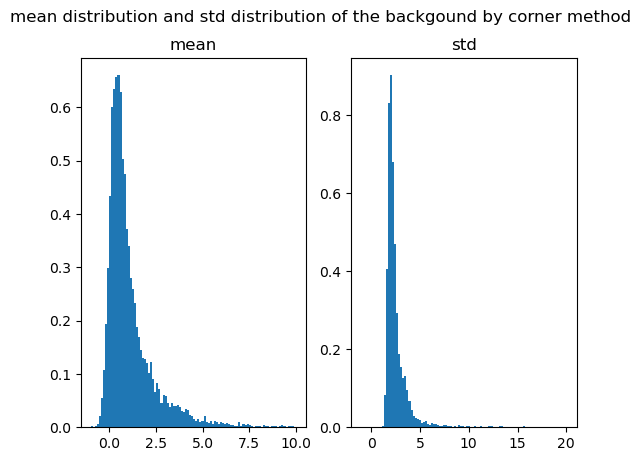

mean peak = 0.4300000071525574
std peak = 1.940000057220459


In [12]:
plt.suptitle('mean distribution and std distribution of the backgound by corner method')
plt.subplot(121)
plt.title('mean')
n_mean, bins_mean, patches_mean = plt.hist(mean_bkg,bins=100,density=True, range=(-1,10))
plt.subplot(122)
plt.title('std')
n_std, bins_std, patches_std = plt.hist(std_bkg,bins=100,density=True, range=(-1,20))
plt.show()

print(f'mean peak = {bins_mean[np.argmax(n_mean)]}')
print(f'std peak = {bins_std[np.argmax(n_std)]}')

In [13]:
### Let's determine the mean value of the background for all the data set and the standard deviation
mean_bkg=[]
std_bkg=[]
for file in data:
    image_file=path+lensed+file
    image, header = fits.getdata(image_file, header=True)
    corners=corner_value(image)
    mean_bkg.append(np.mean(corners))
    std_bkg.append(np.std(corners))

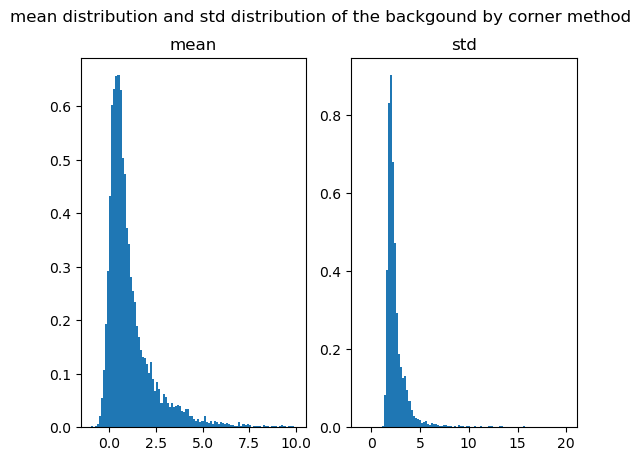

mean peak = 0.42999999999999994
std peak = 1.94


In [248]:
plt.suptitle('mean distribution and std distribution of the backgound by corner method')
plt.subplot(121)
plt.title('mean')
n_mean, bins_mean, patches_mean = plt.hist(mean_bkg,bins=100,density=True, range=(-1,10))
plt.subplot(122)
plt.title('std')
n_std, bins_std, patches_std = plt.hist(std_bkg,bins=100,density=True, range=(-1,20))
plt.show()

print(f'mean peak = {bins_mean[np.argmax(n_mean)]}')
print(f'std peak = {bins_std[np.argmax(n_std)]}')

### Azimutal mean method

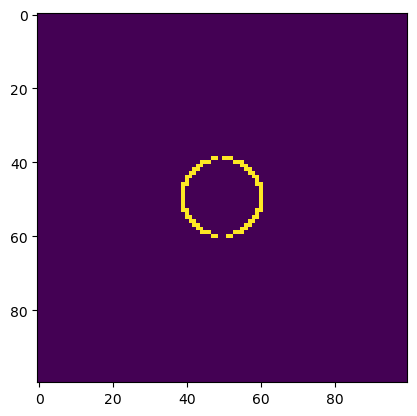

In [14]:
### Function that returns coordinates of pixels of circle centered in X_O,Y_0 of radius R
def pixels_circle(X_0,Y_0,R):
    coord=[]
    y_range=np.arange(-R,R,0.1)
    for y in y_range:
        x=np.sqrt(R**2-y**2)
        x1=int(X_0+x)
        x2=int(X_0-x)
        Y=int(Y_0+y)
        
        if x1==x2:
            coord.append([x1,Y])
        else:
            coord.append([x1,Y])
            coord.append([x2,Y])
    return coord

test=np.zeros([100,100])
circle=pixels_circle(50,50,10.5)#avec les x.5 les cercles sont plus beau (pourquoi ? Parceque ...)
for coord in circle:
    x=coord[0]
    y=coord[1]
    test[y,x]=1
plt.imshow(test)
plt.show()

In [15]:
### Function that return the azimutal mean profile
def azimutal_average(image,X_0,Y_0,r_max,r_min=0.5,step=1):
    azimut=np.arange(r_min,r_max,step)
    average=[]
    for r in azimut:
        pixel_values=[]
        circle=pixels_circle(x_0,y_0,r)
        for coord in circle:
            x=coord[0]
            y=coord[1]
            if (x<0 or x>=x_max or y<0 or y>=x_max):
                continue
            else:
                pixel_values.append(image[y,x])
        if len(pixel_values)!=0:
            average.append(np.mean(pixel_values))
        else:
            average.append(np.nan)
    return(azimut,average)

def azimutal_max(image,X_0,Y_0,r_max,r_min=0.5,step=1):
    azimut=np.arange(r_min,r_max,step)
    average=[]
    for r in azimut:
        pixel_values=[]
        circle=pixels_circle(x_0,y_0,r)
        for coord in circle:
            x=coord[0]
            y=coord[1]
            if (x<0 or x>=x_max or y<0 or y>=x_max):
                continue
            else:
                pixel_values.append(image[y,x])
        if len(pixel_values)!=0:
            average.append(np.max(pixel_values))
        else:
            average.append(np.nan)
    return(azimut,average)


### Function that return the azimutal std profile
def azimutal_std(image,X_0,Y_0,r_max,r_min=0.5,step=1):
    azimut=np.arange(r_min,r_max,step)
    std=[]
    for r in azimut:
        pixel_values=[]
        circle=pixels_circle(x_0,y_0,r)
        for coord in circle:
            x=coord[0]
            y=coord[1]
            if (x<0 or x>=x_max or y<0 or y>=x_max):
                continue
            else:
                pixel_values.append(image[y,x])
        if len(pixel_values)!=0:
            std.append(np.std(pixel_values))
        else:
            std.append(np.nan)
    return(azimut,std)

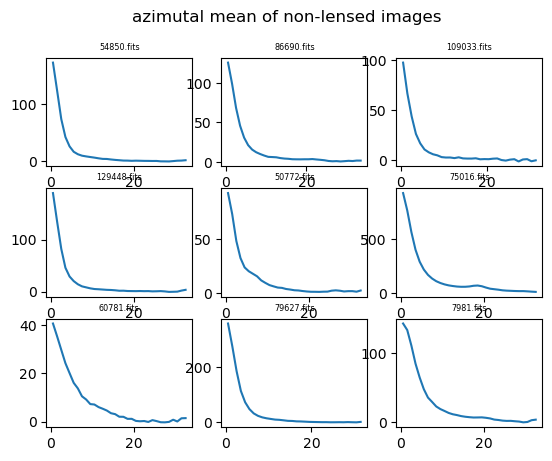

In [16]:
### plot the 9 first profiles of 
for count, file in zip(range(1,10),data[:9]):
    file_path=path+non_lensed+file
    image, header = fits.getdata(file_path, header=True)
    
    x_0,y_0=centroid_quadratic(image)# locate the centroid coordinates
    x_max=np.min(np.shape(image))# take the maximum radius as the minimum size of the picture
    
    azimut,average=azimutal_average(image,x_0,y_0,x_max)
    
    plt.suptitle('azimutal mean of non-lensed images')
    plt.subplot(330+count)
    plt.title(file, fontsize='xx-small')
    plt.plot(azimut,average)
plt.show()

ValueError: cannot convert float NaN to integer

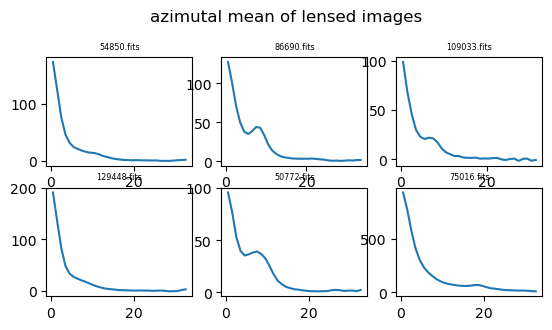

In [18]:
### plot the 9 first profiles of 
for count, file in zip(range(1,10),data[:9]):
    file_path=path+lensed+file
    image, header = fits.getdata(file_path, header=True)
    
    x_0,y_0=centroid_quadratic(image)# locate the centroid coordinates
    x_max=np.min(np.shape(image))# take the maximum radius as the minimum size of the picture
    
    azimut,average=azimutal_average(image,x_0,y_0,x_max)
    
    plt.suptitle('azimutal mean of lensed images')
    plt.subplot(330+count)
    plt.title(file, fontsize='xx-small')
    plt.plot(azimut,average)
plt.show()

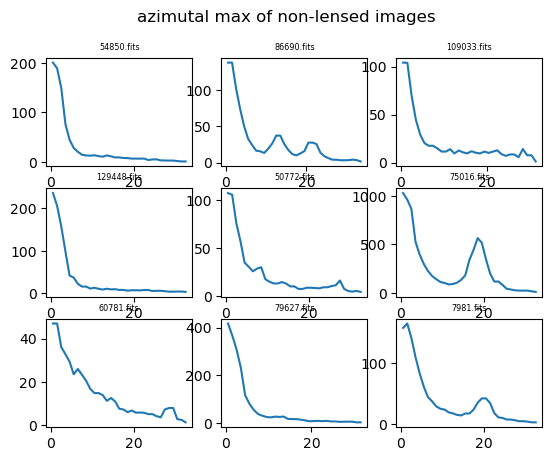

In [19]:
### plot the 9 first profiles of 
for count, file in zip(range(1,10),data[:9]):
    file_path=path+non_lensed+file
    image, header = fits.getdata(file_path, header=True)
    
    x_0,y_0=centroid_quadratic(image)# locate the centroid coordinates
    x_max=np.min(np.shape(image))# take the maximum radius as the minimum size of the picture
    
    azimut,Max=azimutal_max(image,x_0,y_0,x_max)
    
    plt.suptitle('azimutal max of non-lensed images')
    plt.subplot(330+count)
    plt.title(file, fontsize='xx-small')
    plt.plot(azimut,Max)
plt.show()

ValueError: cannot convert float NaN to integer

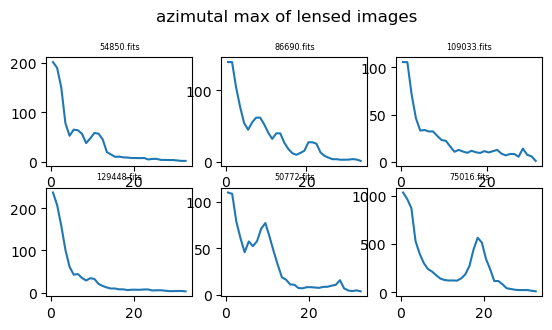

In [20]:
### plot the 9 first profiles of 
for count, file in zip(range(1,10),data[:9]):
    file_path=path+lensed+file
    image, header = fits.getdata(file_path, header=True)
    
    x_0,y_0=centroid_quadratic(image)# locate the centroid coordinates
    x_max=np.min(np.shape(image))# take the maximum radius as the minimum size of the picture
    
    azimut,Max=azimutal_max(image,x_0,y_0,x_max)
    
    plt.suptitle('azimutal max of lensed images')
    plt.subplot(330+count)
    plt.title(file, fontsize='xx-small')
    plt.plot(azimut,Max)
plt.show()

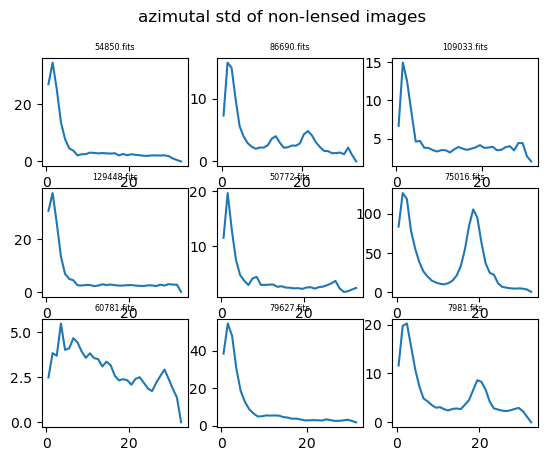

In [21]:
for count, file in zip(range(1,10),data[:9]):
    file_path=path+non_lensed+file
    image, header = fits.getdata(file_path, header=True)
    
    x_0,y_0=centroid_quadratic(image)
    x_max=np.min(np.shape(image))
    
    azimut,stdev=azimutal_std(image,x_0,y_0,x_max)
    
    plt.suptitle('azimutal std of non-lensed images')
    plt.subplot(330+count)
    plt.title(file, fontsize='xx-small')
    plt.plot(azimut,stdev)
plt.show()

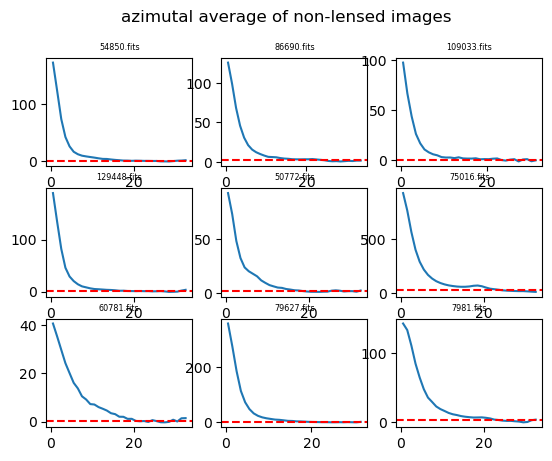

In [22]:
### Estimation of the background value by tacking the mean value of the last points
for count, file in zip(range(1,10),data[:9]):
    file_path=path+non_lensed+file
    image, header = fits.getdata(file_path, header=True)
    
    x_0,y_0=centroid_quadratic(image)
    x_max=np.min(np.shape(image))
    
    azimut,average=azimutal_average(image,x_0,y_0,x_max)
    arg=int(np.argwhere(azimut>20)[0])
    
    mean_bkg=np.nanmean(average[arg:])
    
    plt.suptitle('azimutal average of non-lensed images')
    plt.subplot(330+count)
    plt.title(file, fontsize='xx-small')
    plt.plot(azimut,average)
    plt.axhline(y = mean_bkg, color='r',linestyle = 'dashed')
plt.show()

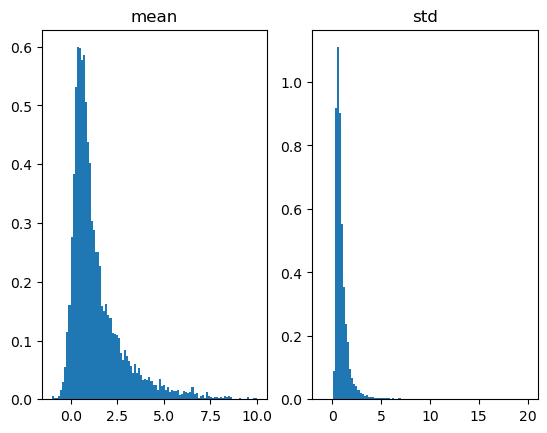

mean peak = 0.32000000000000006
std peak = 0.47


In [23]:
### plot of the histogram
mean_az=[]
std_az=[]
for file in data:
    file_path=path+non_lensed+file
    image, header = fits.getdata(file_path, header=True)
    
    try:
        x_0,y_0=centroid_quadratic(image)
    
        x_max=np.min(np.shape(image))
    
        azimut,average=azimutal_average(image,x_0,y_0,x_max)
        arg=int(np.argwhere(azimut>20)[0])
    
        mean=np.nanmean(average[arg:])
        std=np.nanstd(average[arg:])
    
        mean_az.append(mean)
        std_az.append(std)

    except:
        continue
        
plt.subplot(121)
plt.title('mean')
n_mean_az, bins_mean_az, patches_mean_az = plt.hist(mean_az,bins=100,density=True, range=(-1,10))
plt.subplot(122)
plt.title('std')
n_std_az, bins_std_az, patches_std_az = plt.hist(std_az,bins=100,density=True, range=(-1,20))
plt.show()

print(f'mean peak = {bins_mean_az[np.argmax(n_mean_az)]}')
print(f'std peak = {bins_std_az[np.argmax(n_std_az)]}')

## Study on the link between image and it's associated RMS file

In theory the link should be RMS² = pixel_value/gain + sigma_sky²

In [20]:
### Define a function to take pixels with high values to eliminate pixels in the plateau at low values
def high_pass(x,y,cut):
    args=np.where(x>=cut)
    return(x[args],y[args])

def low_pass(x,y,cut):
    args=np.where(x<cut)
    return(x[args],y[args])

### linear function to be fitted
def f(x,a,b):
    return(a*x+b)

corner=12.427878114786154
pleateau=13.562846027416052
a=0.030059449671175624, computed gain=33.26740878289972, b=13.425235949503955
gain of the header=31.58147985777

[ 0.03005945 13.42523595]
[[ 9.41348125e-08 -2.62770611e-06]
 [-2.62770611e-06  1.42756309e-04]]
corner=3.5664803336324127
pleateau=3.878302117731212
a=0.023604497911143274, computed gain=42.364807070432, b=3.837186377761048
gain of the header=42.36131302261

[0.0236045  3.83718638]
[[ 3.06153423e-10 -9.47959024e-09]
 [-9.47959024e-09  5.00823529e-07]]
corner=6.231264824295067
pleateau=6.814165092457249
a=0.022326858121773128, computed gain=44.78910532533913, b=6.771355655897615
gain of the header=44.49179950994

[0.02232686 6.77135566]
[[ 2.53151413e-09 -7.14591751e-08]
 [-7.14591751e-08  3.34503142e-06]]
corner=6.23220401019131
pleateau=4.114351658280302
a=0.024136369509300426, computed gain=41.43125168906084, b=3.9820720997907193
gain of the header=39.04594723878

[0.02413637 3.9820721 ]
[[ 2.23391349e-07 -6.81343235e-

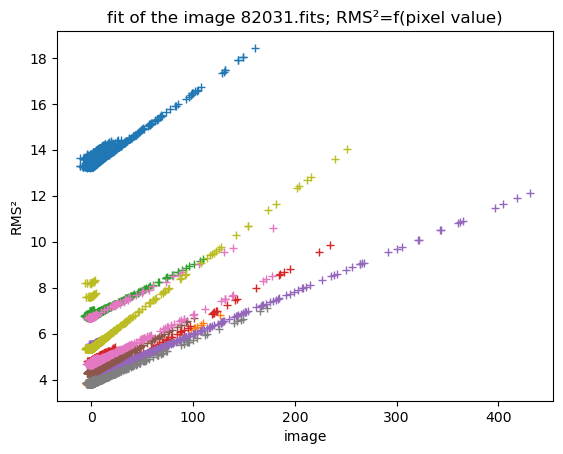

In [45]:
for file in data[10:19]:
    file_path=path+non_lensed+file
    rms_path=path+RMS+file
    image, header = fits.getdata(file_path, header=True)
    rms,rms_header= fits.getdata(rms_path, header=True)
    print(f'corner={np.std(corner_value(image,10))**2}')
    image=np.ravel(image)
    rms=np.ravel(rms)
    
    low=low_pass(image,rms**2,10)
    print(f'pleateau={np.mean(low[1])}')
    clean=high_pass(image,rms**2,10)
    
    popt,pcov=curve_fit(f,*clean)
    print(f'a={popt[0]}, computed gain={1/popt[0]}, b={popt[1]}')
    gain_rms=rms_header['gain']
    gain_image=header['GAIN']
    print(f'gain of the header={gain_image}\n')
    
    print(popt)
    print(pcov)
    
    #x=np.linspace(np.min(clean[0]),np.max(clean[0]),100)
    #y=f(x,*popt)
    
    #plt.plot(x,y)
    
    plt.plot(image,rms**2,'+')
    plt.xlabel('image')
    plt.ylabel('RMS²')
plt.title(f'fit of the image {file}; RMS²=f(pixel value)')
#plt.savefig('img/RMS2vsADU.png')
plt.show()

In [26]:
sigma_sky=[]
for file in data:
    file_path=path+non_lensed+file
    rms_path=path+RMS+file
    image, header = fits.getdata(file_path, header=True)
    rms,rms_header= fits.getdata(rms_path, header=True)
    image=np.ravel(image)
    rms=np.ravel(rms)
    
    clean=high_pass(image,rms**2,10)
    
    popt,pcov=curve_fit(f,*clean)
    try:
        sigma_sky.append(popt[1])
    except:
        continue

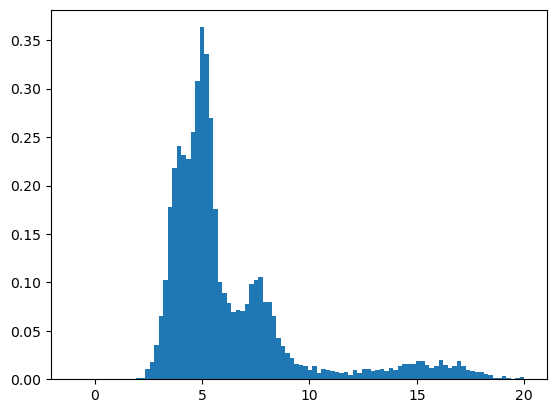

std peak = 4.88


In [27]:
n_std_sigma_sky, bins_std_sigma_sky, patches_std_sigma_sky = plt.hist(sigma_sky,bins=100,density=True,range=(-1,20))
plt.show()

print(f'std peak = {bins_std_sigma_sky[np.argmax(n_std_sigma_sky)]}')

## Study on the creation of simulated images

Does the lense simulation is the addition of the lens and the lensed source ?

To know it I will substract both the lensed source and the deflector. If the sum of all pixels!= 0, it means that it's not a simple addition

In [28]:
ok_file=0
for file in data:#No replacement to avoid the displaying of a same picture
    file_path=path+lensed+file
    image, header = fits.getdata(file_path, header=True)
    source_path=path+lensed_source+file
    source, source_header= fits.getdata(source_path, header=True)
    lrg_path=path+non_lensed+file
    lrg, header_lrg = fits.getdata(lrg_path, header=True)
    
    substracted=image-source-lrg
    pixel_positive=np.nonzero(substracted)
    if np.size(pixel_positive)==0:
        ok_file+=1
print(f'{ok_file/len(data)*100}% of the files are source+deflector')

100.0% of the files are source+deflector


# Detection of sources and selection of the threshold
3 different methods : autothreshold, MAD std, sigma_sky

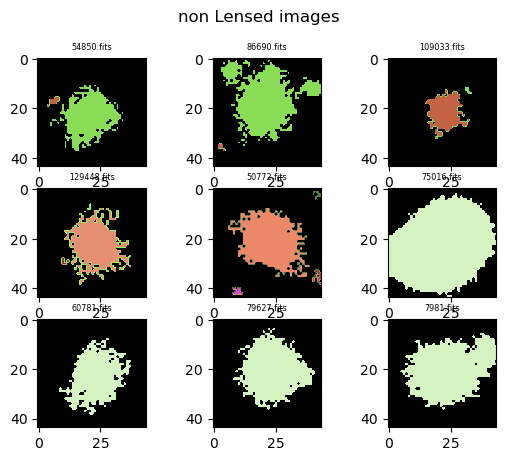

In [29]:
### autothreshold method
for count, file in zip(range(1,10),data[:9]):
    file_path=path+non_lensed+file
    image, header = fits.getdata(file_path, header=True)
    threshold=detect_threshold(image,1.5,0.43)
    segm = detect_sources(image, threshold, npixels=5)
    plt.suptitle('non Lensed images')
    plt.subplot(330+count)
    plt.title(file, fontsize='xx-small')
    plt.imshow(segm.data, cmap=segm.cmap)
plt.show()

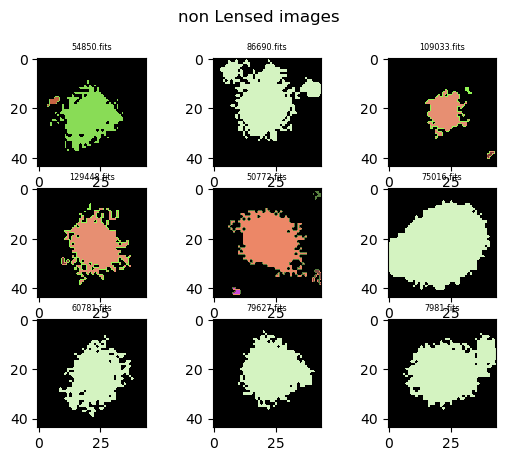

In [30]:
### MAD method
for count, file in zip(range(1,10),data[:9]):
    file_path=path+non_lensed+file
    image, header = fits.getdata(file_path, header=True)
    threshold=1.5*mad_std(image)
    segm = detect_sources(image, threshold, npixels=5)
    plt.suptitle('non Lensed images')
    plt.subplot(330+count)
    plt.title(file, fontsize='xx-small')
    plt.imshow(segm.data, cmap=segm.cmap)
plt.show()

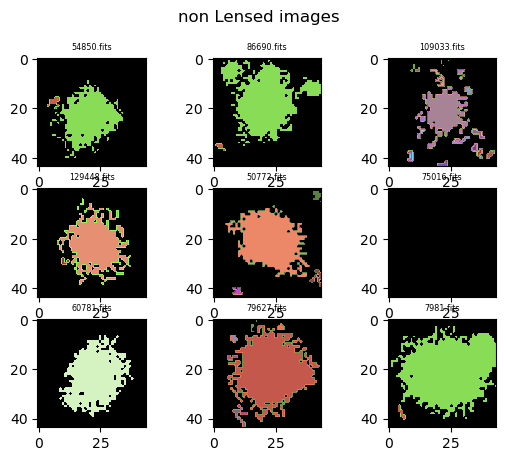

In [31]:
### sigma_sky method (à coder)
for count, file in zip(range(1,10),data[:9]):
    file_path=path+non_lensed+file
    image, header = fits.getdata(file_path, header=True)
    threshold=4.88
    segm = detect_sources(image, threshold, npixels=5)
    plt.suptitle('non Lensed images')
    plt.subplot(330+count)
    plt.title(file, fontsize='xx-small')
    plt.imshow(segm.data, cmap=segm.cmap)
plt.show()

# Selection of sources and mask building

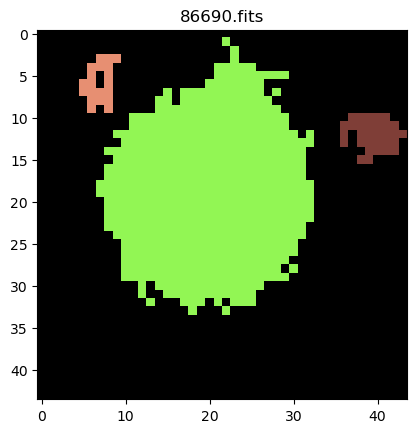

In [32]:
file=data[1]
file_path=path+lensed+file
image, header = fits.getdata(file_path, header=True)
threshold=detect_threshold(image,1.5)
segm = detect_sources(image, threshold, npixels=5)
plt.title(file)
plt.imshow(segm.data, cmap=segm.cmap)
plt.show()

In [33]:
def galaxy_map(segm):
    label = np.argmax(segm.areas)+1
    segm_map=1*(segm.data==label)
    return segm_map

def mask(segm):
    galaxy=(galaxy_map(segm))
    segm_map=segm.data!=0
    mask=segm_map-galaxy
    bool_mask=mask==1
    return bool_mask

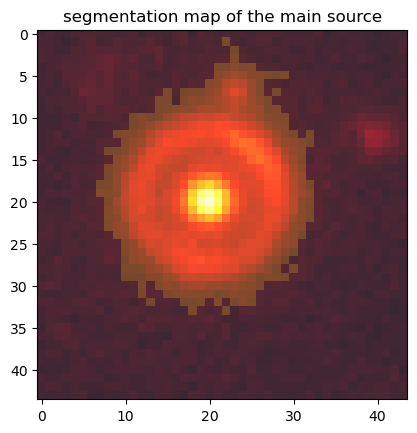

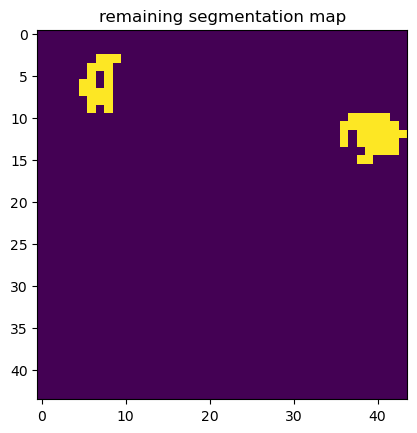

In [34]:
segm_map=galaxy_map(segm)

Mask=mask(segm)

plt.imshow(segm_map, alpha=0.5)
plt.imshow(image, alpha=0.7, cmap='hot')
plt.title('segmentation map of the main source')
plt.show()
plt.imshow(Mask)
plt.title('remaining segmentation map')
plt.show()

# Statmorph

## Application of Statmorph

54850.fits
flag_sersic=0
flag=0
sersic_amplitude = 18.96759220339933
sersic_rhalf = 4.037879814716989
sersic_n = 13.247819240402332
sersic_xc = 20.888688897242847
sersic_yc = 23.030795863067375
sersic_ellip = 0.9768298725669261
sersic_theta = 2.875576612612525 



86690.fits
flag_sersic=0
flag=2
sersic_amplitude = 1.6390978791994233
sersic_rhalf = 18.264054298702472
sersic_n = 5.79521598588641
sersic_xc = 20.00093164378398
sersic_yc = 19.988058556272623
sersic_ellip = 0.3231832476853006
sersic_theta = 1.7725339242703582 

109033.fits
flag_sersic=0
flag=1
sersic_amplitude = 15.676084627947551
sersic_rhalf = 3.440752634084907
sersic_n = 5.413983749735002
sersic_xc = 22.02603509521721
sersic_yc = 21.954865366108695
sersic_ellip = 0.8748143870348422
sersic_theta = 2.103587270363397 

129448.fits
flag_sersic=0
flag=0
sersic_amplitude = 20.929377696214228
sersic_rhalf = 3.0768096465639743
sersic_n = 5.586555840029202
sersic_xc = 22.976195267738152
sersic_yc = 21.979409992990714
sersic_ellip = 0.8614245243516799
sersic_theta = 0.7031046120313033 

50772.fits
flag_sersic=0
flag=0
sersic_amplitude = 3.647277786173801
sersic_rhalf = 11.930746575742196
sersic_n = 4.022443033415118
sersic_xc = 21.999875646976925
sersic_yc = 19.998507790263428
sersic_ellip =

75016.fits
flag_sersic=0
flag=2
sersic_amplitude = 100.556123413253
sersic_rhalf = 30.356256430929037
sersic_n = 3.98305386552875
sersic_xc = 21.944970840059344
sersic_yc = 22.017159147379175
sersic_ellip = 0.9425299487120053
sersic_theta = 2.8460806040566364 

60781.fits
flag_sersic=0
flag=0
sersic_amplitude = 10.701458713370883
sersic_rhalf = 7.923738709487867
sersic_n = 2.1171195425798457
sersic_xc = 22.666022798116646
sersic_yc = 22.54554985177444
sersic_ellip = 0.15106186613768446
sersic_theta = 1.6040146261558856 

79627.fits
flag_sersic=0
flag=0
sersic_amplitude = 66.26795363701677
sersic_rhalf = 2.404492214531419
sersic_n = 4.4124909106565795
sersic_xc = 21.9941490103674
sersic_yc = 20.988692732777288
sersic_ellip = 0.8692496905117068
sersic_theta = 1.1420360331533643 

7981.fits
flag_sersic=0
flag=0
sersic_amplitude = 10.570951127038693
sersic_rhalf = 13.533601308893859
sersic_n = 3.3860118272539186
sersic_xc = 22.00126410515253
sersic_yc = 21.9992741738231
sersic_ellip = 0.36

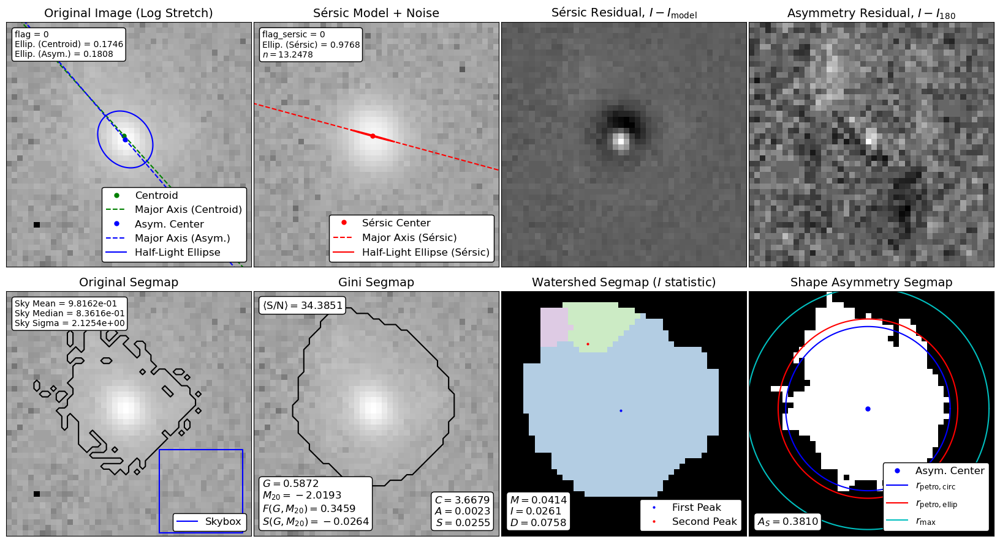

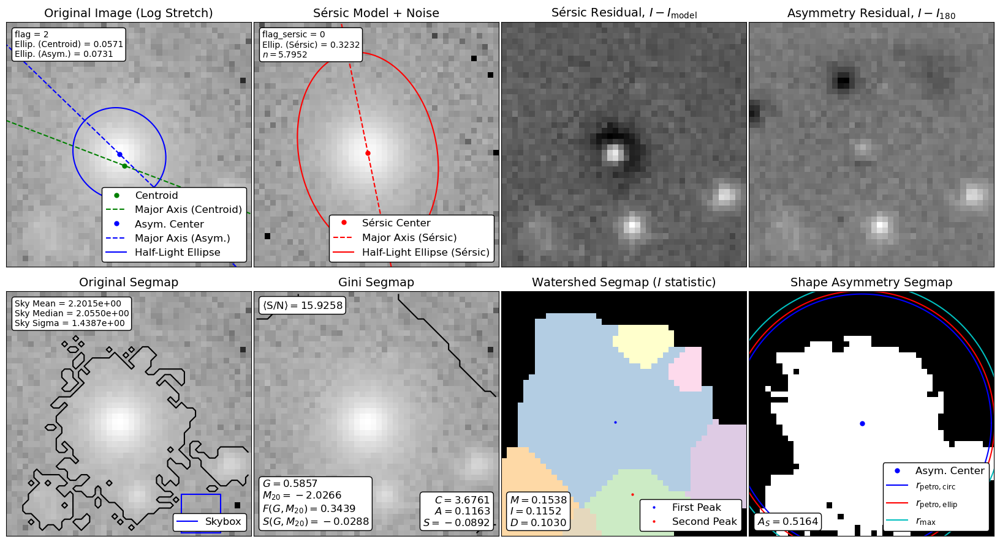

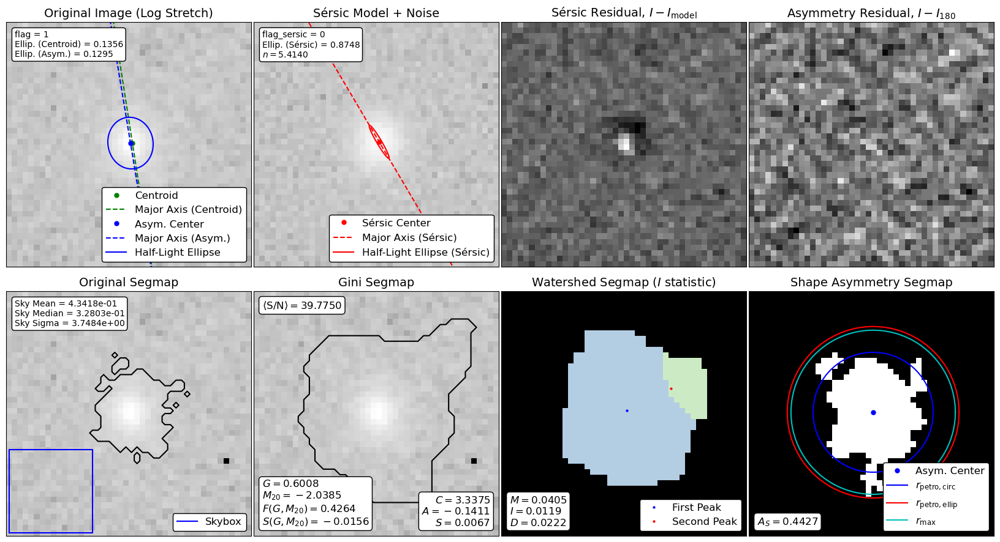

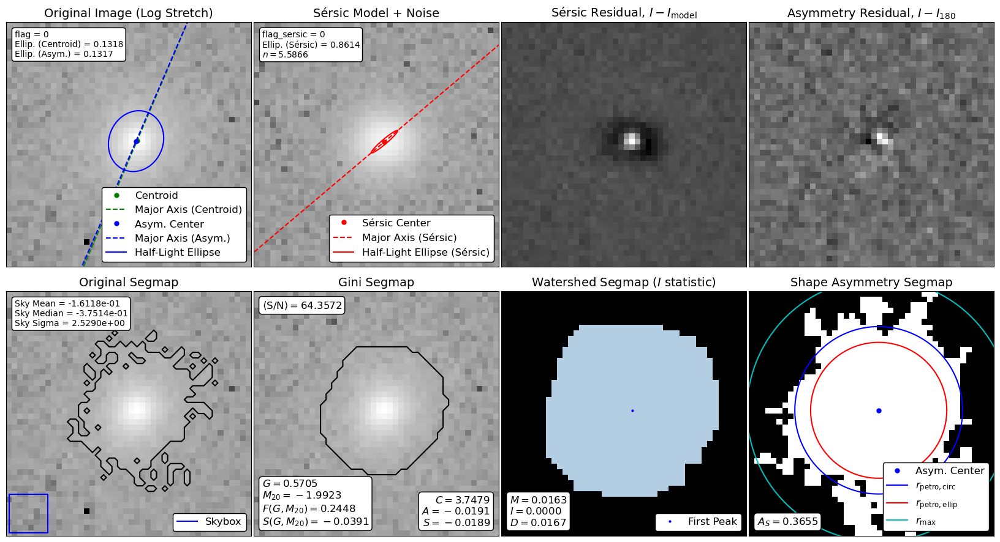

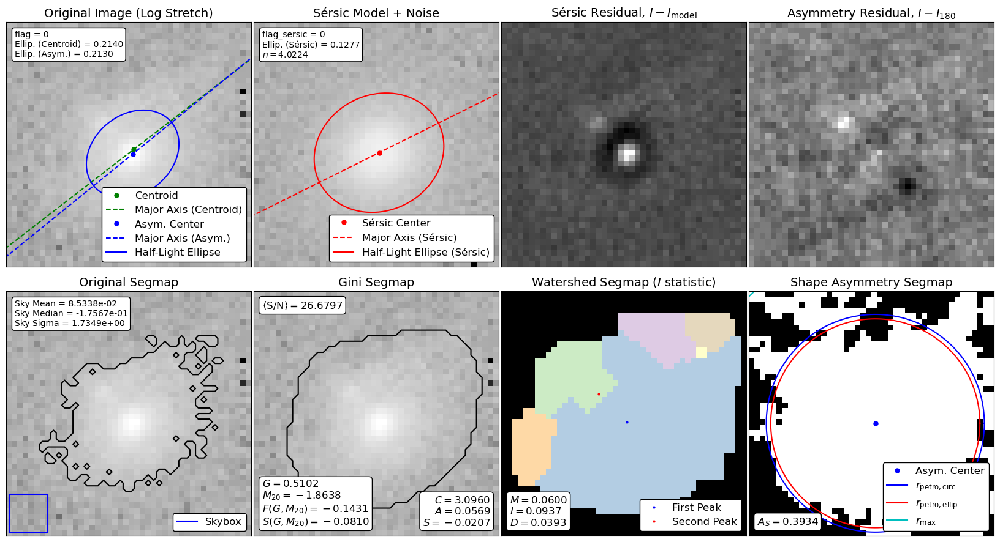

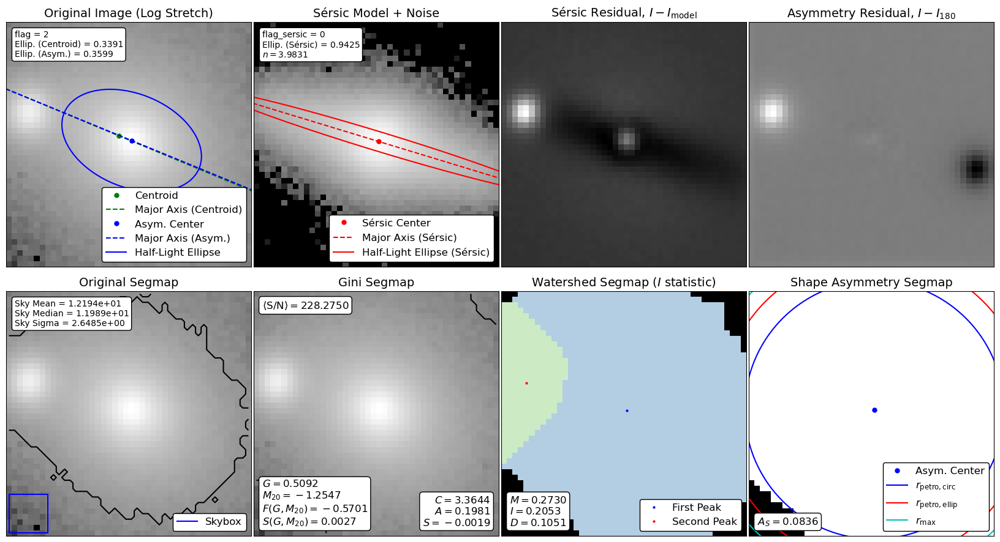

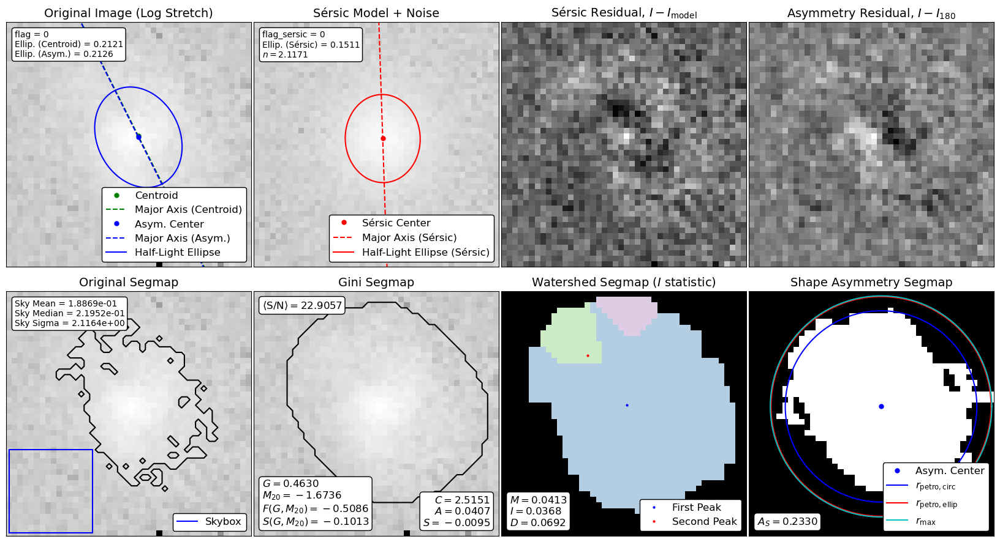

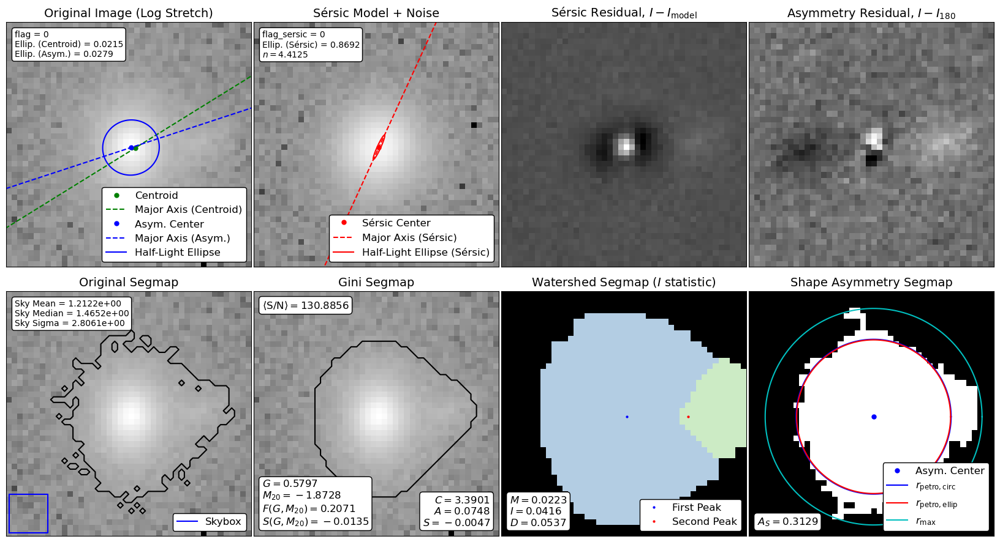

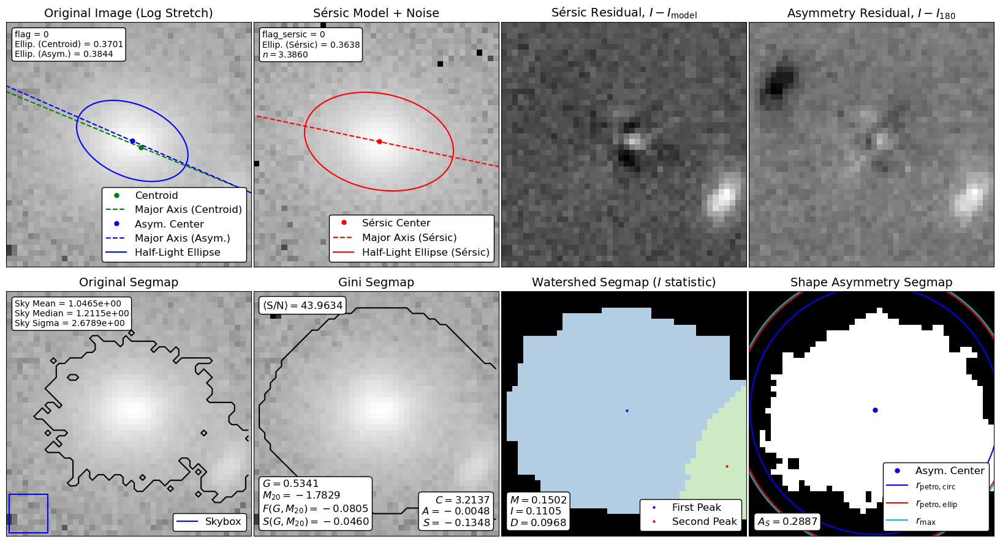

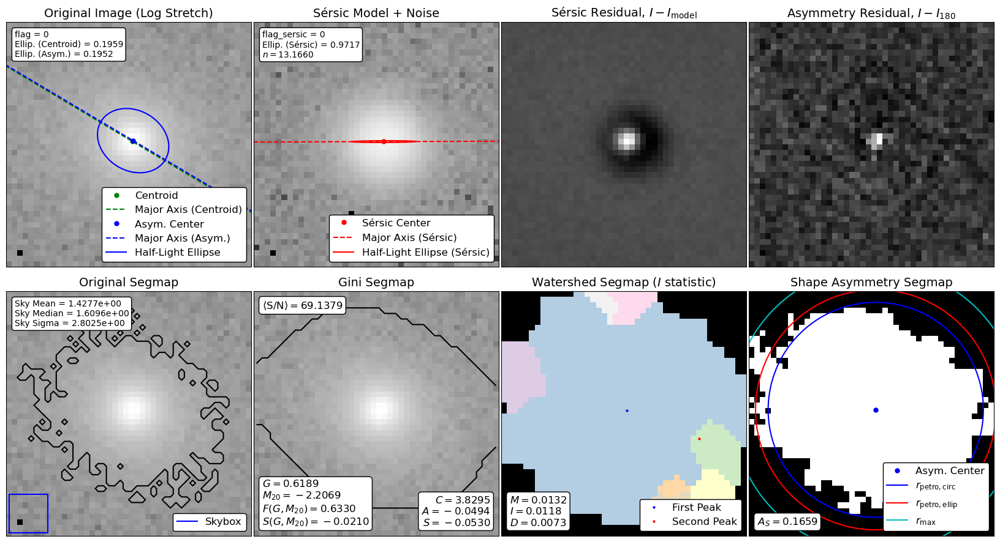

In [35]:
for file in data[:10]:
    file_path=path+non_lensed+file
    image, header = fits.getdata(file_path, header=True)
    rms_path=path+RMS+file
    rms,rms_header=fits.getdata(rms_path,header=True)
    psf_path=path+PSF+file
    psf,psf_header=fits.getdata(psf_path,header=True)
    
    threshold=detect_threshold(image,1.5,0.43)
    segm = detect_sources(image, threshold, npixels=5)
    
    Mask=mask(segm)
    segm_map=galaxy_map(segm)
    
    # construction de la rms
    
    weight_map=1/rms
    
    #estimation of the background
    #let's take the median estimator
    source_morphs = statmorph.source_morphology(image, segm_map, weightmap=weight_map, mask=Mask,psf=psf)
    morph = source_morphs[0]
    print(file)
    print(f'flag_sersic={morph.flag_sersic}')
    print(f'flag={morph.flag}')
    print('sersic_amplitude =', morph.sersic_amplitude)
    print('sersic_rhalf =', morph.sersic_rhalf)
    print('sersic_n =', morph.sersic_n)
    print('sersic_xc =', morph.sersic_xc)
    print('sersic_yc =', morph.sersic_yc)
    print('sersic_ellip =', morph.sersic_ellip)
    print('sersic_theta =', morph.sersic_theta,'\n')
    fig = make_figure(morph)

## Application on non_lensed and lensed data
WARNING to the RMS building for lensed images

In [36]:
###First non_lensed data

lrg_sersic_flag={'file':[],'warning':[],'sersic_amplitude':[],'sersic_rhalf':[],'sersic_n':[],'sersic_xc':[],'sersic_yc':[],
                 'sersic_ellip':[],'sersic_theta':[],'asymetry':[],'concentration':[],'deviation':[],'gini':[],'intensity':[],
                 'm20':[],'rpetro_circ':[],'smoothness':[]}
lrg_flag={'file':[],'warning':[],'sersic_amplitude':[],'sersic_rhalf':[],'sersic_n':[],'sersic_xc':[],'sersic_yc':[],
          'sersic_ellip':[],'sersic_theta':[],'asymetry':[],'concentration':[],'deviation':[],'gini':[],'intensity':[],
          'm20':[],'rpetro_circ':[],'smoothness':[]}
lrg_defaulting={'file':[],'warning':[]}
lrg_working={'file':[],'sersic_amplitude':[],'sersic_rhalf':[],'sersic_n':[],'sersic_xc':[],'sersic_yc':[],
             'sersic_ellip':[],'sersic_theta':[],'asymetry':[],'concentration':[],'deviation':[],'gini':[],'intensity':[],
             'm20':[],'rpetro_circ':[],'smoothness':[]}

for file in choice(data,1000,replace=False):
    file_path=path+non_lensed+file
    image, header = fits.getdata(file_path, header=True)
    rms_path=path+RMS+file
    rms,rms_header=fits.getdata(rms_path,header=True)
    psf_path=path+PSF+file
    psf,psf_header=fits.getdata(psf_path,header=True)
    
    threshold=detect_threshold(image,1.5,0.43)
    segm = detect_sources(image, threshold, npixels=5)
    
    Mask=mask(segm)
    segm_map=galaxy_map(segm)
    
    # construction de la rms
    
    weight_map=1/rms
    
    #estimation of the background
    #let's take the median estimator
    try:
        source_morphs = statmorph.source_morphology(image, segm_map, weightmap=weight_map, mask=Mask,psf=psf)
        morph = source_morphs[0]
        if morph.flag_sersic==1:
            with warnings.catch_warnings(record=True) as w:
                warnings.simplefilter("always")
                lrg_sersic_flag['file'].append(file)
                lrg_sersic_flag['warning'].append(w)
                lrg_sersic_flag['sersic_amplitude'].append(morph.sersic_amplitude)
                lrg_sersic_flag['sersic_rhalf'].append(morph.sersic_rhalf)
                lrg_sersic_flag['sersic_n'].append(morph.sersic_n)
                lrg_sersic_flag['sersic_xc'].append(morph.sersic_xc)
                lrg_sersic_flag['sersic_yc'].append(morph.sersic_yc)
                lrg_sersic_flag['sersic_ellip'].append(morph.sersic_ellip)
                lrg_sersic_flag['sersic_theta'].append(morph.sersic_theta)
                lrg_sersic_flag['asymetry'].append(morph.asymmetry)
                lrg_sersic_flag['concentration'].append(morph.concentration)
                lrg_sersic_flag['deviation'].append(morph.deviation)
                lrg_sersic_flag['gini'].append(morph.gini)
                lrg_sersic_flag['intensity'].append(morph.intensity)
                lrg_sersic_flag['m20'].append(morph.m20)
                lrg_sersic_flag['rpetro_circ'].append(morph.rpetro_circ)
                lrg_sersic_flag['smoothness'].append(morph.smoothness)
        elif morph.flag==1:
            with warnings.catch_warnings(record=True) as w:
                warnings.simplefilter("always")
                lrg_flag['file'].append(file)
                lrg_flag['warning'].append(w)
                lrg_flag['sersic_amplitude'].append(morph.sersic_amplitude)
                lrg_flag['sersic_rhalf'].append(morph.sersic_rhalf)
                lrg_flag['sersic_n'].append(morph.sersic_n)
                lrg_flag['sersic_xc'].append(morph.sersic_xc)
                lrg_flag['sersic_yc'].append(morph.sersic_yc)
                lrg_flag['sersic_ellip'].append(morph.sersic_ellip)
                lrg_flag['sersic_theta'].append(morph.sersic_theta)
                lrg_flag['asymetry'].append(morph.asymmetry)
                lrg_flag['concentration'].append(morph.concentration)
                lrg_flag['deviation'].append(morph.deviation)
                lrg_flag['gini'].append(morph.gini)
                lrg_flag['intensity'].append(morph.intensity)
                lrg_flag['m20'].append(morph.m20)
                lrg_flag['rpetro_circ'].append(morph.rpetro_circ)
                lrg_flag['smoothness'].append(morph.smoothness)
        else:
            lrg_working['file'].append(file)
            lrg_working['sersic_amplitude'].append(morph.sersic_amplitude)
            lrg_working['sersic_rhalf'].append(morph.sersic_rhalf)
            lrg_working['sersic_n'].append(morph.sersic_n)
            lrg_working['sersic_xc'].append(morph.sersic_xc)
            lrg_working['sersic_yc'].append(morph.sersic_yc)
            lrg_working['sersic_ellip'].append(morph.sersic_ellip)
            lrg_working['sersic_theta'].append(morph.sersic_theta)
            lrg_working['asymetry'].append(morph.asymmetry)
            lrg_working['concentration'].append(morph.concentration)
            lrg_working['deviation'].append(morph.deviation)
            lrg_working['gini'].append(morph.gini)
            lrg_working['intensity'].append(morph.intensity)
            lrg_working['m20'].append(morph.m20)
            lrg_working['rpetro_circ'].append(morph.rpetro_circ)
            lrg_working['smoothness'].append(morph.smoothness)
    except:
        with warnings.catch_warnings(record=True) as w:
            warnings.simplefilter("always")
            lrg_defaulting['file'].append(file)
            lrg_defaulting['warning'].append(w)

In [37]:
len(lrg_working['file'])/1000

0.544

In [38]:
###First non_lensed data

lens_sersic_flag={'file':[],'warning':[],'sersic_amplitude':[],'sersic_rhalf':[],'sersic_n':[],'sersic_xc':[],'sersic_yc':[],
                  'sersic_ellip':[],'sersic_theta':[],'asymetry':[],'concentration':[],'deviation':[],'gini':[],'intensity':[],
                  'm20':[],'rpetro_circ':[],'smoothness':[]}
lens_flag={'file':[],'warning':[],'sersic_amplitude':[],'sersic_rhalf':[],'sersic_n':[],'sersic_xc':[],'sersic_yc':[],
           'sersic_ellip':[],'sersic_theta':[],'asymetry':[],'concentration':[],'deviation':[],'gini':[],'intensity':[],
           'm20':[],'rpetro_circ':[],'smoothness':[]}
lens_defaulting={'file':[],'warning':[]}
lens_working={'file':[],'sersic_amplitude':[],'sersic_rhalf':[],'sersic_n':[],'sersic_xc':[],'sersic_yc':[],
              'sersic_ellip':[],'sersic_theta':[],'asymetry':[],'concentration':[],'deviation':[],'gini':[],'intensity':[],
              'm20':[],'rpetro_circ':[],'smoothness':[]}

for file in choice(data,1000,replace=False):
    file_path=path+lensed+file
    image, header = fits.getdata(file_path, header=True)
    
    threshold=detect_threshold(image,1.5,0.43)
    segm = detect_sources(image, threshold, npixels=5)
    
    Mask=mask(segm)
    segm_map=galaxy_map(segm)
    
    # construction de la rms
    source_path=path+lensed_source+file
    rms_path=path+RMS+file
    lrg_path=path+non_lensed+file
    psf_path=path+PSF+file
    
    source,source_header=fits.getdata(source_path, header=True)
    rms,rms_header=fits.getdata(rms_path,header=True)
    lrg,lrg_header=fits.getdata(lrg_path,header=True)
    psf,psf_header=fits.getdata(psf_path,header=True)
    
    gain=lrg_header['GAIN']
    source_rms=source/gain
    
    total_rms=rms+source_rms
    
    weight_map=1/total_rms
    
    #estimation of the background
    #let's take the median estimator
    try:
        source_morphs = statmorph.source_morphology(image, segm_map, weightmap=weight_map, mask=Mask,psf=psf)
        morph = source_morphs[0]
        if morph.flag_sersic==1:
            with warnings.catch_warnings(record=True) as w:
                warnings.simplefilter("always")
                lens_sersic_flag['file'].append(file)
                lens_sersic_flag['warning'].append(w)
                lens_sersic_flag['sersic_amplitude'].append(morph.sersic_amplitude)
                lens_sersic_flag['sersic_rhalf'].append(morph.sersic_rhalf)
                lens_sersic_flag['sersic_n'].append(morph.sersic_n)
                lens_sersic_flag['sersic_xc'].append(morph.sersic_xc)
                lens_sersic_flag['sersic_yc'].append(morph.sersic_yc)
                lens_sersic_flag['sersic_ellip'].append(morph.sersic_ellip)
                lens_sersic_flag['sersic_theta'].append(morph.sersic_theta)
                lens_sersic_flag['asymetry'].append(morph.asymmetry)
                lens_sersic_flag['concentration'].append(morph.concentration)
                lens_sersic_flag['deviation'].append(morph.deviation)
                lens_sersic_flag['gini'].append(morph.gini)
                lens_sersic_flag['intensity'].append(morph.intensity)
                lens_sersic_flag['m20'].append(morph.m20)
                lens_sersic_flag['rpetro_circ'].append(morph.rpetro_circ)
                lens_sersic_flag['smoothness'].append(morph.smoothness)
        elif morph.flag==1:
            with warnings.catch_warnings(record=True) as w:
                warnings.simplefilter("always")
                lens_flag['file'].append(file)
                lens_flag['warning'].append(w)
                lens_flag['sersic_amplitude'].append(morph.sersic_amplitude)
                lens_flag['sersic_rhalf'].append(morph.sersic_rhalf)
                lens_flag['sersic_n'].append(morph.sersic_n)
                lens_flag['sersic_xc'].append(morph.sersic_xc)
                lens_flag['sersic_yc'].append(morph.sersic_yc)
                lens_flag['sersic_ellip'].append(morph.sersic_ellip)
                lens_flag['sersic_theta'].append(morph.sersic_theta)
                lens_flag['asymetry'].append(morph.asymmetry)
                lens_flag['concentration'].append(morph.concentration)
                lens_flag['deviation'].append(morph.deviation)
                lens_flag['gini'].append(morph.gini)
                lens_flag['intensity'].append(morph.intensity)
                lens_flag['m20'].append(morph.m20)
                lens_flag['rpetro_circ'].append(morph.rpetro_circ)
                lens_flag['smoothness'].append(morph.smoothness)
        else:
            lens_working['file'].append(file)
            lens_working['sersic_amplitude'].append(morph.sersic_amplitude)
            lens_working['sersic_rhalf'].append(morph.sersic_rhalf)
            lens_working['sersic_n'].append(morph.sersic_n)
            lens_working['sersic_xc'].append(morph.sersic_xc)
            lens_working['sersic_yc'].append(morph.sersic_yc)
            lens_working['sersic_ellip'].append(morph.sersic_ellip)
            lens_working['sersic_theta'].append(morph.sersic_theta)
            lens_working['asymetry'].append(morph.asymmetry)
            lens_working['concentration'].append(morph.concentration)
            lens_working['deviation'].append(morph.deviation)
            lens_working['gini'].append(morph.gini)
            lens_working['intensity'].append(morph.intensity)
            lens_working['m20'].append(morph.m20)
            lens_working['rpetro_circ'].append(morph.rpetro_circ)
            lens_working['smoothness'].append(morph.smoothness)
    except:
        with warnings.catch_warnings(record=True) as w:
            warnings.simplefilter("always")
            lens_defaulting['file'].append(file)
            lens_defaulting['warning'].append(w)

/home/clement/anaconda3/envs/memoire/lib/python3.11/site-packages/astropy/modeling/functional_models.py:3109: RuntimeWarning: overflow encountered in power
  return amplitude * np.exp(-bn * (z ** (1 / n) - 1))
/home/clement/anaconda3/envs/memoire/lib/python3.11/site-packages/astropy/modeling/functional_models.py:3109: RuntimeWarning: overflow encountered in power
  return amplitude * np.exp(-bn * (z ** (1 / n) - 1))
/home/clement/anaconda3/envs/memoire/lib/python3.11/site-packages/astropy/modeling/functional_models.py:3109: RuntimeWarning: overflow encountered in power
  return amplitude * np.exp(-bn * (z ** (1 / n) - 1))


In [39]:
(len(lens_working['file']))/1000

0.525

## Data vis

In [40]:
len(lrg_working['file'])+len(lens_working['file'])

1069

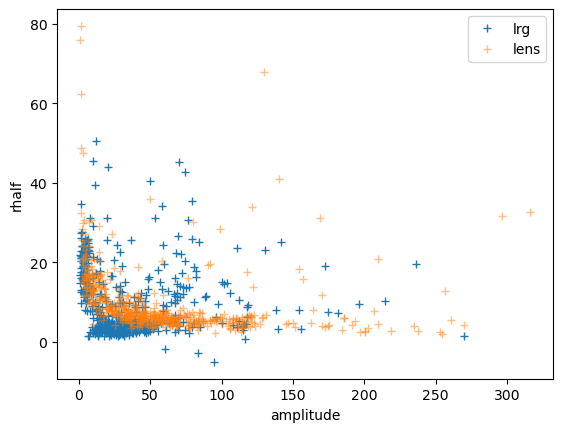

In [41]:
plt.plot(lrg_working['sersic_amplitude'],lrg_working['sersic_rhalf'],'+',label='lrg')
plt.plot(lens_working['sersic_amplitude'],lens_working['sersic_rhalf'],'+',label='lens',alpha=0.5)
plt.xlabel('amplitude')
plt.ylabel('rhalf')
plt.legend()
plt.show()

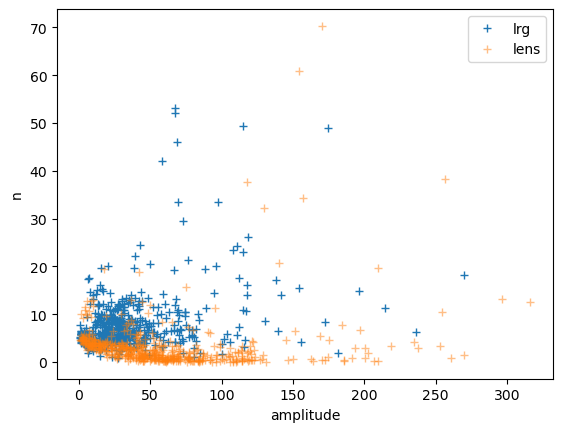

In [42]:
plt.plot(lrg_working['sersic_amplitude'],lrg_working['sersic_n'],'+',label='lrg')
plt.plot(lens_working['sersic_amplitude'],lens_working['sersic_n'],'+',label='lens',alpha=0.5)
plt.xlabel('amplitude')
plt.ylabel('n')
plt.legend()
plt.show()

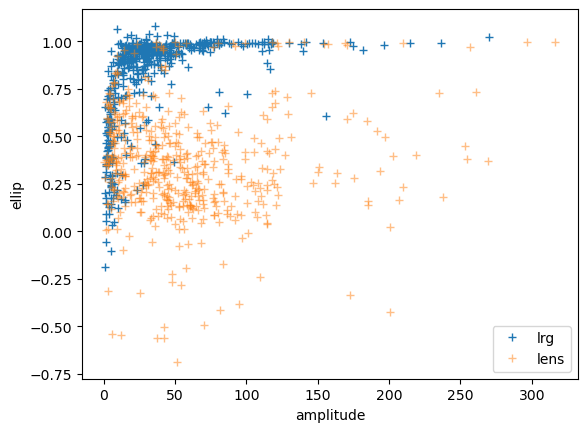

In [43]:
plt.plot(lrg_working['sersic_amplitude'],lrg_working['sersic_ellip'],'+',label='lrg')
plt.plot(lens_working['sersic_amplitude'],lens_working['sersic_ellip'],'+',label='lens',alpha=0.5)
plt.xlabel('amplitude')
plt.ylabel('ellip')
plt.legend()
plt.show()

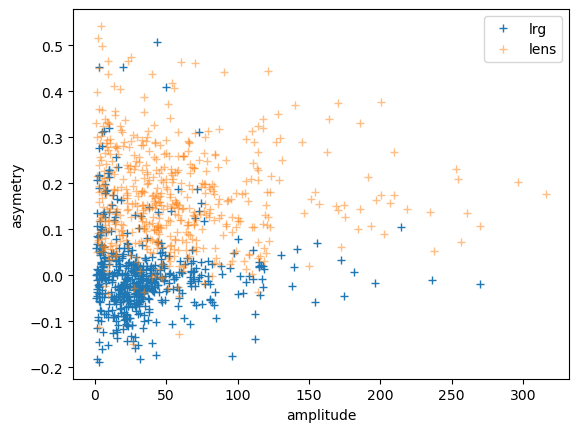

In [44]:
#A RECOMMENCER = remettre tous les bons indices pour obtenir tous les graphs
plt.plot(lrg_working['sersic_amplitude'],lrg_working['asymetry'],'+',label='lrg')
plt.plot(lens_working['sersic_amplitude'],lens_working['asymetry'],'+',label='lens',alpha=0.5)
plt.xlabel('amplitude')
plt.ylabel('asymetry')
plt.legend()
plt.show()

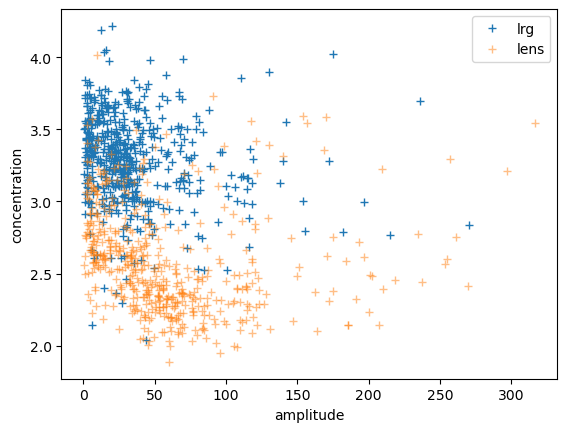

In [45]:
plt.plot(lrg_working['sersic_amplitude'],lrg_working['concentration'],'+',label='lrg')
plt.plot(lens_working['sersic_amplitude'],lens_working['concentration'],'+',label='lens',alpha=0.5)
plt.xlabel('amplitude')
plt.ylabel('concentration')
plt.legend()
plt.show()

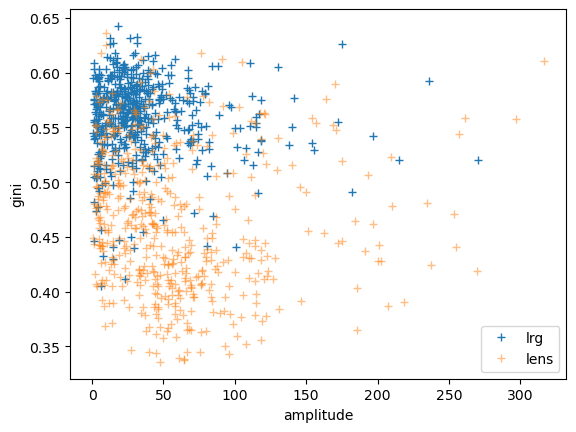

In [46]:
plt.plot(lrg_working['sersic_amplitude'],lrg_working['gini'],'+',label='lrg')
plt.plot(lens_working['sersic_amplitude'],lens_working['gini'],'+',label='lens',alpha=0.5)
plt.xlabel('amplitude')
plt.ylabel('gini')
plt.legend()
plt.show()

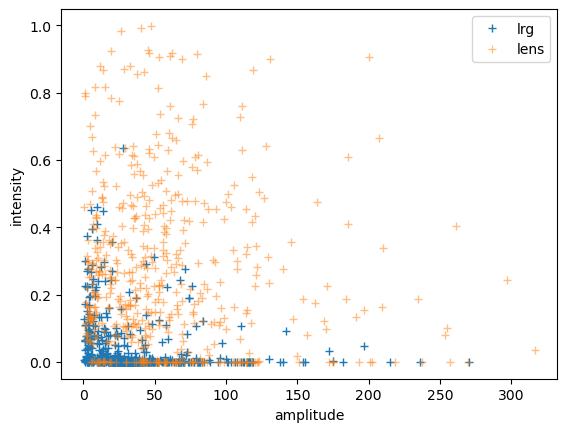

In [47]:
plt.plot(lrg_working['sersic_amplitude'],lrg_working['intensity'],'+',label='lrg')
plt.plot(lens_working['sersic_amplitude'],lens_working['intensity'],'+',label='lens',alpha=0.5)
plt.xlabel('amplitude')
plt.ylabel('intensity')
plt.legend()
plt.show()

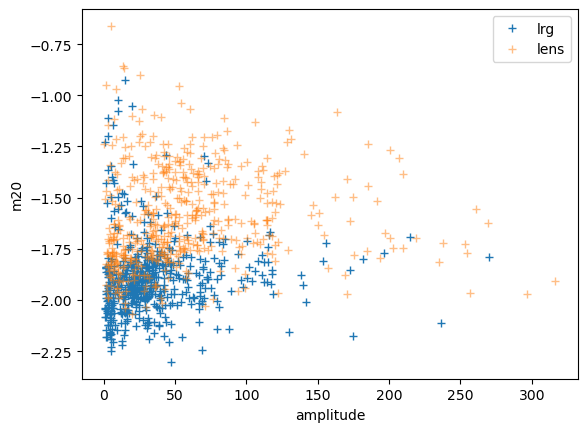

In [48]:
plt.plot(lrg_working['sersic_amplitude'],lrg_working['m20'],'+',label='lrg')
plt.plot(lens_working['sersic_amplitude'],lens_working['m20'],'+',label='lens',alpha=0.5)
plt.xlabel('amplitude')
plt.ylabel('m20')
plt.legend()
plt.show()

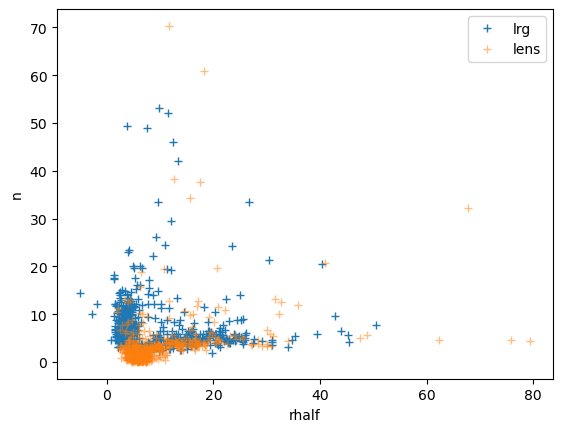

In [49]:
plt.plot(lrg_working['sersic_rhalf'],lrg_working['sersic_n'],'+',label='lrg')
plt.plot(lens_working['sersic_rhalf'],lens_working['sersic_n'],'+',label='lens',alpha=0.5)
plt.xlabel('rhalf')
plt.ylabel('n')
plt.legend()
plt.show()

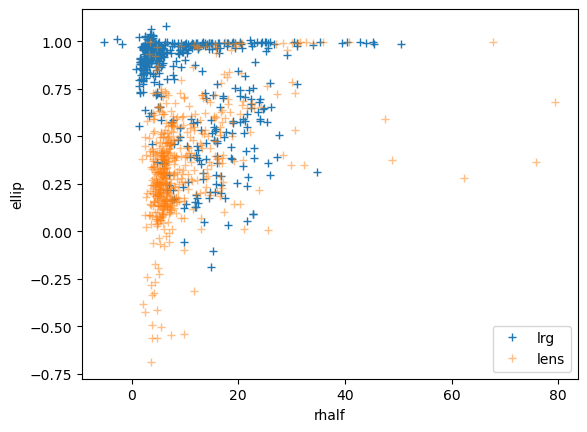

In [50]:
plt.plot(lrg_working['sersic_rhalf'],lrg_working['sersic_ellip'],'+',label='lrg')
plt.plot(lens_working['sersic_rhalf'],lens_working['sersic_ellip'],'+',label='lens',alpha=0.5)
plt.xlabel('rhalf')
plt.ylabel('ellip')
plt.legend()
plt.show()

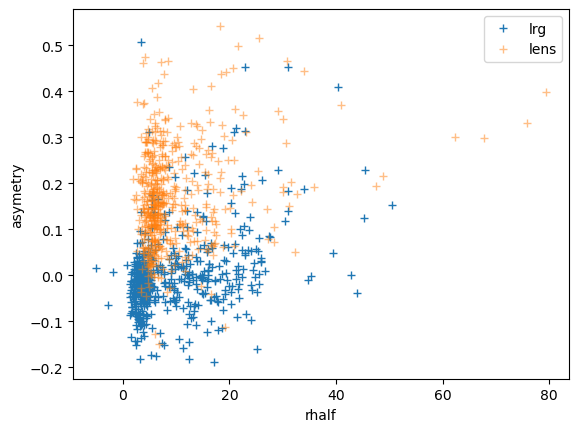

In [51]:
plt.plot(lrg_working['sersic_rhalf'],lrg_working['asymetry'],'+',label='lrg')
plt.plot(lens_working['sersic_rhalf'],lens_working['asymetry'],'+',label='lens',alpha=0.5)
plt.xlabel('rhalf')
plt.ylabel('asymetry')
plt.legend()
plt.show()

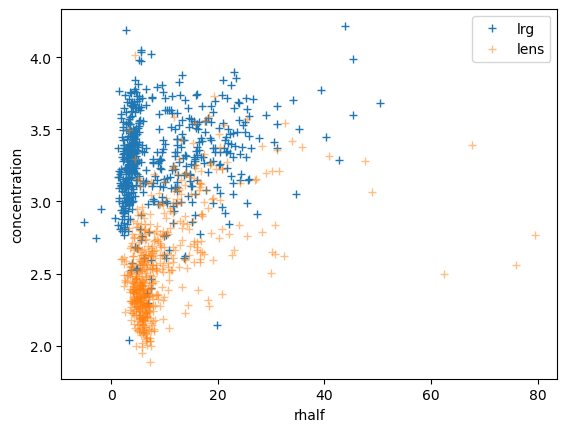

In [52]:
plt.plot(lrg_working['sersic_rhalf'],lrg_working['concentration'],'+',label='lrg')
plt.plot(lens_working['sersic_rhalf'],lens_working['concentration'],'+',label='lens',alpha=0.5)
plt.xlabel('rhalf')
plt.ylabel('concentration')
plt.legend()
plt.show()

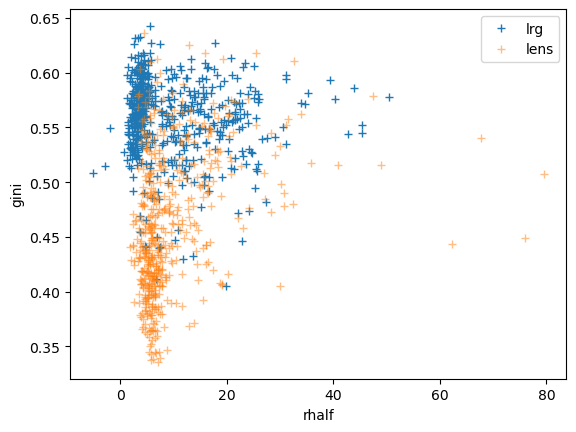

In [53]:
plt.plot(lrg_working['sersic_rhalf'],lrg_working['gini'],'+',label='lrg')
plt.plot(lens_working['sersic_rhalf'],lens_working['gini'],'+',label='lens',alpha=0.5)
plt.xlabel('rhalf')
plt.ylabel('gini')
plt.legend()
plt.show()

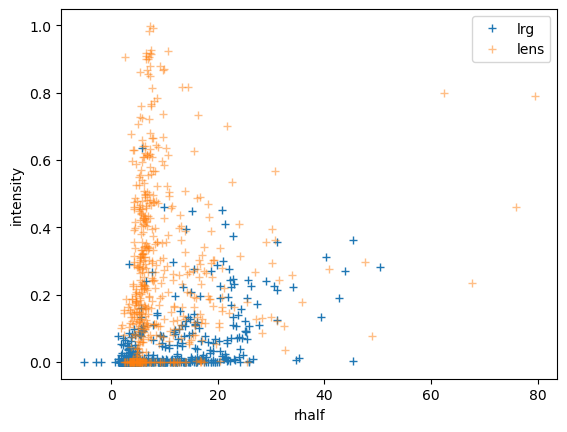

In [54]:
plt.plot(lrg_working['sersic_rhalf'],lrg_working['intensity'],'+',label='lrg')
plt.plot(lens_working['sersic_rhalf'],lens_working['intensity'],'+',label='lens',alpha=0.5)
plt.xlabel('rhalf')
plt.ylabel('intensity')
plt.legend()
plt.show()

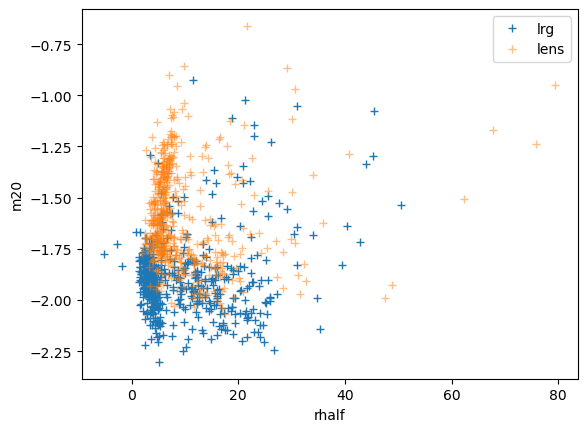

In [55]:
plt.plot(lrg_working['sersic_rhalf'],lrg_working['m20'],'+',label='lrg')
plt.plot(lens_working['sersic_rhalf'],lens_working['m20'],'+',label='lens',alpha=0.5)
plt.xlabel('rhalf')
plt.ylabel('m20')
plt.legend()
plt.show()

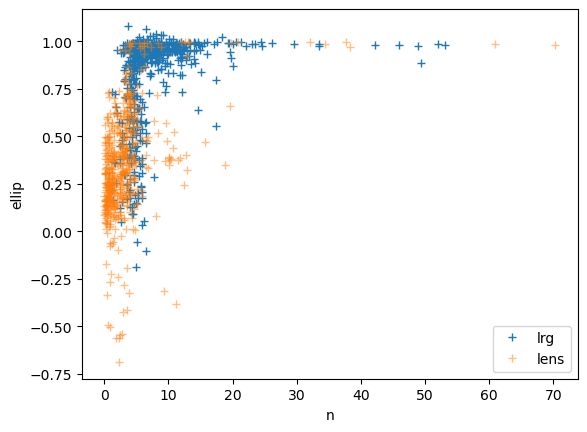

In [56]:
plt.plot(lrg_working['sersic_n'],lrg_working['sersic_ellip'],'+',label='lrg')
plt.plot(lens_working['sersic_n'],lens_working['sersic_ellip'],'+',label='lens',alpha=0.5)
plt.xlabel('n')
plt.ylabel('ellip')
plt.legend()
plt.show()

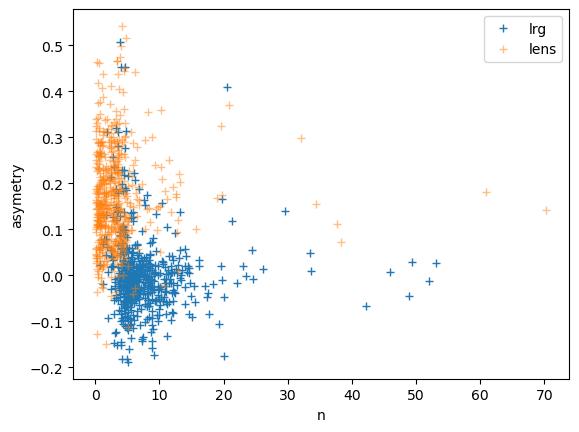

In [57]:
plt.plot(lrg_working['sersic_n'],lrg_working['asymetry'],'+',label='lrg')
plt.plot(lens_working['sersic_n'],lens_working['asymetry'],'+',label='lens',alpha=0.5)
plt.xlabel('n')
plt.ylabel('asymetry')
plt.legend()
plt.show()

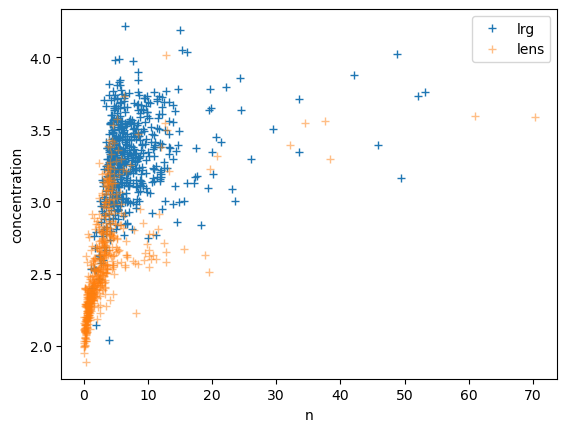

In [58]:
plt.plot(lrg_working['sersic_n'],lrg_working['concentration'],'+',label='lrg')
plt.plot(lens_working['sersic_n'],lens_working['concentration'],'+',label='lens',alpha=0.5)
plt.xlabel('n')
plt.ylabel('concentration')
plt.legend()
plt.show()

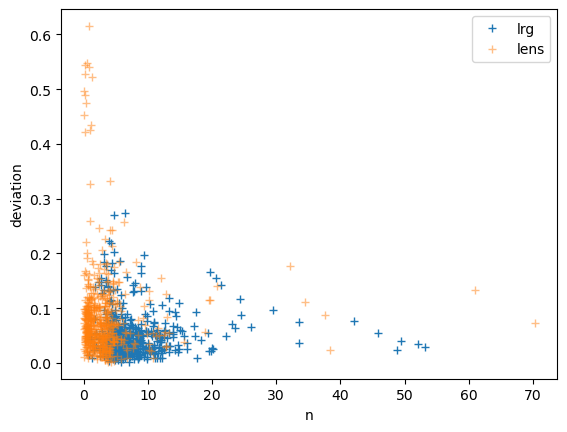

In [59]:
plt.plot(lrg_working['sersic_n'],lrg_working['deviation'],'+',label='lrg')
plt.plot(lens_working['sersic_n'],lens_working['deviation'],'+',label='lens',alpha=0.5)
plt.xlabel('n')
plt.ylabel('deviation')
plt.legend()
plt.show()

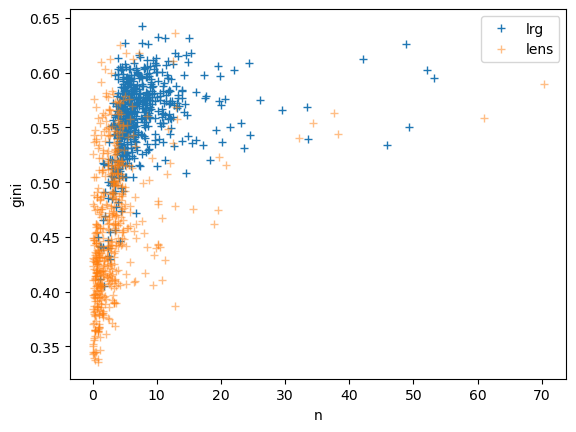

In [60]:
plt.plot(lrg_working['sersic_n'],lrg_working['gini'],'+',label='lrg')
plt.plot(lens_working['sersic_n'],lens_working['gini'],'+',label='lens',alpha=0.5)
plt.xlabel('n')
plt.ylabel('gini')
plt.legend()
plt.show()

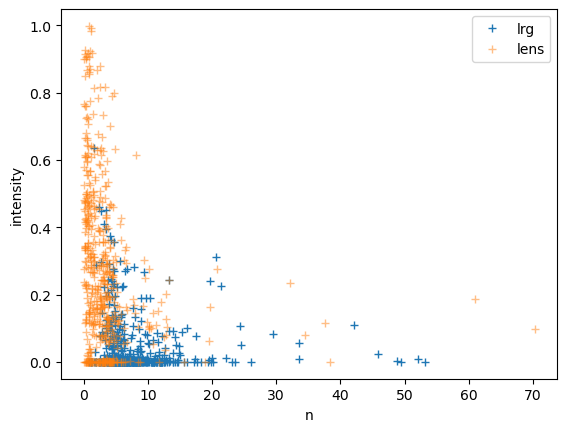

In [61]:
plt.plot(lrg_working['sersic_n'],lrg_working['intensity'],'+',label='lrg')
plt.plot(lens_working['sersic_n'],lens_working['intensity'],'+',label='lens',alpha=0.5)
plt.xlabel('n')
plt.ylabel('intensity')
plt.legend()
plt.show()

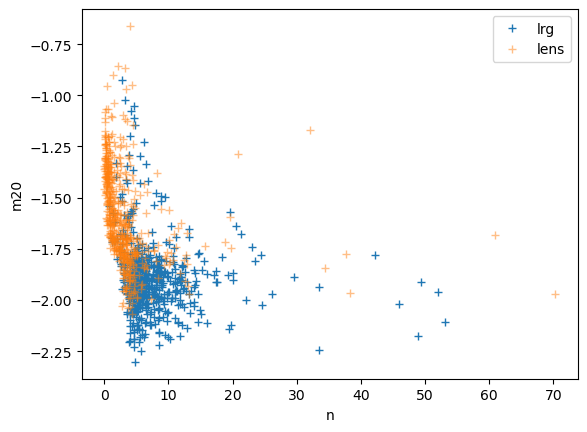

In [62]:
plt.plot(lrg_working['sersic_n'],lrg_working['m20'],'+',label='lrg')
plt.plot(lens_working['sersic_n'],lens_working['m20'],'+',label='lens',alpha=0.5)
plt.xlabel('n')
plt.ylabel('m20')
plt.legend()
plt.show()

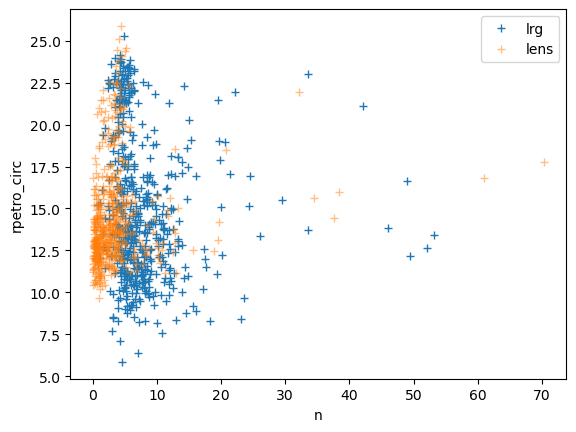

In [63]:
plt.plot(lrg_working['sersic_n'],lrg_working['rpetro_circ'],'+',label='lrg')
plt.plot(lens_working['sersic_n'],lens_working['rpetro_circ'],'+',label='lens',alpha=0.5)
plt.xlabel('n')
plt.ylabel('rpetro_circ')
plt.legend()
plt.show()

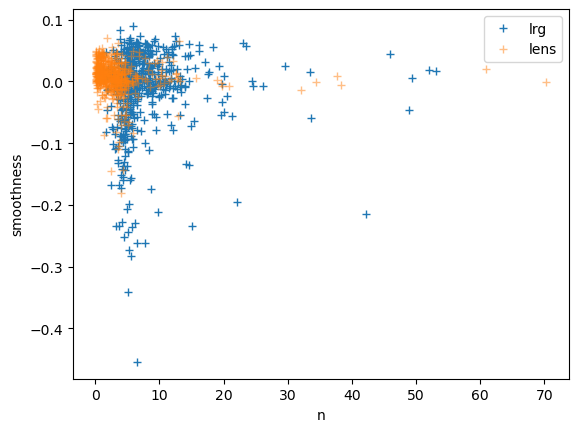

In [64]:
plt.plot(lrg_working['sersic_n'],lrg_working['smoothness'],'+',label='lrg')
plt.plot(lens_working['sersic_n'],lens_working['smoothness'],'+',label='lens',alpha=0.5)
plt.xlabel('n')
plt.ylabel('smoothness')
plt.legend()
plt.show()

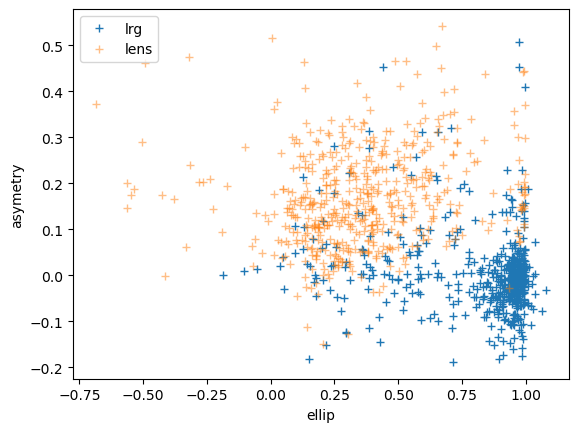

In [65]:
plt.plot(lrg_working['sersic_ellip'],lrg_working['asymetry'],'+',label='lrg')
plt.plot(lens_working['sersic_ellip'],lens_working['asymetry'],'+',label='lens',alpha=0.5)
plt.xlabel('ellip')
plt.ylabel('asymetry')
plt.legend()
plt.show()

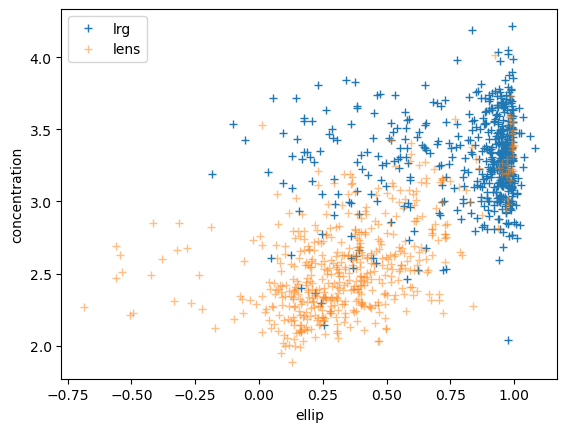

In [66]:
plt.plot(lrg_working['sersic_ellip'],lrg_working['concentration'],'+',label='lrg')
plt.plot(lens_working['sersic_ellip'],lens_working['concentration'],'+',label='lens',alpha=0.5)
plt.xlabel('ellip')
plt.ylabel('concentration')
plt.legend()
plt.show()

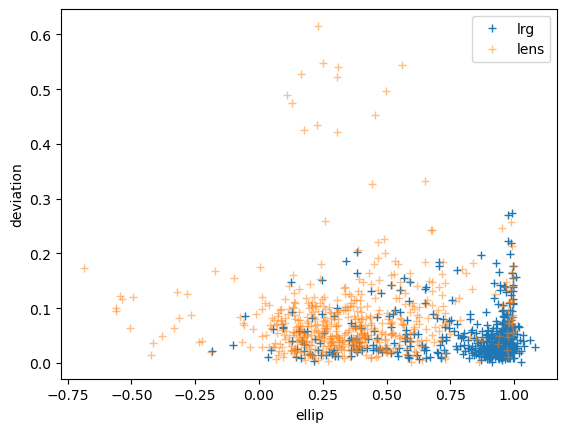

In [67]:
plt.plot(lrg_working['sersic_ellip'],lrg_working['deviation'],'+',label='lrg')
plt.plot(lens_working['sersic_ellip'],lens_working['deviation'],'+',label='lens',alpha=0.5)
plt.xlabel('ellip')
plt.ylabel('deviation')
plt.legend()
plt.show()

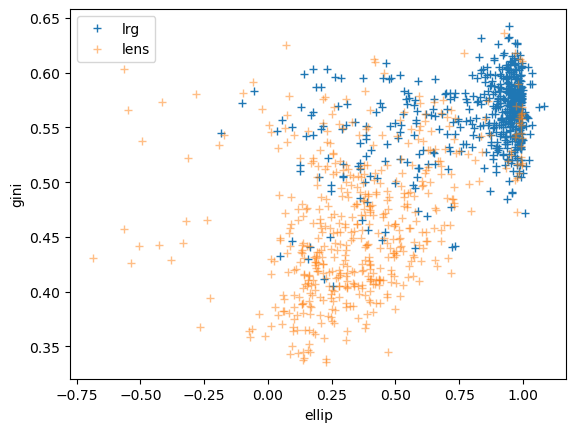

In [68]:
plt.plot(lrg_working['sersic_ellip'],lrg_working['gini'],'+',label='lrg')
plt.plot(lens_working['sersic_ellip'],lens_working['gini'],'+',label='lens',alpha=0.5)
plt.xlabel('ellip')
plt.ylabel('gini')
plt.legend()
plt.show()

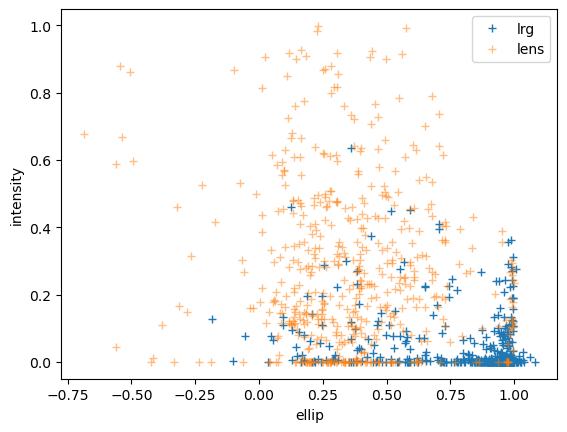

In [69]:
plt.plot(lrg_working['sersic_ellip'],lrg_working['intensity'],'+',label='lrg')
plt.plot(lens_working['sersic_ellip'],lens_working['intensity'],'+',label='lens',alpha=0.5)
plt.xlabel('ellip')
plt.ylabel('intensity')
plt.legend()
plt.show()

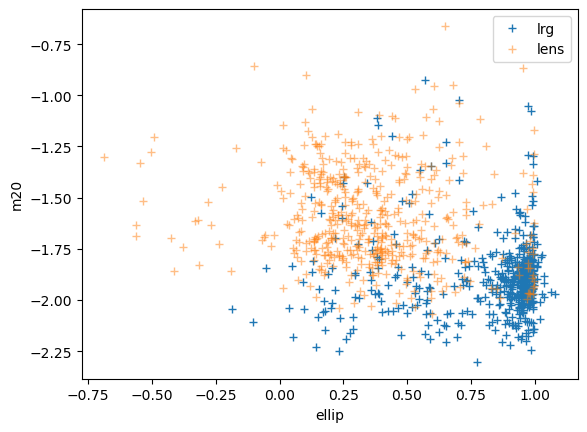

In [70]:
plt.plot(lrg_working['sersic_ellip'],lrg_working['m20'],'+',label='lrg')
plt.plot(lens_working['sersic_ellip'],lens_working['m20'],'+',label='lens',alpha=0.5)
plt.xlabel('ellip')
plt.ylabel('m20')
plt.legend()
plt.show()

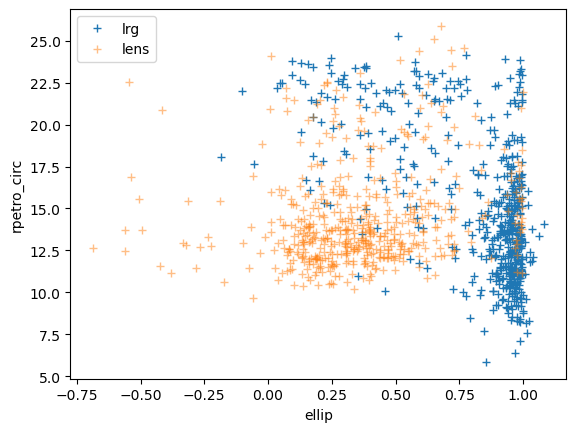

In [71]:
plt.plot(lrg_working['sersic_ellip'],lrg_working['rpetro_circ'],'+',label='lrg')
plt.plot(lens_working['sersic_ellip'],lens_working['rpetro_circ'],'+',label='lens',alpha=0.5)
plt.xlabel('ellip')
plt.ylabel('rpetro_circ')
plt.legend()
plt.show()

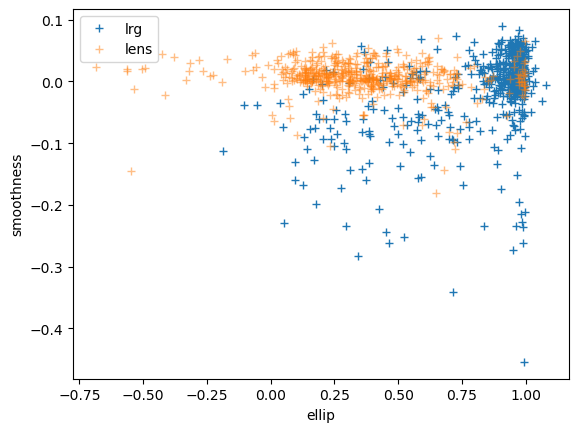

In [72]:
plt.plot(lrg_working['sersic_ellip'],lrg_working['smoothness'],'+',label='lrg')
plt.plot(lens_working['sersic_ellip'],lens_working['smoothness'],'+',label='lens',alpha=0.5)
plt.xlabel('ellip')
plt.ylabel('smoothness')
plt.legend()
plt.show()

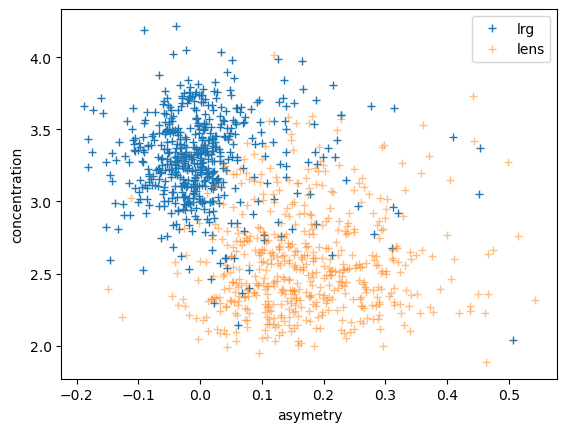

In [73]:
plt.plot(lrg_working['asymetry'],lrg_working['concentration'],'+',label='lrg')
plt.plot(lens_working['asymetry'],lens_working['concentration'],'+',label='lens',alpha=0.5)
plt.xlabel('asymetry')
plt.ylabel('concentration')
plt.legend()
plt.show()

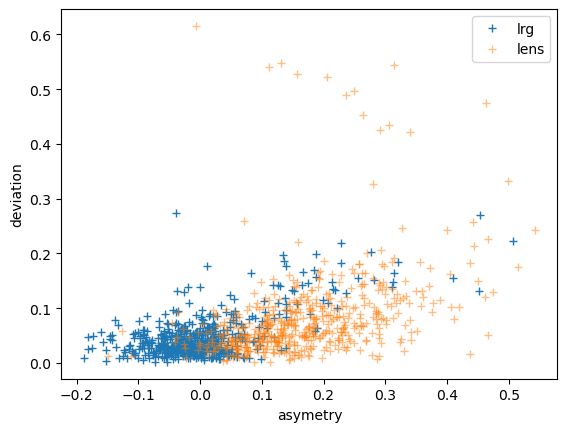

In [74]:
plt.plot(lrg_working['asymetry'],lrg_working['deviation'],'+',label='lrg')
plt.plot(lens_working['asymetry'],lens_working['deviation'],'+',label='lens',alpha=0.5)
plt.xlabel('asymetry')
plt.ylabel('deviation')
plt.legend()
plt.show()

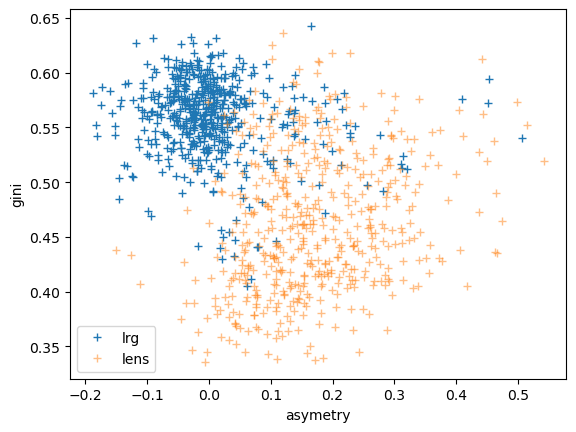

In [75]:
plt.plot(lrg_working['asymetry'],lrg_working['gini'],'+',label='lrg')
plt.plot(lens_working['asymetry'],lens_working['gini'],'+',label='lens',alpha=0.5)
plt.xlabel('asymetry')
plt.ylabel('gini')
plt.legend()
plt.show()

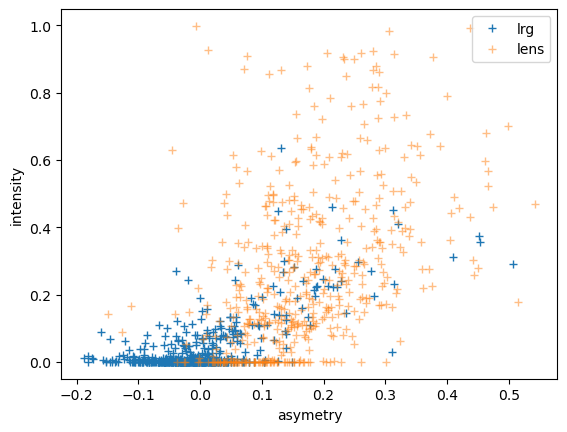

In [76]:
plt.plot(lrg_working['asymetry'],lrg_working['intensity'],'+',label='lrg')
plt.plot(lens_working['asymetry'],lens_working['intensity'],'+',label='lens',alpha=0.5)
plt.xlabel('asymetry')
plt.ylabel('intensity')
plt.legend()
plt.show()

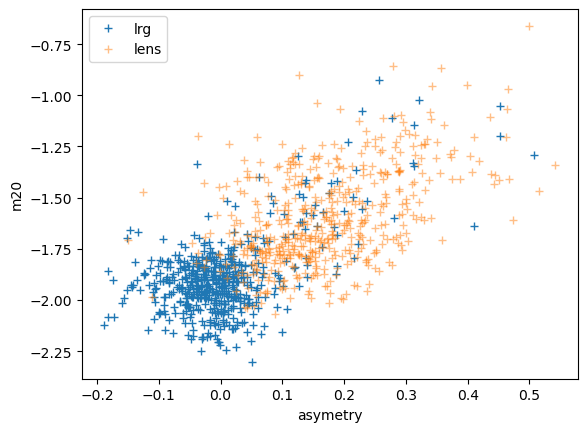

In [77]:
plt.plot(lrg_working['asymetry'],lrg_working['m20'],'+',label='lrg')
plt.plot(lens_working['asymetry'],lens_working['m20'],'+',label='lens',alpha=0.5)
plt.xlabel('asymetry')
plt.ylabel('m20')
plt.legend()
plt.show()

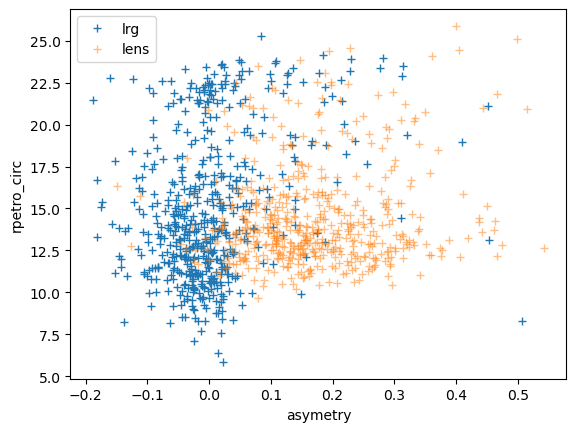

In [78]:
plt.plot(lrg_working['asymetry'],lrg_working['rpetro_circ'],'+',label='lrg')
plt.plot(lens_working['asymetry'],lens_working['rpetro_circ'],'+',label='lens',alpha=0.5)
plt.xlabel('asymetry')
plt.ylabel('rpetro_circ')
plt.legend()
plt.show()

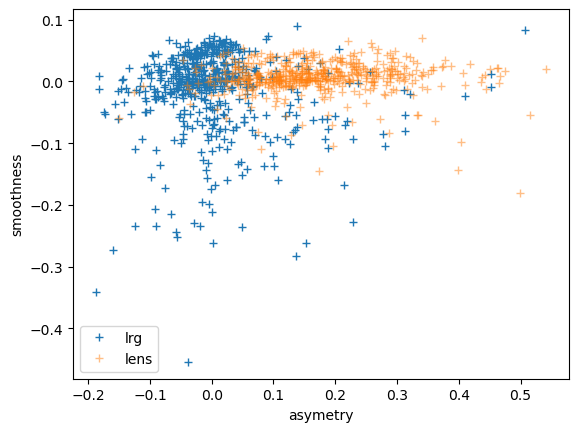

In [79]:
plt.plot(lrg_working['asymetry'],lrg_working['smoothness'],'+',label='lrg')
plt.plot(lens_working['asymetry'],lens_working['smoothness'],'+',label='lens',alpha=0.5)
plt.xlabel('asymetry')
plt.ylabel('smoothness')
plt.legend()
plt.show()

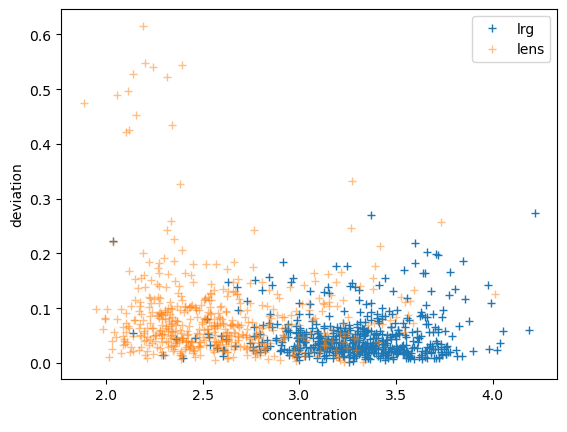

In [80]:
plt.plot(lrg_working['concentration'],lrg_working['deviation'],'+',label='lrg')
plt.plot(lens_working['concentration'],lens_working['deviation'],'+',label='lens',alpha=0.5)
plt.xlabel('concentration')
plt.ylabel('deviation')
plt.legend()
plt.show()

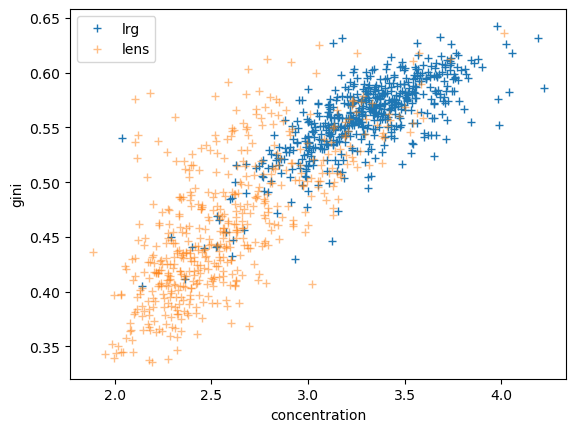

In [81]:
plt.plot(lrg_working['concentration'],lrg_working['gini'],'+',label='lrg')
plt.plot(lens_working['concentration'],lens_working['gini'],'+',label='lens',alpha=0.5)
plt.xlabel('concentration')
plt.ylabel('gini')
plt.legend()
plt.show()

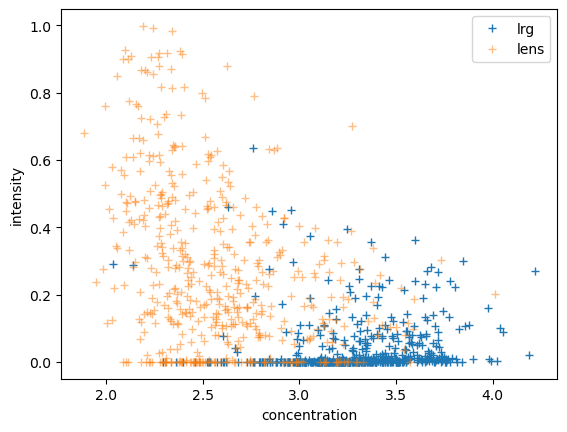

In [82]:
plt.plot(lrg_working['concentration'],lrg_working['intensity'],'+',label='lrg')
plt.plot(lens_working['concentration'],lens_working['intensity'],'+',label='lens',alpha=0.5)
plt.xlabel('concentration')
plt.ylabel('intensity')
plt.legend()
plt.show()

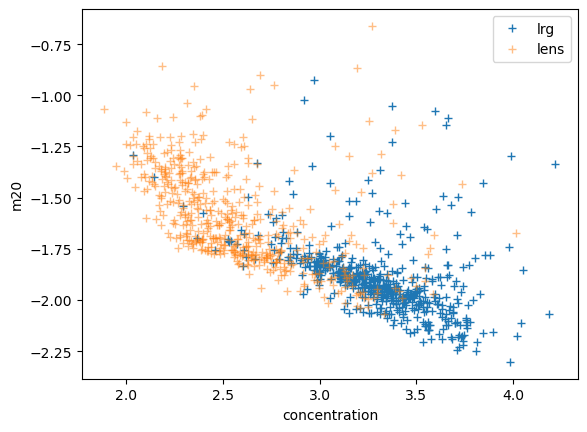

In [83]:
plt.plot(lrg_working['concentration'],lrg_working['m20'],'+',label='lrg')
plt.plot(lens_working['concentration'],lens_working['m20'],'+',label='lens',alpha=0.5)
plt.xlabel('concentration')
plt.ylabel('m20')
plt.legend()
plt.show()

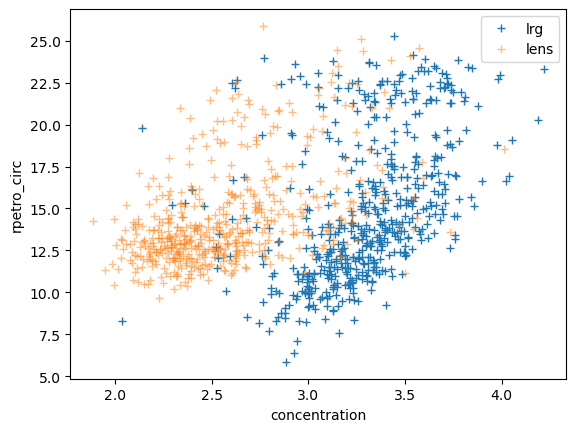

In [84]:
plt.plot(lrg_working['concentration'],lrg_working['rpetro_circ'],'+',label='lrg')
plt.plot(lens_working['concentration'],lens_working['rpetro_circ'],'+',label='lens',alpha=0.5)
plt.xlabel('concentration')
plt.ylabel('rpetro_circ')
plt.legend()
plt.show()

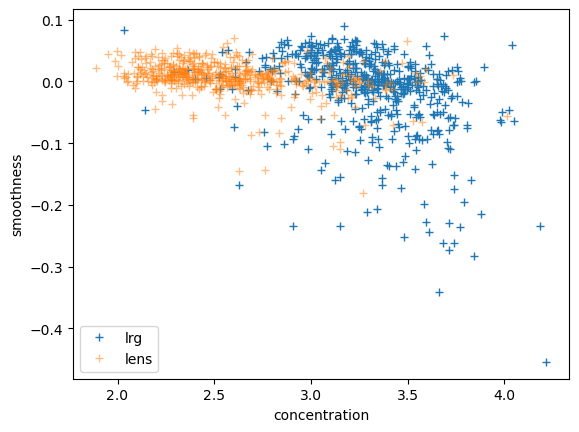

In [85]:
plt.plot(lrg_working['concentration'],lrg_working['smoothness'],'+',label='lrg')
plt.plot(lens_working['concentration'],lens_working['smoothness'],'+',label='lens',alpha=0.5)
plt.xlabel('concentration')
plt.ylabel('smoothness')
plt.legend()
plt.show()

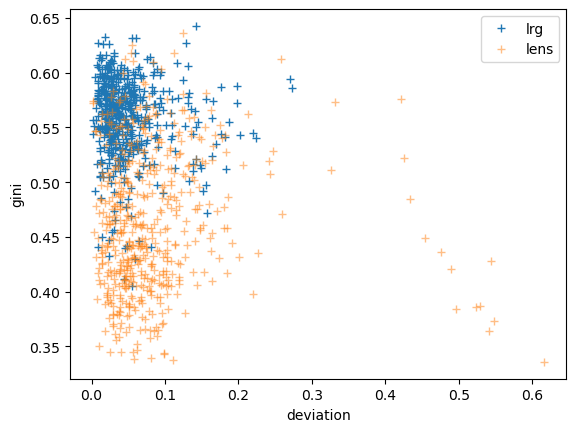

In [86]:
plt.plot(lrg_working['deviation'],lrg_working['gini'],'+',label='lrg')
plt.plot(lens_working['deviation'],lens_working['gini'],'+',label='lens',alpha=0.5)
plt.xlabel('deviation')
plt.ylabel('gini')
plt.legend()
plt.show()

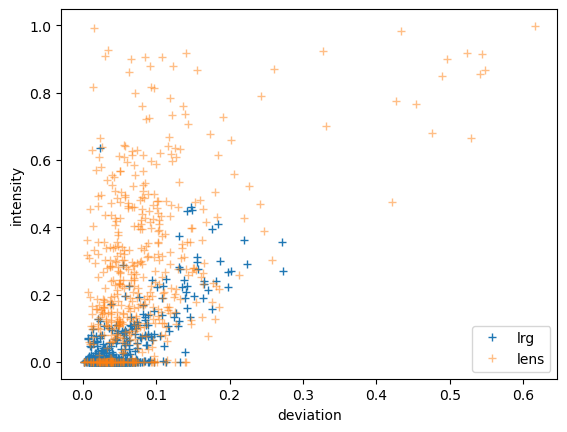

In [87]:
plt.plot(lrg_working['deviation'],lrg_working['intensity'],'+',label='lrg')
plt.plot(lens_working['deviation'],lens_working['intensity'],'+',label='lens',alpha=0.5)
plt.xlabel('deviation')
plt.ylabel('intensity')
plt.legend()
plt.show()

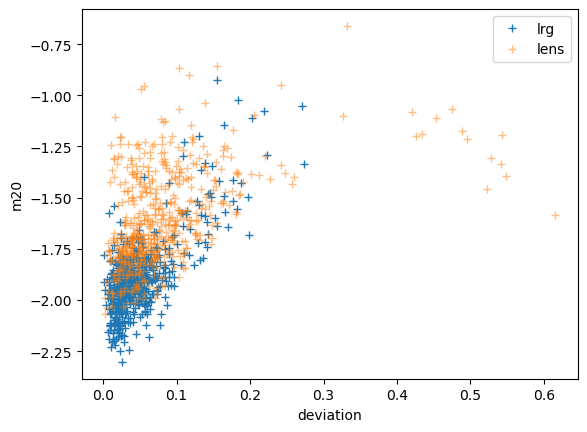

In [88]:
plt.plot(lrg_working['deviation'],lrg_working['m20'],'+',label='lrg')
plt.plot(lens_working['deviation'],lens_working['m20'],'+',label='lens',alpha=0.5)
plt.xlabel('deviation')
plt.ylabel('m20')
plt.legend()
plt.show()

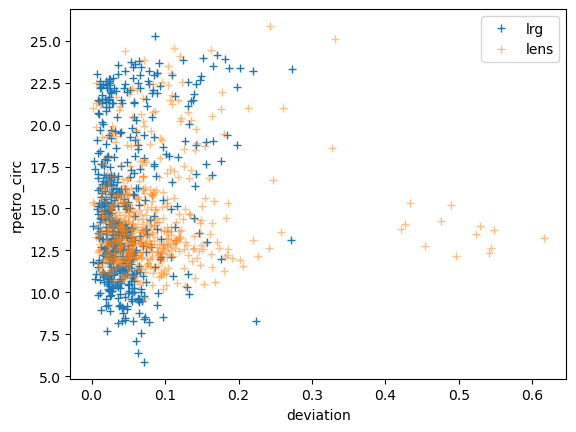

In [89]:
plt.plot(lrg_working['deviation'],lrg_working['rpetro_circ'],'+',label='lrg')
plt.plot(lens_working['deviation'],lens_working['rpetro_circ'],'+',label='lens',alpha=0.5)
plt.xlabel('deviation')
plt.ylabel('rpetro_circ')
plt.legend()
plt.show()

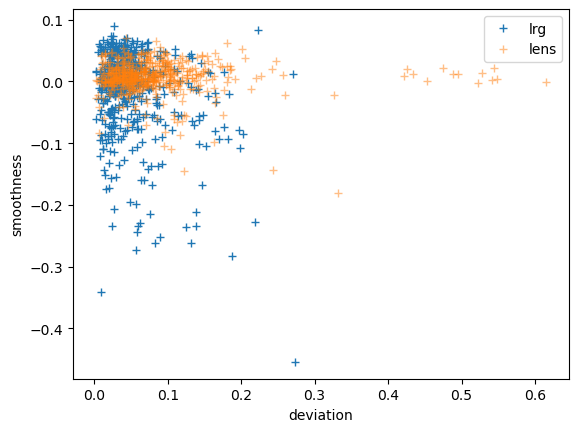

In [90]:
plt.plot(lrg_working['deviation'],lrg_working['smoothness'],'+',label='lrg')
plt.plot(lens_working['deviation'],lens_working['smoothness'],'+',label='lens',alpha=0.5)
plt.xlabel('deviation')
plt.ylabel('smoothness')
plt.legend()
plt.show()

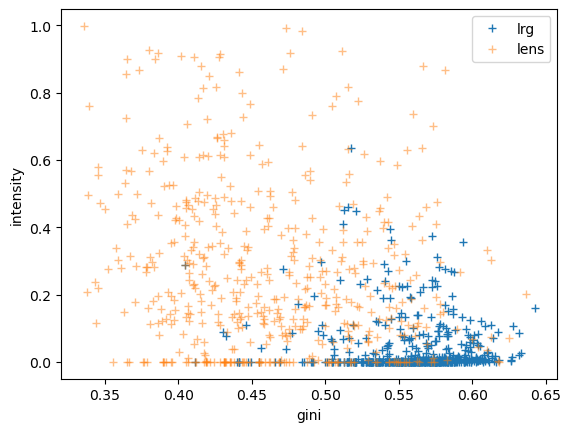

In [91]:
plt.plot(lrg_working['gini'],lrg_working['intensity'],'+',label='lrg')
plt.plot(lens_working['gini'],lens_working['intensity'],'+',label='lens',alpha=0.5)
plt.xlabel('gini')
plt.ylabel('intensity')
plt.legend()
plt.show()

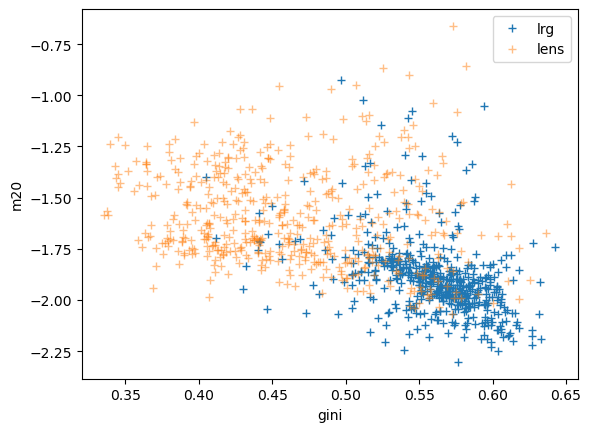

In [92]:
plt.plot(lrg_working['gini'],lrg_working['m20'],'+',label='lrg')
plt.plot(lens_working['gini'],lens_working['m20'],'+',label='lens',alpha=0.5)
plt.xlabel('gini')
plt.ylabel('m20')
plt.legend()
plt.show()

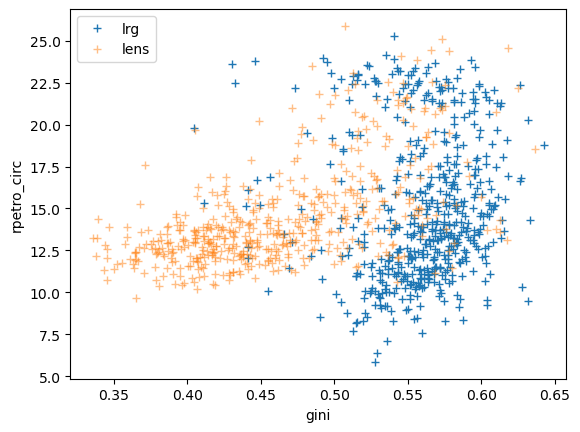

In [93]:
plt.plot(lrg_working['gini'],lrg_working['rpetro_circ'],'+',label='lrg')
plt.plot(lens_working['gini'],lens_working['rpetro_circ'],'+',label='lens',alpha=0.5)
plt.xlabel('gini')
plt.ylabel('rpetro_circ')
plt.legend()
plt.show()

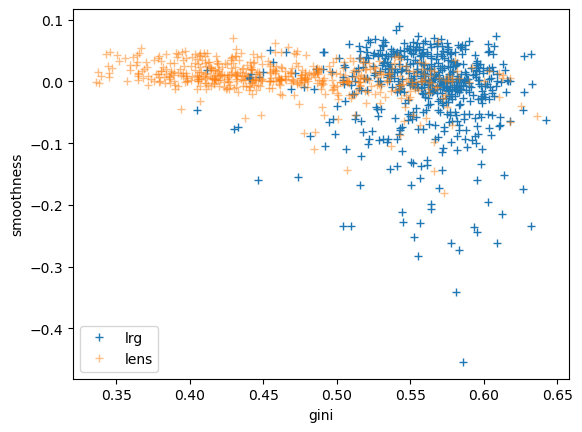

In [94]:
plt.plot(lrg_working['gini'],lrg_working['smoothness'],'+',label='lrg')
plt.plot(lens_working['gini'],lens_working['smoothness'],'+',label='lens',alpha=0.5)
plt.xlabel('gini')
plt.ylabel('smoothness')
plt.legend()
plt.show()

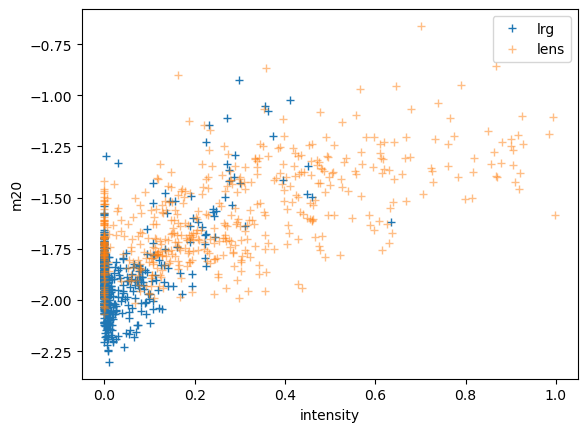

In [95]:
plt.plot(lrg_working['intensity'],lrg_working['m20'],'+',label='lrg')
plt.plot(lens_working['intensity'],lens_working['m20'],'+',label='lens',alpha=0.5)
plt.xlabel('intensity')
plt.ylabel('m20')
plt.legend()
plt.show()

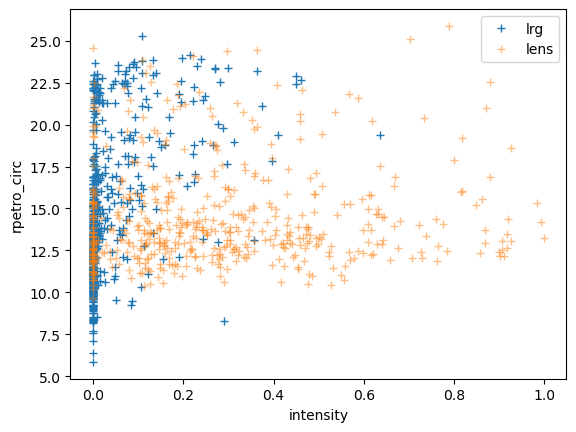

In [96]:
plt.plot(lrg_working['intensity'],lrg_working['rpetro_circ'],'+',label='lrg')
plt.plot(lens_working['intensity'],lens_working['rpetro_circ'],'+',label='lens',alpha=0.5)
plt.xlabel('intensity')
plt.ylabel('rpetro_circ')
plt.legend()
plt.show()

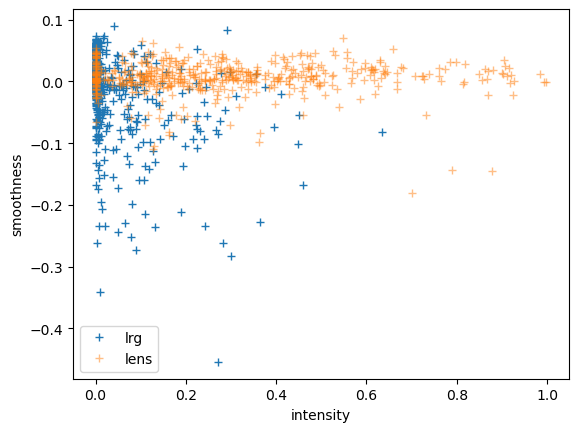

In [97]:
plt.plot(lrg_working['intensity'],lrg_working['smoothness'],'+',label='lrg')
plt.plot(lens_working['intensity'],lens_working['smoothness'],'+',label='lens',alpha=0.5)
plt.xlabel('intensity')
plt.ylabel('smoothness')
plt.legend()
plt.show()

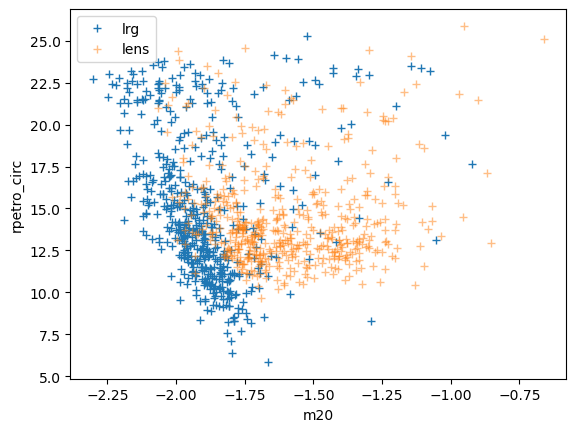

In [98]:
plt.plot(lrg_working['m20'],lrg_working['rpetro_circ'],'+',label='lrg')
plt.plot(lens_working['m20'],lens_working['rpetro_circ'],'+',label='lens',alpha=0.5)
plt.xlabel('m20')
plt.ylabel('rpetro_circ')
plt.legend()
plt.show()

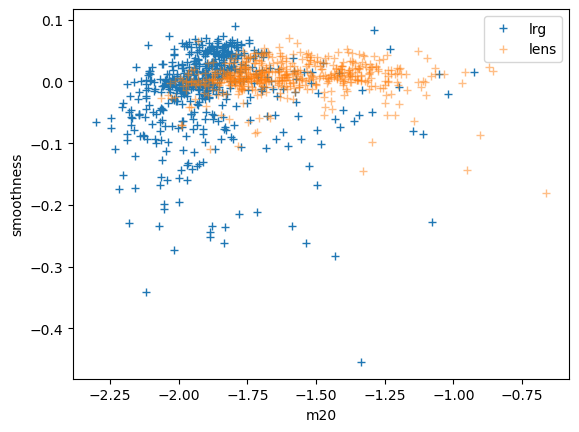

In [99]:
plt.plot(lrg_working['m20'],lrg_working['smoothness'],'+',label='lrg')
plt.plot(lens_working['m20'],lens_working['smoothness'],'+',label='lens',alpha=0.5)
plt.xlabel('m20')
plt.ylabel('smoothness')
plt.legend()
plt.show()

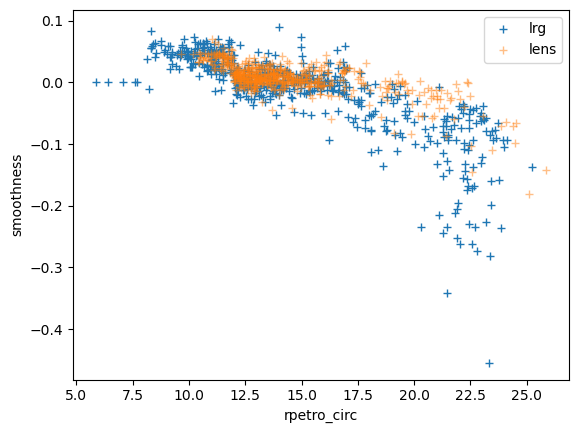

In [100]:
plt.plot(lrg_working['rpetro_circ'],lrg_working['smoothness'],'+',label='lrg')
plt.plot(lens_working['rpetro_circ'],lens_working['smoothness'],'+',label='lens',alpha=0.5)
plt.xlabel('rpetro_circ')
plt.ylabel('smoothness')
plt.legend()
plt.show()

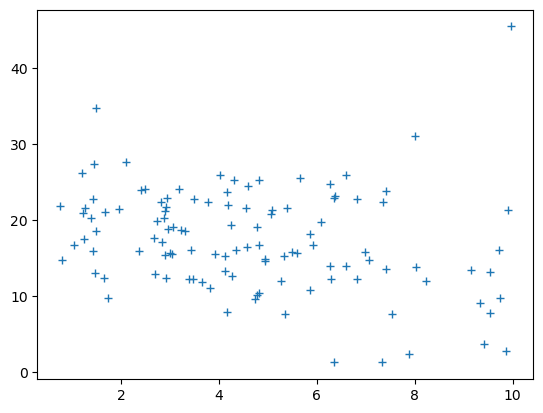

In [101]:
low_amp_arg=np.where(np.array(lrg_working['sersic_amplitude'])<=10)
plt.plot(np.array(lrg_working['sersic_amplitude'])[low_amp_arg],np.array(lrg_working['sersic_rhalf'])[low_amp_arg],'+')
low_amp_file=np.array(lrg_working['file'])[low_amp_arg]

## Low Amp

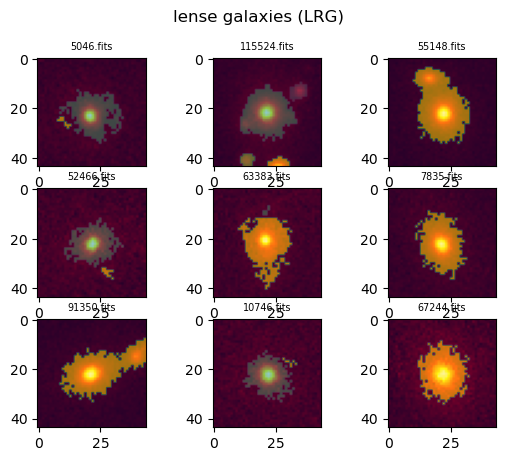

In [102]:
for count, file in zip(range(1,10),choice(low_amp_file,9,replace=False)):
    file_path=path+non_lensed+file
    image, header = fits.getdata(file_path, header=True)
    
    threshold=detect_threshold(image,1.5)
    segm = detect_sources(image, threshold, npixels=5)

    plt.suptitle('lense galaxies (LRG)')
    plt.subplot(330+count)
    plt.title(file, fontsize='x-small')
    plt.imshow(image, cmap='hot')
    plt.imshow(segm.data,alpha=0.5)
plt.show()

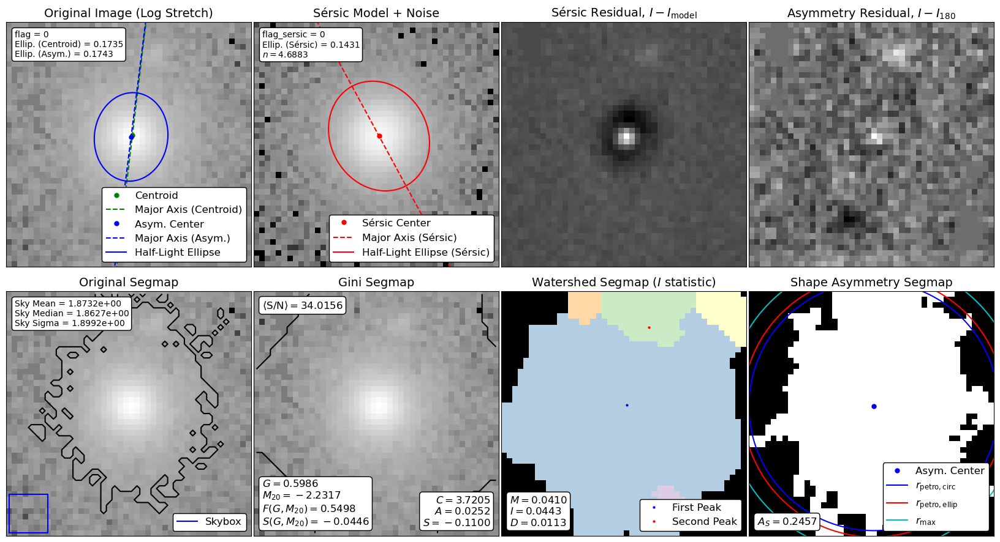

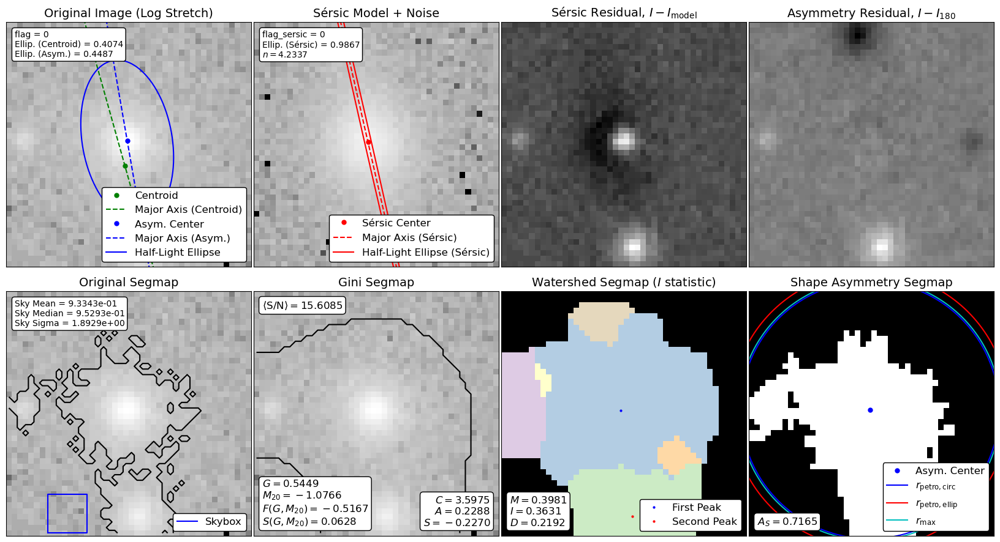

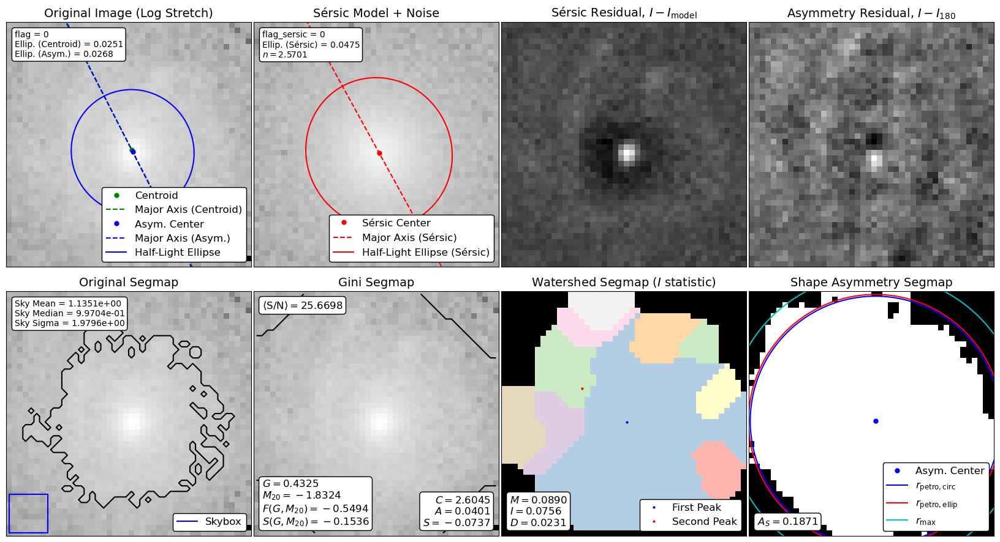

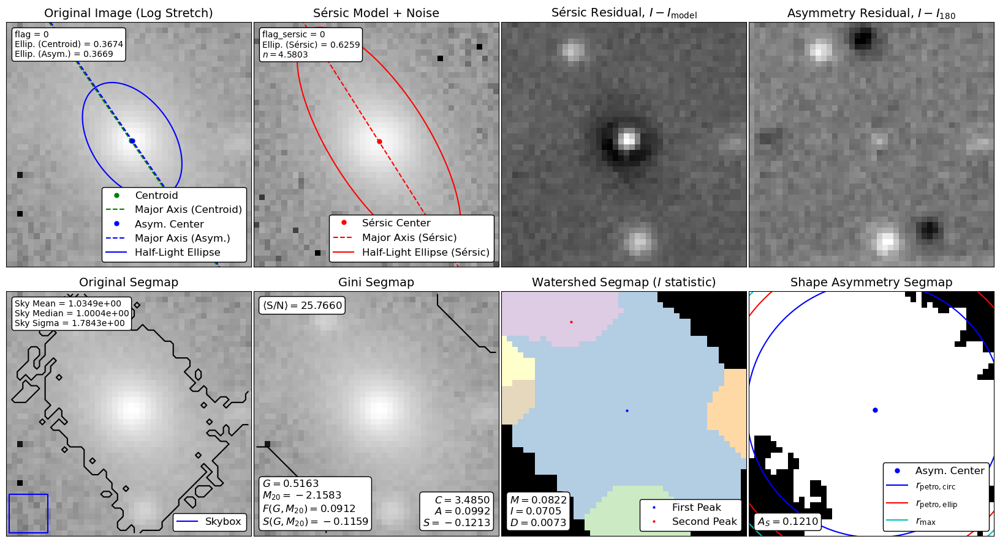

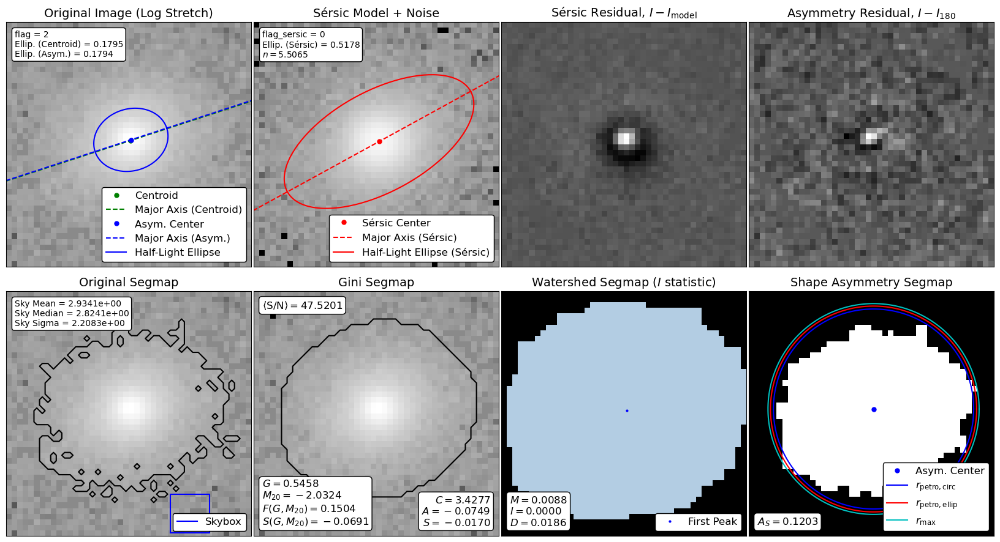

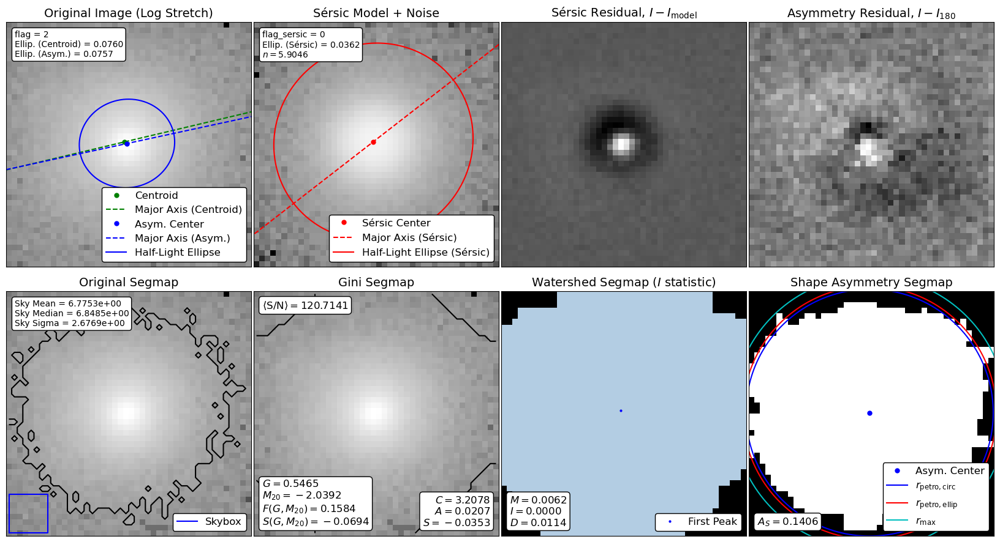

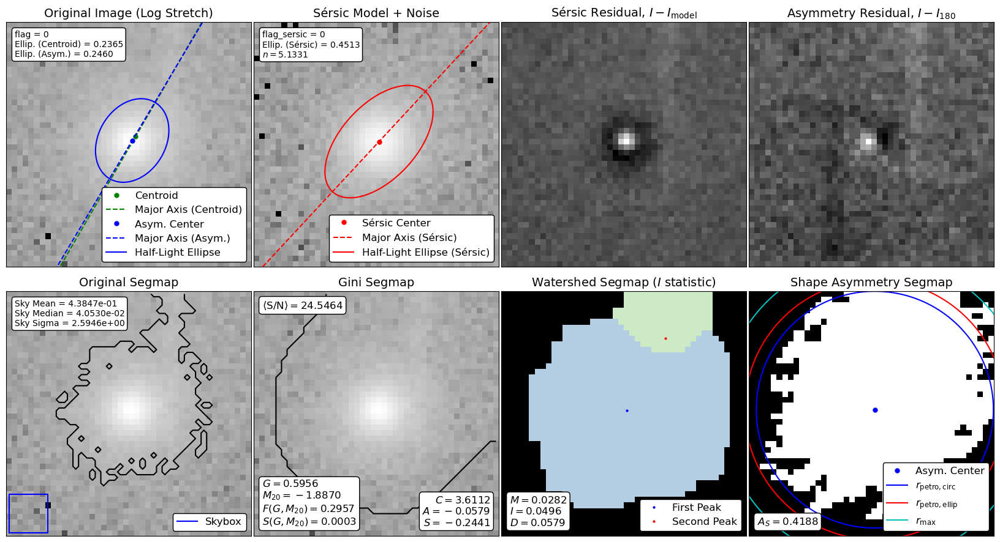

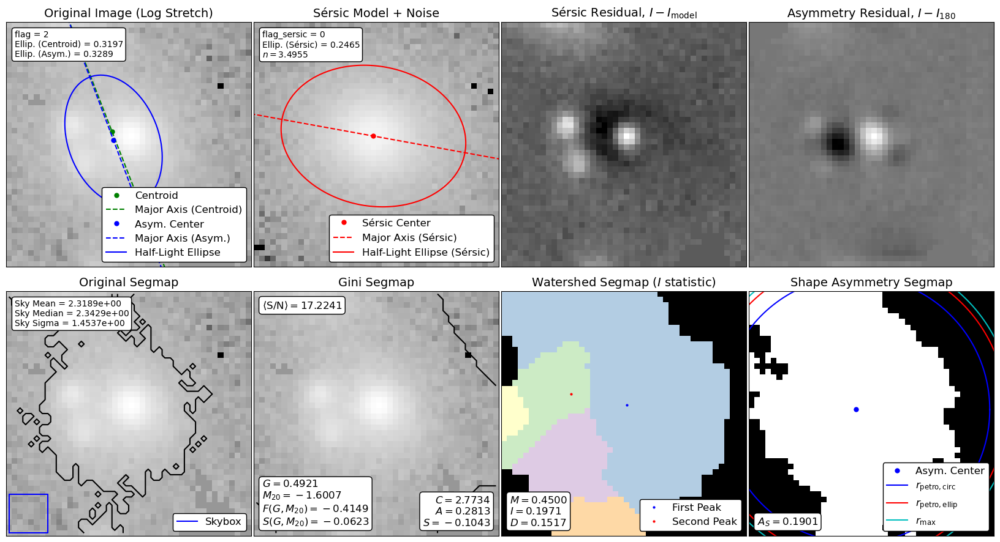

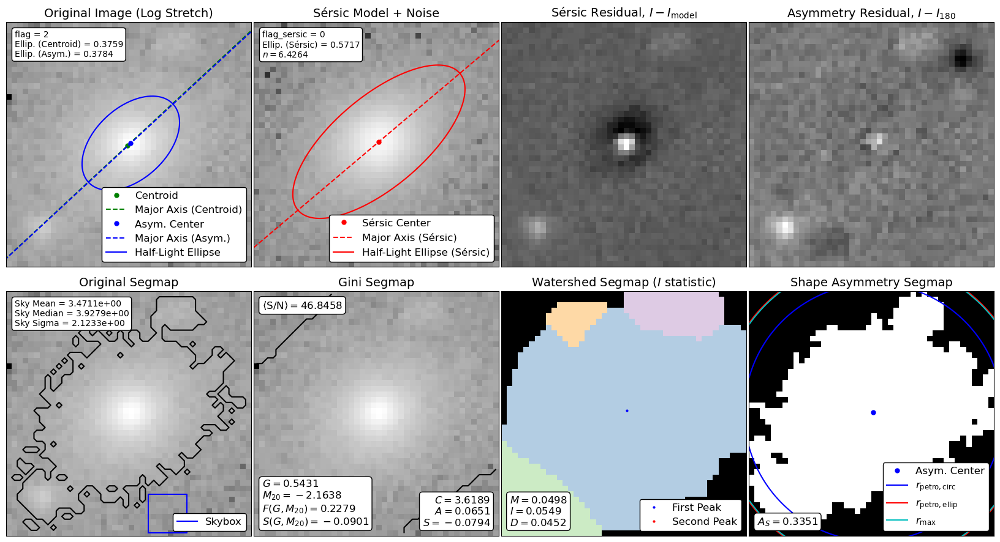

In [103]:
for file in choice(low_amp_file,9,replace=False):
    file_path=path+non_lensed+file
    image, header = fits.getdata(file_path, header=True)
    rms_path=path+RMS+file
    rms,rms_header=fits.getdata(rms_path,header=True)
    psf_path=path+PSF+file
    psf,psf_header=fits.getdata(psf_path,header=True)
    
    threshold=detect_threshold(image,1.5,0.43)
    segm = detect_sources(image, threshold, npixels=5)
    
    Mask=mask(segm)
    segm_map=galaxy_map(segm)
    
    # construction de la rms
    
    weight_map=1/rms
    
    #estimation of the background
    #let's take the median estimator
    try:
        source_morphs = statmorph.source_morphology(image, segm_map, weightmap=weight_map, mask=Mask,psf=psf)
        morph = source_morphs[0]
        fig = make_figure(morph)
    except:
        continue

## Data preprocessing

In [104]:
#preprocessing of data

x=[lrg_working['sersic_amplitude']+lens_working['sersic_amplitude'],lrg_working['sersic_rhalf']+lens_working['sersic_rhalf'],
    lrg_working['sersic_n']+lens_working['sersic_n'],lrg_working['sersic_xc']+lens_working['sersic_xc'],
    lrg_working['sersic_yc']+lens_working['sersic_yc'],lrg_working['sersic_ellip']+lens_working['sersic_ellip'],
    lrg_working['sersic_theta']+lens_working['sersic_theta'],
    [0 for i in range(len(lrg_working['file']))]+[1 for j in range(len(lens_working['file']))]]
X=np.transpose(x)
rng = np.random.default_rng()
rng.shuffle(X)

y=X[:,-1]
X=X[:,:-1]

cut1,cut2=int(0.6*len(X)),int(0.8*len((X)))
X_train,X_valid,X_test=X[:cut1],X[cut1:cut2],X[cut2:]
y_train,y_valid,y_test=y[:cut1],y[cut1:cut2],y[cut2:]

## PCA

In [105]:
pca1 = PCA(n_components=0.99)
PCA1=pca1.fit(X).transform(X)

In [106]:
print(pca1.explained_variance_ratio_)
print(pca1.singular_values_)

[0.94890562 0.03259442 0.01757706]
[1483.36492064  274.92111315  201.88756757]


In [107]:
PCA1

array([[ -3.03731745,  -6.29788515,   3.17581526],
       [ 82.96506963,  -1.53814944,  -5.0219303 ],
       [-12.64665024,  -3.67252225,   1.93374442],
       ...,
       [ -3.86445145,  -4.87778593,  -4.0352603 ],
       [-39.53991146,   5.63097557,  -2.39109332],
       [ -3.82151898,  -3.86451179,  -3.75654899]])

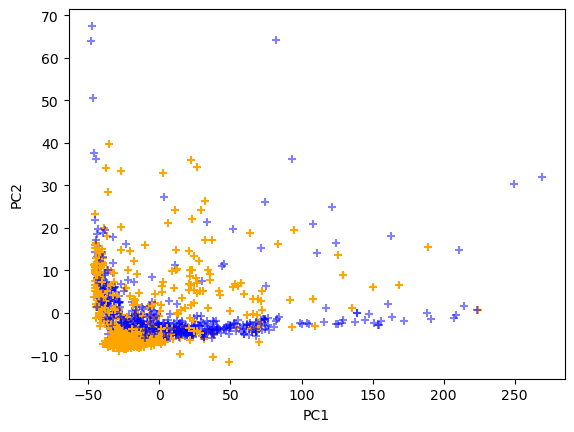

In [108]:
for i in range(len(X)):
    if y[i]==0:
        plt.scatter(PCA1[i,0],PCA1[i,1],marker='+',color='orange')
    else:
        plt.scatter(PCA1[i,0],PCA1[i,1],marker='+',color='blue',alpha=0.5)
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.show()

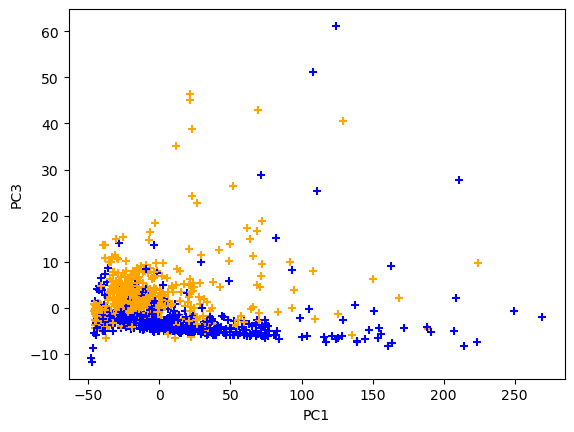

In [109]:
for i in range(len(X)):
    if y[i]==0:
        plt.scatter(PCA1[i,0],PCA1[i,2],marker='+',color='orange')
    else:
        plt.scatter(PCA1[i,0],PCA1[i,2],marker='+',color='blue')
plt.xlabel('PC1')
plt.ylabel('PC3')
plt.show()

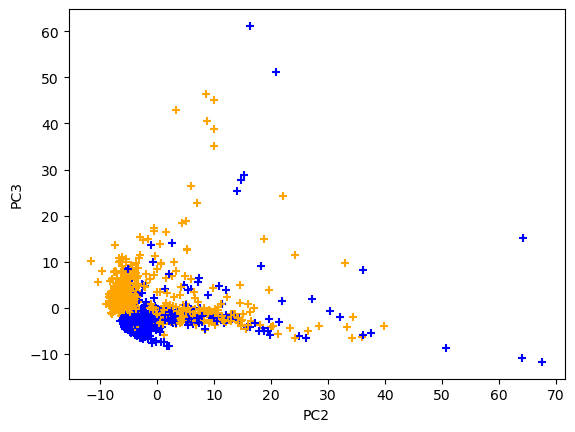

In [110]:
for i in range(len(X)):
    if y[i]==0:
        plt.scatter(PCA1[i,1],PCA1[i,2],marker='+',color='orange')
    else:
        plt.scatter(PCA1[i,1],PCA1[i,2],marker='+',color='blue')
plt.xlabel('PC2')
plt.ylabel('PC3')
plt.show()

## Data preprocessing

In [111]:
#preprocessing of data
x=[lrg_working['sersic_amplitude']+lens_working['sersic_amplitude'],lrg_working['sersic_rhalf']+lens_working['sersic_rhalf'],
    lrg_working['sersic_n']+lens_working['sersic_n'],lrg_working['sersic_xc']+lens_working['sersic_xc'],
    lrg_working['sersic_yc']+lens_working['sersic_yc'],lrg_working['sersic_ellip']+lens_working['sersic_ellip'],
    lrg_working['sersic_theta']+lens_working['sersic_theta'],lrg_working['file']+lens_working['file'],
    [0 for i in range(len(lrg_working['file']))]+[1 for j in range(len(lens_working['file']))]]
X=np.transpose(x)
rng = np.random.default_rng()
rng.shuffle(X)

y=X[:,-1]
y_file=X[:,-2]
X=X[:,:-2]

cut1,cut2=int(0.6*len(X)),int(0.8*len((X)))
X_train,X_valid,X_test=X[:cut1],X[cut1:cut2],X[cut2:]
y_train,y_valid,y_test=y[:cut1],y[cut1:cut2],y[cut2:]
y_file_train,y_file_valid,y_file_test=y_file[:cut1],y_file[cut1:cut2],y_file[cut2:]

## Classification tree

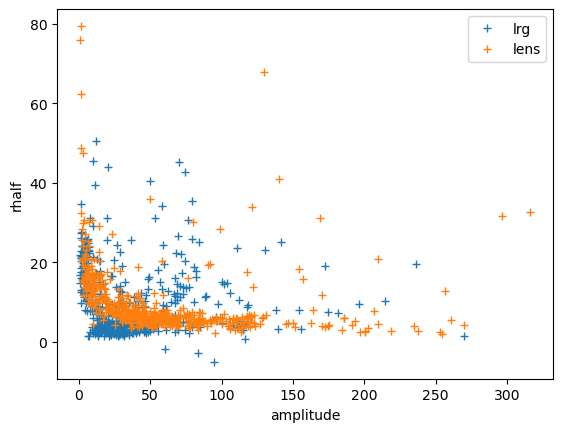

In [112]:
plt.plot(lrg_working['sersic_amplitude'],lrg_working['sersic_rhalf'],'+',label='lrg')
plt.plot(lens_working['sersic_amplitude'],lens_working['sersic_rhalf'],'+',label='lens')
plt.xlabel('amplitude')
plt.ylabel('rhalf')
plt.legend()
plt.show()

In [113]:
clf = tree.DecisionTreeClassifier()
clf = clf.fit(X_train, y_train)

In [114]:
clf.score(X_valid,y_valid)

0.8598130841121495

In [115]:
pred=clf.predict(X_test)

In [116]:
conf_matrix=confusion_matrix(y_test,pred)
print(f'confusion matrix: \n{conf_matrix}\n')
acc=accuracy_score(y_test,pred)
precision,recall,fscore,support=precision_recall_fscore_support(y_test,pred,average='weighted')
print(f'Accuracy: {acc*100} %',f'Precision: {precision*100} %', f'Recall: {recall*100} %',f'F-score: {fscore*100} %',sep='\n')

confusion matrix: 
[[93 16]
 [17 88]]

Accuracy: 84.57943925233646 %
Precision: 84.57976602836416 %
Recall: 84.57943925233646 %
F-score: 84.57775471837962 %








conf matrix = [[TN,FP],
               [FN,TP]]

Accuracy= (TP+TN)/total #Number of correct prediction
Precision= TP/(TP+FP) = TP/positiv #Number of correct positive predictions out of all predicted positive
Recall= TP/(TP+FN) #Number of correct positive prediction out of really positive cases
F-score= 2*(pressicion*recall)/(precision+recall) #Harmonique mean of the precision and the recall

precision=1 ---> classifier don't make errors
recall=1 ---> classifier find all the relevant cases
F-score = 1 the best classifier

In [117]:
FN_args=[]
for i in range(len(pred)):
    if (pred[i]=='0' and y_test[i]=='1'):
        FN_args.append(i)
    else:
        continue
FN_CT=np.array(y_file_test)[FN_args]

FP_args=[]
for i in range(len(pred)):
    if (pred[i]=='1' and y_test[i]=='0'):
        FP_args.append(i)
    else:
        continue
FP_CT=np.array(y_file_test)[FP_args]

## SVM

In [118]:
clf = make_pipeline(StandardScaler(), SVC(gamma='auto'))
clf=clf.fit(X_train, y_train)

In [119]:
clf.score(X_valid,y_valid)

0.8644859813084113

In [120]:
pred=clf.predict(X_test)

In [121]:
conf_matrix=confusion_matrix(y_test,pred)
print(f'confusion matrix: \n{conf_matrix}\n')
acc=accuracy_score(y_test,pred)
precision,recall,fscore,support=precision_recall_fscore_support(y_test,pred,average='weighted')
print(f'Accuracy: {acc*100} %',f'Precision: {precision*100} %', f'Recall: {recall*100} %',f'F-score: {fscore*100} %',sep='\n')

confusion matrix: 
[[101   8]
 [ 18  87]]

Accuracy: 87.85046728971963 %
Precision: 88.16378494339202 %
Recall: 87.85046728971963 %
F-score: 87.8131660928021 %


In [122]:
FN_args=[]
for i in range(len(pred)):
    if (pred[i]=='0' and y_test[i]=='1'):
        FN_args.append(i)
    else:
        continue
FN_SVM=np.array(y_file_test)[FN_args]

FP_args=[]
for i in range(len(pred)):
    if (pred[i]=='1' and y_test[i]=='0'):
        FP_args.append(i)
    else:
        continue
FP_SVM=np.array(y_file_test)[FP_args]

### How many FN and FP are in common between CT and SVM

In [123]:
common_FN=np.intersect1d(FN_CT,FN_SVM)
print(len(common_FN)/(len(FN_CT)+len(FN_SVM))*100,'% of common FN')

common_FP=np.intersect1d(FP_CT,FP_SVM)
print(len(common_FP)/(len(FN_CT)+len(FN_SVM))*100,'% of common FP')

22.857142857142858 % of common FN
17.142857142857142 % of common FP


### who are the false positives

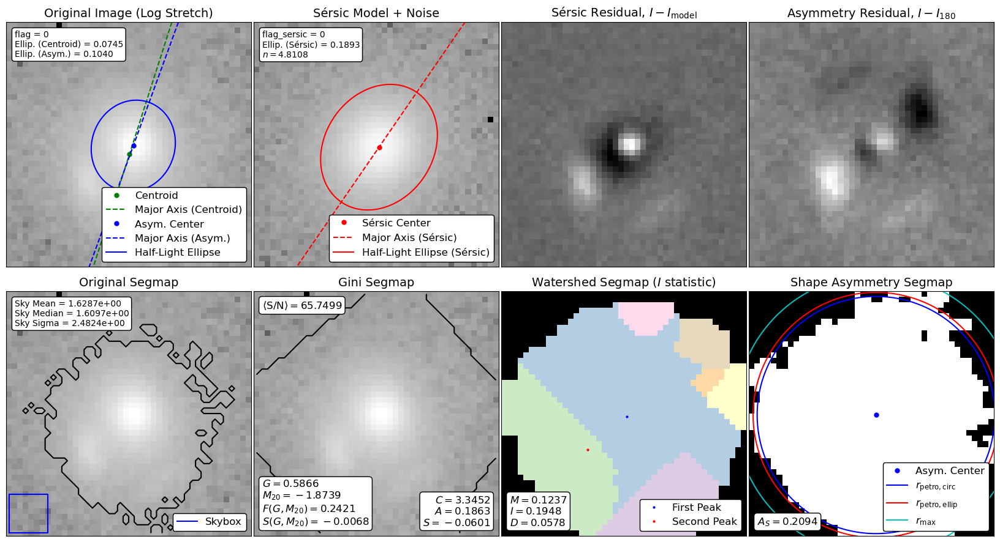

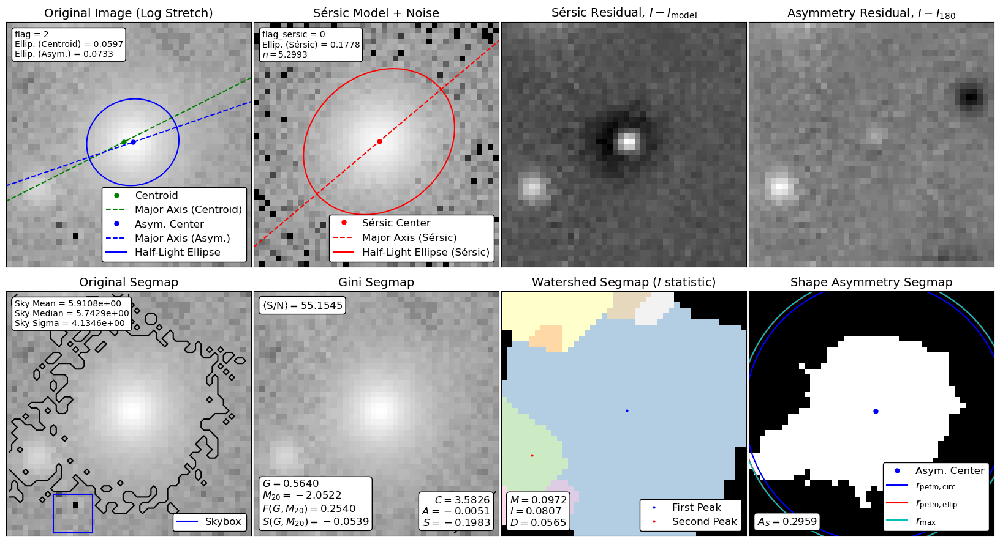

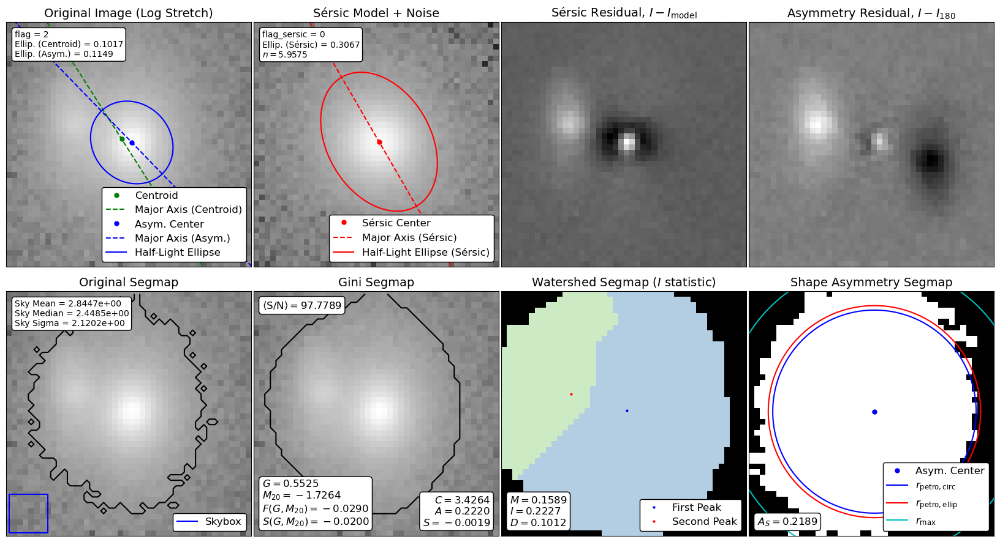

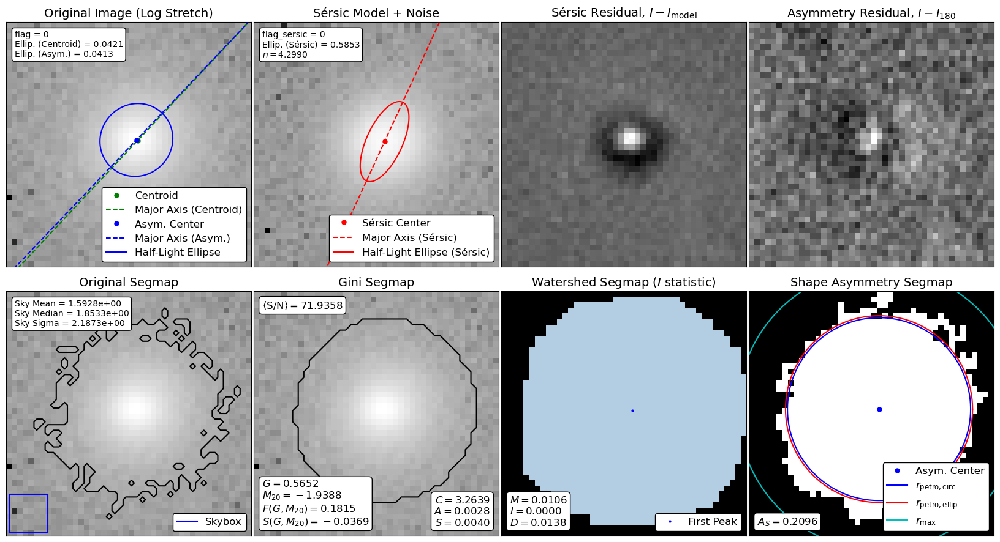

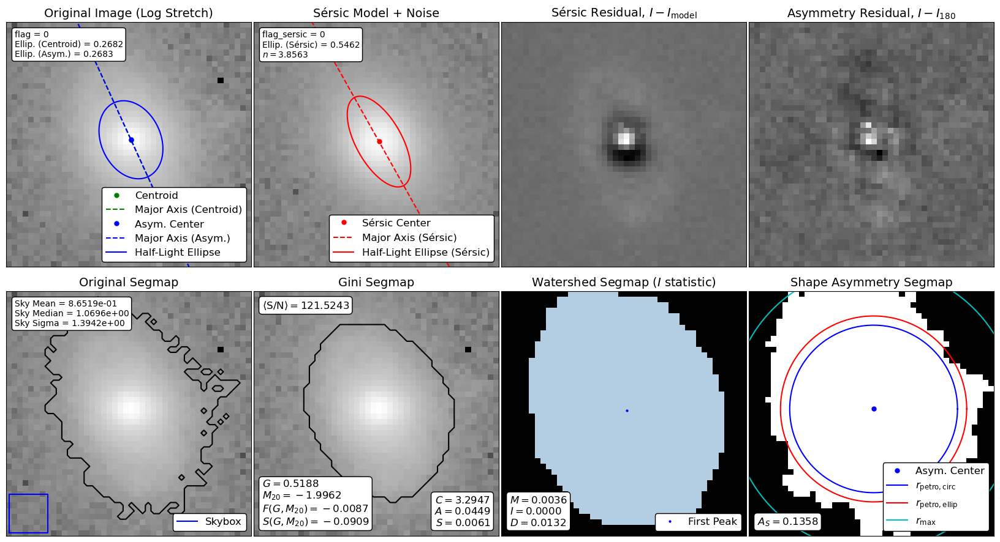

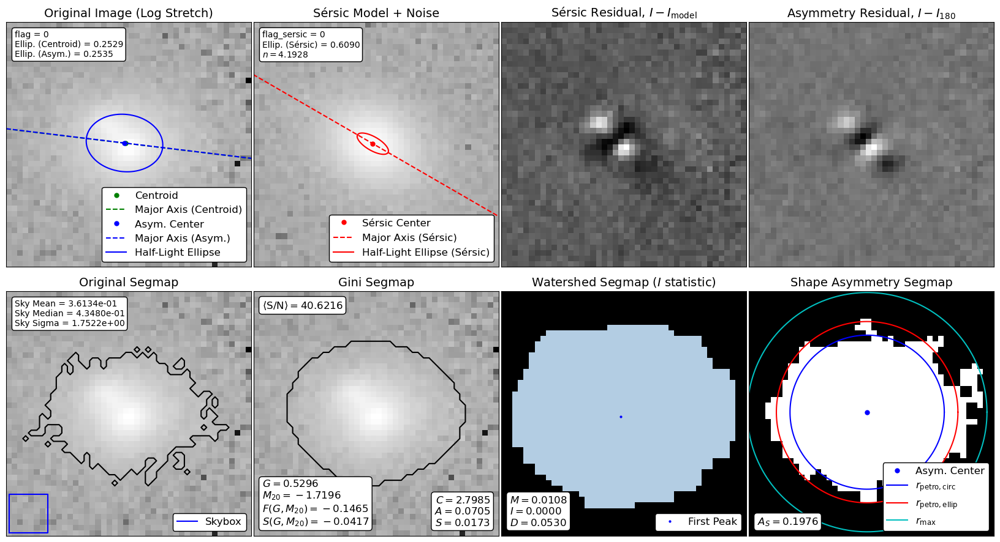

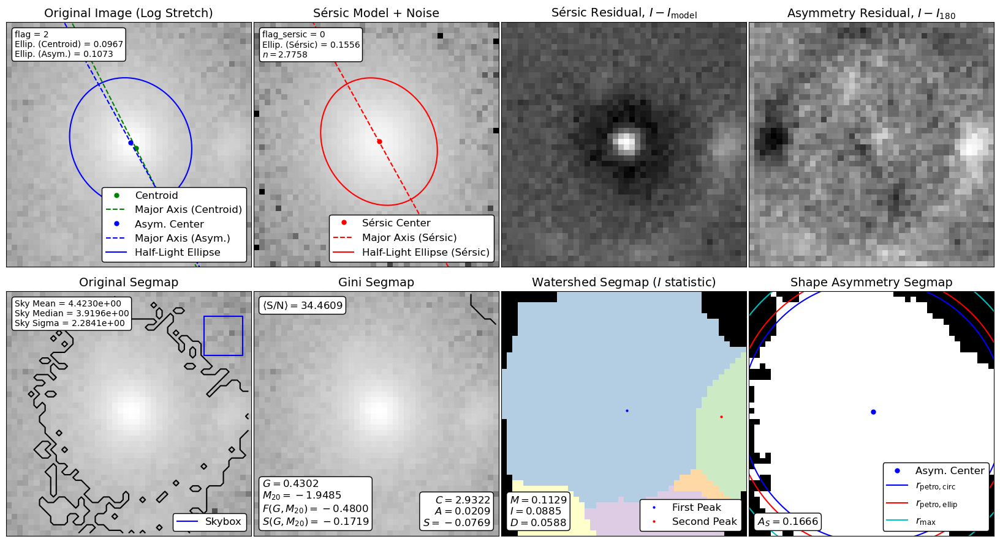

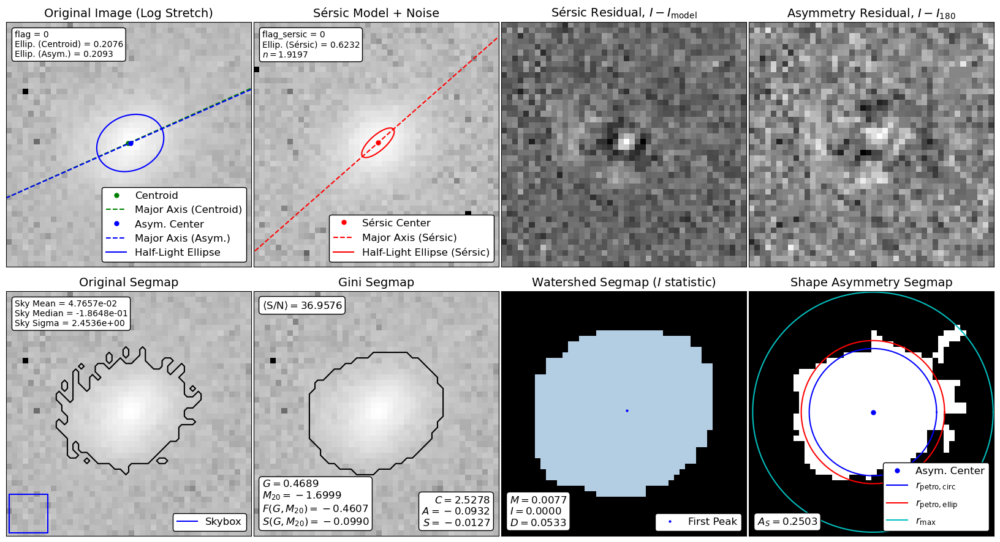

In [124]:
FP_args=[]
for i in range(len(pred)):
    if (pred[i]=='1' and y_test[i]=='0'):
        FP_args.append(i)
    else:
        continue
FP=np.array(y_file_test)[FP_args]

for file in FP:
    file_path=path+non_lensed+file
    image, header = fits.getdata(file_path, header=True)
    rms_path=path+RMS+file
    rms,rms_header=fits.getdata(rms_path,header=True)
    psf_path=path+PSF+file
    psf,psf_header=fits.getdata(psf_path,header=True)
    
    threshold=detect_threshold(image,1.5,0.43)
    segm = detect_sources(image, threshold, npixels=5)
    
    Mask=mask(segm)
    segm_map=galaxy_map(segm)
    
    # construction de la rms
    
    weight_map=1/rms
    
    #estimation of the background
    #let's take the median estimator
    try:
        source_morphs = statmorph.source_morphology(image, segm_map, weightmap=weight_map, mask=Mask,psf=psf)
        morph = source_morphs[0]
        fig = make_figure(morph)
    except:
        continue

# Study on the systematic choices influence

## detect threshold without finetuning parameter

In [125]:
###First non_lensed data

n_sigma=np.arange(1, 3, 0.5)
working,sersic,flag,defaulting=[],[],[],[]
scores, accuracies, precisions, recalls, f_scores=[],[],[],[],[]

for n in n_sigma:


    lrg_sersic_flag={'file':[],'warning':[],'sersic_amplitude':[],'sersic_rhalf':[],'sersic_n':[],'sersic_xc':[],'sersic_yc':[],
                 'sersic_ellip':[],'sersic_theta':[],'asymetry':[],'concentration':[],'deviation':[],'gini':[],'intensity':[],
                 'm20':[],'rpetro_circ':[],'smoothness':[]}
    lrg_flag={'file':[],'warning':[],'sersic_amplitude':[],'sersic_rhalf':[],'sersic_n':[],'sersic_xc':[],'sersic_yc':[],
          'sersic_ellip':[],'sersic_theta':[],'asymetry':[],'concentration':[],'deviation':[],'gini':[],'intensity':[],
          'm20':[],'rpetro_circ':[],'smoothness':[]}
    lrg_defaulting={'file':[],'warning':[]}
    lrg_working={'file':[],'sersic_amplitude':[],'sersic_rhalf':[],'sersic_n':[],'sersic_xc':[],'sersic_yc':[],
             'sersic_ellip':[],'sersic_theta':[],'asymetry':[],'concentration':[],'deviation':[],'gini':[],'intensity':[],
             'm20':[],'rpetro_circ':[],'smoothness':[]}
    
    
    lens_sersic_flag={'file':[],'warning':[],'sersic_amplitude':[],'sersic_rhalf':[],'sersic_n':[],'sersic_xc':[],'sersic_yc':[],
                  'sersic_ellip':[],'sersic_theta':[],'asymetry':[],'concentration':[],'deviation':[],'gini':[],'intensity':[],
                  'm20':[],'rpetro_circ':[],'smoothness':[]}
    lens_flag={'file':[],'warning':[],'sersic_amplitude':[],'sersic_rhalf':[],'sersic_n':[],'sersic_xc':[],'sersic_yc':[],
           'sersic_ellip':[],'sersic_theta':[],'asymetry':[],'concentration':[],'deviation':[],'gini':[],'intensity':[],
           'm20':[],'rpetro_circ':[],'smoothness':[]}
    lens_defaulting={'file':[],'warning':[]}
    lens_working={'file':[],'sersic_amplitude':[],'sersic_rhalf':[],'sersic_n':[],'sersic_xc':[],'sersic_yc':[],
              'sersic_ellip':[],'sersic_theta':[],'asymetry':[],'concentration':[],'deviation':[],'gini':[],'intensity':[],
              'm20':[],'rpetro_circ':[],'smoothness':[]}

    for file in choice(data,1000,replace=False):
        file_path=path+non_lensed+file
        image, header = fits.getdata(file_path, header=True)
        rms_path=path+RMS+file
        rms,rms_header=fits.getdata(rms_path,header=True)
        psf_path=path+PSF+file
        psf,psf_header=fits.getdata(psf_path,header=True)
    
        threshold=detect_threshold(image,n)
        segm = detect_sources(image, threshold, npixels=5)
    
        Mask=mask(segm)
        segm_map=galaxy_map(segm)
    
    # construction de la rms
    
        weight_map=1/rms
    
    #estimation of the background
    #let's take the median estimator
        try:
            source_morphs = statmorph.source_morphology(image, segm_map, weightmap=weight_map, mask=Mask,psf=psf)
            morph = source_morphs[0]
            if morph.flag_sersic==1:
                with warnings.catch_warnings(record=True) as w:
                    warnings.simplefilter("always")
                    lrg_sersic_flag['file'].append(file)
                    lrg_sersic_flag['warning'].append(w)
                    lrg_sersic_flag['sersic_amplitude'].append(morph.sersic_amplitude)
                    lrg_sersic_flag['sersic_rhalf'].append(morph.sersic_rhalf)
                    lrg_sersic_flag['sersic_n'].append(morph.sersic_n)
                    lrg_sersic_flag['sersic_xc'].append(morph.sersic_xc)
                    lrg_sersic_flag['sersic_yc'].append(morph.sersic_yc)
                    lrg_sersic_flag['sersic_ellip'].append(morph.sersic_ellip)
                    lrg_sersic_flag['sersic_theta'].append(morph.sersic_theta)
                    lrg_sersic_flag['asymetry'].append(morph.asymmetry)
                    lrg_sersic_flag['concentration'].append(morph.concentration)
                    lrg_sersic_flag['deviation'].append(morph.deviation)
                    lrg_sersic_flag['gini'].append(morph.gini)
                    lrg_sersic_flag['intensity'].append(morph.intensity)
                    lrg_sersic_flag['m20'].append(morph.m20)
                    lrg_sersic_flag['rpetro_circ'].append(morph.rpetro_circ)
                    lrg_sersic_flag['smoothness'].append(morph.smoothness)
            elif morph.flag==1:
                with warnings.catch_warnings(record=True) as w:
                    warnings.simplefilter("always")
                    lrg_flag['file'].append(file)
                    lrg_flag['warning'].append(w)
                    lrg_flag['sersic_amplitude'].append(morph.sersic_amplitude)
                    lrg_flag['sersic_rhalf'].append(morph.sersic_rhalf)
                    lrg_flag['sersic_n'].append(morph.sersic_n)
                    lrg_flag['sersic_xc'].append(morph.sersic_xc)
                    lrg_flag['sersic_yc'].append(morph.sersic_yc)
                    lrg_flag['sersic_ellip'].append(morph.sersic_ellip)
                    lrg_flag['sersic_theta'].append(morph.sersic_theta)
                    lrg_flag['asymetry'].append(morph.asymmetry)
                    lrg_flag['concentration'].append(morph.concentration)
                    lrg_flag['deviation'].append(morph.deviation)
                    lrg_flag['gini'].append(morph.gini)
                    lrg_flag['intensity'].append(morph.intensity)
                    lrg_flag['m20'].append(morph.m20)
                    lrg_flag['rpetro_circ'].append(morph.rpetro_circ)
                    lrg_flag['smoothness'].append(morph.smoothness)
            else:
                lrg_working['file'].append(file)
                lrg_working['sersic_amplitude'].append(morph.sersic_amplitude)
                lrg_working['sersic_rhalf'].append(morph.sersic_rhalf)
                lrg_working['sersic_n'].append(morph.sersic_n)
                lrg_working['sersic_xc'].append(morph.sersic_xc)
                lrg_working['sersic_yc'].append(morph.sersic_yc)
                lrg_working['sersic_ellip'].append(morph.sersic_ellip)
                lrg_working['sersic_theta'].append(morph.sersic_theta)
                lrg_working['asymetry'].append(morph.asymmetry)
                lrg_working['concentration'].append(morph.concentration)
                lrg_working['deviation'].append(morph.deviation)
                lrg_working['gini'].append(morph.gini)
                lrg_working['intensity'].append(morph.intensity)
                lrg_working['m20'].append(morph.m20)
                lrg_working['rpetro_circ'].append(morph.rpetro_circ)
                lrg_working['smoothness'].append(morph.smoothness)
        except:
            with warnings.catch_warnings(record=True) as w:
                warnings.simplefilter("always")
                lrg_defaulting['file'].append(file)
                lrg_defaulting['warning'].append(w)

    
    for file in choice(data,1000,replace=False):
        file_path=path+lensed+file
        image, header = fits.getdata(file_path, header=True)
    
        threshold=detect_threshold(image,n)
        segm = detect_sources(image, threshold, npixels=5)
    
        Mask=mask(segm)
        segm_map=galaxy_map(segm)
    
    # construction de la rms
        source_path=path+lensed_source+file
        rms_path=path+RMS+file
        lrg_path=path+non_lensed+file
        psf_path=path+PSF+file
    
        source,source_header=fits.getdata(source_path, header=True)
        rms,rms_header=fits.getdata(rms_path,header=True)
        lrg,lrg_header=fits.getdata(lrg_path,header=True)
        psf,psf_header=fits.getdata(psf_path,header=True)
    
        gain=lrg_header['GAIN']
        source_rms=source/gain
    
        total_rms=rms+source_rms
    
        weight_map=1/total_rms
    
    #estimation of the background
    #let's take the median estimator
        try:
            source_morphs = statmorph.source_morphology(image, segm_map, weightmap=weight_map, mask=Mask,psf=psf)
            morph = source_morphs[0]
            if morph.flag_sersic==1:
                with warnings.catch_warnings(record=True) as w:
                    warnings.simplefilter("always")
                    lens_sersic_flag['file'].append(file)
                    lens_sersic_flag['warning'].append(w)
                    lens_sersic_flag['sersic_amplitude'].append(morph.sersic_amplitude)
                    lens_sersic_flag['sersic_rhalf'].append(morph.sersic_rhalf)
                    lens_sersic_flag['sersic_n'].append(morph.sersic_n)
                    lens_sersic_flag['sersic_xc'].append(morph.sersic_xc)
                    lens_sersic_flag['sersic_yc'].append(morph.sersic_yc)
                    lens_sersic_flag['sersic_ellip'].append(morph.sersic_ellip)
                    lens_sersic_flag['sersic_theta'].append(morph.sersic_theta)
                    lens_sersic_flag['asymetry'].append(morph.asymmetry)
                    lens_sersic_flag['concentration'].append(morph.concentration)
                    lens_sersic_flag['deviation'].append(morph.deviation)
                    lens_sersic_flag['gini'].append(morph.gini)
                    lens_sersic_flag['intensity'].append(morph.intensity)
                    lens_sersic_flag['m20'].append(morph.m20)
                    lens_sersic_flag['rpetro_circ'].append(morph.rpetro_circ)
                    lens_sersic_flag['smoothness'].append(morph.smoothness)
            elif morph.flag==1:
                with warnings.catch_warnings(record=True) as w:
                    warnings.simplefilter("always")
                    lens_flag['file'].append(file)
                    lens_flag['warning'].append(w)
                    lens_flag['sersic_amplitude'].append(morph.sersic_amplitude)
                    lens_flag['sersic_rhalf'].append(morph.sersic_rhalf)
                    lens_flag['sersic_n'].append(morph.sersic_n)
                    lens_flag['sersic_xc'].append(morph.sersic_xc)
                    lens_flag['sersic_yc'].append(morph.sersic_yc)
                    lens_flag['sersic_ellip'].append(morph.sersic_ellip)
                    lens_flag['sersic_theta'].append(morph.sersic_theta)
                    lens_flag['asymetry'].append(morph.asymmetry)
                    lens_flag['concentration'].append(morph.concentration)
                    lens_flag['deviation'].append(morph.deviation)
                    lens_flag['gini'].append(morph.gini)
                    lens_flag['intensity'].append(morph.intensity)
                    lens_flag['m20'].append(morph.m20)
                    lens_flag['rpetro_circ'].append(morph.rpetro_circ)
                    lens_flag['smoothness'].append(morph.smoothness)
            else:
                lens_working['file'].append(file)
                lens_working['sersic_amplitude'].append(morph.sersic_amplitude)
                lens_working['sersic_rhalf'].append(morph.sersic_rhalf)
                lens_working['sersic_n'].append(morph.sersic_n)
                lens_working['sersic_xc'].append(morph.sersic_xc)
                lens_working['sersic_yc'].append(morph.sersic_yc)
                lens_working['sersic_ellip'].append(morph.sersic_ellip)
                lens_working['sersic_theta'].append(morph.sersic_theta)
                lens_working['asymetry'].append(morph.asymmetry)
                lens_working['concentration'].append(morph.concentration)
                lens_working['deviation'].append(morph.deviation)
                lens_working['gini'].append(morph.gini)
                lens_working['intensity'].append(morph.intensity)
                lens_working['m20'].append(morph.m20)
                lens_working['rpetro_circ'].append(morph.rpetro_circ)
                lens_working['smoothness'].append(morph.smoothness)
        except:
            with warnings.catch_warnings(record=True) as w:
                warnings.simplefilter("always")
                lens_defaulting['file'].append(file)
                lens_defaulting['warning'].append(w)

    working.append((len(lrg_working['file'])+len(lens_working['file']))/2000)
    sersic.append((len(lrg_sersic_flag['file'])+len(lens_sersic_flag['file']))/2000)
    flag.append((len(lrg_flag['file'])+len(lens_flag['file']))/2000)
    defaulting.append((len(lrg_defaulting['file'])+len(lens_defaulting['file']))/2000)
    
    #preprocessing of data
    x=[lrg_working['sersic_amplitude']+lens_working['sersic_amplitude'],lrg_working['sersic_rhalf']+lens_working['sersic_rhalf'],
       lrg_working['sersic_n']+lens_working['sersic_n'],lrg_working['sersic_xc']+lens_working['sersic_xc'],
       lrg_working['sersic_yc']+lens_working['sersic_yc'],lrg_working['sersic_ellip']+lens_working['sersic_ellip'],
       lrg_working['sersic_theta']+lens_working['sersic_theta'],lrg_working['file']+lens_working['file'],
       [0 for i in range(len(lrg_working['file']))]+[1 for j in range(len(lens_working['file']))]]
    X=np.transpose(x)
    rng = np.random.default_rng()
    rng.shuffle(X)

    y=X[:,-1]
    y_file=X[:,-2]
    X=X[:,:-2]

    cut1,cut2=int(0.6*len(X)),int(0.8*len((X)))
    X_train,X_valid,X_test=X[:cut1],X[cut1:cut2],X[cut2:]
    y_train,y_valid,y_test=y[:cut1],y[cut1:cut2],y[cut2:]
    y_file_train,y_file_valid,y_file_test=y_file[:cut1],y_file[cut1:cut2],y_file[cut2:]
        
    clf = make_pipeline(StandardScaler(), SVC(gamma='auto'))
    clf=clf.fit(X_train, y_train)
    
    scores.append(clf.score(X_valid,y_valid))
    
    pred=clf.predict(X_test)
    
    precision,recall,fscore,support=precision_recall_fscore_support(y_test,pred,average='weighted')
    
    accuracies.append(accuracy_score(y_test,pred))
    precisions.append(precision)
    recalls.append(recall)
    f_scores.append(fscore)

/home/clement/anaconda3/envs/memoire/lib/python3.11/site-packages/astropy/modeling/functional_models.py:3109: RuntimeWarning: overflow encountered in power
  return amplitude * np.exp(-bn * (z ** (1 / n) - 1))
/home/clement/anaconda3/envs/memoire/lib/python3.11/site-packages/astropy/modeling/functional_models.py:3109: RuntimeWarning: invalid value encountered in multiply
  return amplitude * np.exp(-bn * (z ** (1 / n) - 1))
/home/clement/anaconda3/envs/memoire/lib/python3.11/site-packages/astropy/modeling/functional_models.py:3109: RuntimeWarning: overflow encountered in power
  return amplitude * np.exp(-bn * (z ** (1 / n) - 1))
/home/clement/anaconda3/envs/memoire/lib/python3.11/site-packages/astropy/modeling/functional_models.py:3109: RuntimeWarning: overflow encountered in power
  return amplitude * np.exp(-bn * (z ** (1 / n) - 1))
/home/clement/anaconda3/envs/memoire/lib/python3.11/site-packages/astropy/modeling/functional_models.py:3109: RuntimeWarning: overflow encountered in po

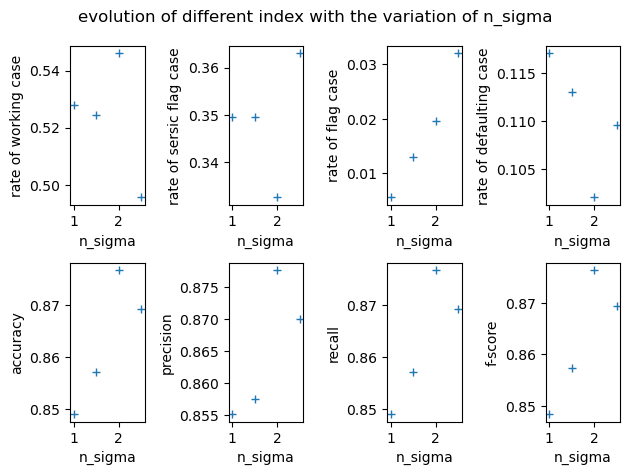

In [126]:
plt.suptitle('evolution of different index with the variation of n_sigma')
plt.subplot(241)
plt.plot(n_sigma,working,'+')
plt.xlabel('n_sigma')
plt.ylabel('rate of working case')

plt.subplot(242)
plt.plot(n_sigma,sersic,'+')
plt.xlabel('n_sigma')
plt.ylabel('rate of sersic flag case')

plt.subplot(243)
plt.plot(n_sigma,flag,'+')
plt.xlabel('n_sigma')
plt.ylabel('rate of flag case')

plt.subplot(244)
plt.plot(n_sigma,defaulting,'+')
plt.xlabel('n_sigma')
plt.ylabel('rate of defaulting case')

plt.subplot(245)
plt.plot(n_sigma,accuracies,'+')
plt.xlabel('n_sigma')
plt.ylabel('accuracy')

plt.subplot(246)
plt.plot(n_sigma,precisions,'+')
plt.xlabel('n_sigma')
plt.ylabel('precision')

plt.subplot(247)
plt.plot(n_sigma,recalls,'+')
plt.xlabel('n_sigma')
plt.ylabel('recall')

plt.subplot(248)
plt.plot(n_sigma,f_scores,'+')
plt.xlabel('n_sigma')
plt.ylabel('f-score')

plt.tight_layout()
plt.show()

## Detect threshold with global background mean (determined with the peak of mean background distribution across all images)

In [128]:
###First non_lensed data

n_sigma=np.arange(1, 3, 0.5)
working,sersic,flag,defaulting=[],[],[],[]
scores, accuracies, precisions, recalls, f_scores=[],[],[],[],[]

for n in n_sigma:


    lrg_sersic_flag={'file':[],'warning':[],'sersic_amplitude':[],'sersic_rhalf':[],'sersic_n':[],'sersic_xc':[],'sersic_yc':[],
                 'sersic_ellip':[],'sersic_theta':[],'asymetry':[],'concentration':[],'deviation':[],'gini':[],'intensity':[],
                 'm20':[],'rpetro_circ':[],'smoothness':[]}
    lrg_flag={'file':[],'warning':[],'sersic_amplitude':[],'sersic_rhalf':[],'sersic_n':[],'sersic_xc':[],'sersic_yc':[],
          'sersic_ellip':[],'sersic_theta':[],'asymetry':[],'concentration':[],'deviation':[],'gini':[],'intensity':[],
          'm20':[],'rpetro_circ':[],'smoothness':[]}
    lrg_defaulting={'file':[],'warning':[]}
    lrg_working={'file':[],'sersic_amplitude':[],'sersic_rhalf':[],'sersic_n':[],'sersic_xc':[],'sersic_yc':[],
             'sersic_ellip':[],'sersic_theta':[],'asymetry':[],'concentration':[],'deviation':[],'gini':[],'intensity':[],
             'm20':[],'rpetro_circ':[],'smoothness':[]}
    
    
    lens_sersic_flag={'file':[],'warning':[],'sersic_amplitude':[],'sersic_rhalf':[],'sersic_n':[],'sersic_xc':[],'sersic_yc':[],
                  'sersic_ellip':[],'sersic_theta':[],'asymetry':[],'concentration':[],'deviation':[],'gini':[],'intensity':[],
                  'm20':[],'rpetro_circ':[],'smoothness':[]}
    lens_flag={'file':[],'warning':[],'sersic_amplitude':[],'sersic_rhalf':[],'sersic_n':[],'sersic_xc':[],'sersic_yc':[],
           'sersic_ellip':[],'sersic_theta':[],'asymetry':[],'concentration':[],'deviation':[],'gini':[],'intensity':[],
           'm20':[],'rpetro_circ':[],'smoothness':[]}
    lens_defaulting={'file':[],'warning':[]}
    lens_working={'file':[],'sersic_amplitude':[],'sersic_rhalf':[],'sersic_n':[],'sersic_xc':[],'sersic_yc':[],
              'sersic_ellip':[],'sersic_theta':[],'asymetry':[],'concentration':[],'deviation':[],'gini':[],'intensity':[],
              'm20':[],'rpetro_circ':[],'smoothness':[]}

    for file in choice(data,1000,replace=False):
        file_path=path+non_lensed+file
        image, header = fits.getdata(file_path, header=True)
        rms_path=path+RMS+file
        rms,rms_header=fits.getdata(rms_path,header=True)
        psf_path=path+PSF+file
        psf,psf_header=fits.getdata(psf_path,header=True)
    
        threshold=detect_threshold(image,n,background=0.43)
        segm = detect_sources(image, threshold, npixels=5)
    
        Mask=mask(segm)
        segm_map=galaxy_map(segm)
    
    # construction de la rms
    
        weight_map=1/rms
    
    #estimation of the background
    #let's take the median estimator
        try:
            source_morphs = statmorph.source_morphology(image, segm_map, weightmap=weight_map, mask=Mask,psf=psf)
            morph = source_morphs[0]
            if morph.flag_sersic==1:
                with warnings.catch_warnings(record=True) as w:
                    warnings.simplefilter("always")
                    lrg_sersic_flag['file'].append(file)
                    lrg_sersic_flag['warning'].append(w)
                    lrg_sersic_flag['sersic_amplitude'].append(morph.sersic_amplitude)
                    lrg_sersic_flag['sersic_rhalf'].append(morph.sersic_rhalf)
                    lrg_sersic_flag['sersic_n'].append(morph.sersic_n)
                    lrg_sersic_flag['sersic_xc'].append(morph.sersic_xc)
                    lrg_sersic_flag['sersic_yc'].append(morph.sersic_yc)
                    lrg_sersic_flag['sersic_ellip'].append(morph.sersic_ellip)
                    lrg_sersic_flag['sersic_theta'].append(morph.sersic_theta)
                    lrg_sersic_flag['asymetry'].append(morph.asymmetry)
                    lrg_sersic_flag['concentration'].append(morph.concentration)
                    lrg_sersic_flag['deviation'].append(morph.deviation)
                    lrg_sersic_flag['gini'].append(morph.gini)
                    lrg_sersic_flag['intensity'].append(morph.intensity)
                    lrg_sersic_flag['m20'].append(morph.m20)
                    lrg_sersic_flag['rpetro_circ'].append(morph.rpetro_circ)
                    lrg_sersic_flag['smoothness'].append(morph.smoothness)
            elif morph.flag==1:
                with warnings.catch_warnings(record=True) as w:
                    warnings.simplefilter("always")
                    lrg_flag['file'].append(file)
                    lrg_flag['warning'].append(w)
                    lrg_flag['sersic_amplitude'].append(morph.sersic_amplitude)
                    lrg_flag['sersic_rhalf'].append(morph.sersic_rhalf)
                    lrg_flag['sersic_n'].append(morph.sersic_n)
                    lrg_flag['sersic_xc'].append(morph.sersic_xc)
                    lrg_flag['sersic_yc'].append(morph.sersic_yc)
                    lrg_flag['sersic_ellip'].append(morph.sersic_ellip)
                    lrg_flag['sersic_theta'].append(morph.sersic_theta)
                    lrg_flag['asymetry'].append(morph.asymmetry)
                    lrg_flag['concentration'].append(morph.concentration)
                    lrg_flag['deviation'].append(morph.deviation)
                    lrg_flag['gini'].append(morph.gini)
                    lrg_flag['intensity'].append(morph.intensity)
                    lrg_flag['m20'].append(morph.m20)
                    lrg_flag['rpetro_circ'].append(morph.rpetro_circ)
                    lrg_flag['smoothness'].append(morph.smoothness)
            else:
                lrg_working['file'].append(file)
                lrg_working['sersic_amplitude'].append(morph.sersic_amplitude)
                lrg_working['sersic_rhalf'].append(morph.sersic_rhalf)
                lrg_working['sersic_n'].append(morph.sersic_n)
                lrg_working['sersic_xc'].append(morph.sersic_xc)
                lrg_working['sersic_yc'].append(morph.sersic_yc)
                lrg_working['sersic_ellip'].append(morph.sersic_ellip)
                lrg_working['sersic_theta'].append(morph.sersic_theta)
                lrg_working['asymetry'].append(morph.asymmetry)
                lrg_working['concentration'].append(morph.concentration)
                lrg_working['deviation'].append(morph.deviation)
                lrg_working['gini'].append(morph.gini)
                lrg_working['intensity'].append(morph.intensity)
                lrg_working['m20'].append(morph.m20)
                lrg_working['rpetro_circ'].append(morph.rpetro_circ)
                lrg_working['smoothness'].append(morph.smoothness)
        except:
            with warnings.catch_warnings(record=True) as w:
                warnings.simplefilter("always")
                lrg_defaulting['file'].append(file)
                lrg_defaulting['warning'].append(w)

    
    for file in choice(data,1000,replace=False):
        file_path=path+lensed+file
        image, header = fits.getdata(file_path, header=True)
    
        threshold=detect_threshold(image,n,background=0.43)
        segm = detect_sources(image, threshold, npixels=5)
    
        Mask=mask(segm)
        segm_map=galaxy_map(segm)
    
    # construction de la rms
        source_path=path+lensed_source+file
        rms_path=path+RMS+file
        lrg_path=path+non_lensed+file
        psf_path=path+PSF+file
    
        source,source_header=fits.getdata(source_path, header=True)
        rms,rms_header=fits.getdata(rms_path,header=True)
        lrg,lrg_header=fits.getdata(lrg_path,header=True)
        psf,psf_header=fits.getdata(psf_path,header=True)
    
        gain=lrg_header['GAIN']
        source_rms=source/gain
    
        total_rms=rms+source_rms
    
        weight_map=1/total_rms
    
    #estimation of the background
    #let's take the median estimator
        try:
            source_morphs = statmorph.source_morphology(image, segm_map, weightmap=weight_map, mask=Mask,psf=psf)
            morph = source_morphs[0]
            if morph.flag_sersic==1:
                with warnings.catch_warnings(record=True) as w:
                    warnings.simplefilter("always")
                    lens_sersic_flag['file'].append(file)
                    lens_sersic_flag['warning'].append(w)
                    lens_sersic_flag['sersic_amplitude'].append(morph.sersic_amplitude)
                    lens_sersic_flag['sersic_rhalf'].append(morph.sersic_rhalf)
                    lens_sersic_flag['sersic_n'].append(morph.sersic_n)
                    lens_sersic_flag['sersic_xc'].append(morph.sersic_xc)
                    lens_sersic_flag['sersic_yc'].append(morph.sersic_yc)
                    lens_sersic_flag['sersic_ellip'].append(morph.sersic_ellip)
                    lens_sersic_flag['sersic_theta'].append(morph.sersic_theta)
                    lens_sersic_flag['asymetry'].append(morph.asymmetry)
                    lens_sersic_flag['concentration'].append(morph.concentration)
                    lens_sersic_flag['deviation'].append(morph.deviation)
                    lens_sersic_flag['gini'].append(morph.gini)
                    lens_sersic_flag['intensity'].append(morph.intensity)
                    lens_sersic_flag['m20'].append(morph.m20)
                    lens_sersic_flag['rpetro_circ'].append(morph.rpetro_circ)
                    lens_sersic_flag['smoothness'].append(morph.smoothness)
            elif morph.flag==1:
                with warnings.catch_warnings(record=True) as w:
                    warnings.simplefilter("always")
                    lens_flag['file'].append(file)
                    lens_flag['warning'].append(w)
                    lens_flag['sersic_amplitude'].append(morph.sersic_amplitude)
                    lens_flag['sersic_rhalf'].append(morph.sersic_rhalf)
                    lens_flag['sersic_n'].append(morph.sersic_n)
                    lens_flag['sersic_xc'].append(morph.sersic_xc)
                    lens_flag['sersic_yc'].append(morph.sersic_yc)
                    lens_flag['sersic_ellip'].append(morph.sersic_ellip)
                    lens_flag['sersic_theta'].append(morph.sersic_theta)
                    lens_flag['asymetry'].append(morph.asymmetry)
                    lens_flag['concentration'].append(morph.concentration)
                    lens_flag['deviation'].append(morph.deviation)
                    lens_flag['gini'].append(morph.gini)
                    lens_flag['intensity'].append(morph.intensity)
                    lens_flag['m20'].append(morph.m20)
                    lens_flag['rpetro_circ'].append(morph.rpetro_circ)
                    lens_flag['smoothness'].append(morph.smoothness)
            else:
                lens_working['file'].append(file)
                lens_working['sersic_amplitude'].append(morph.sersic_amplitude)
                lens_working['sersic_rhalf'].append(morph.sersic_rhalf)
                lens_working['sersic_n'].append(morph.sersic_n)
                lens_working['sersic_xc'].append(morph.sersic_xc)
                lens_working['sersic_yc'].append(morph.sersic_yc)
                lens_working['sersic_ellip'].append(morph.sersic_ellip)
                lens_working['sersic_theta'].append(morph.sersic_theta)
                lens_working['asymetry'].append(morph.asymmetry)
                lens_working['concentration'].append(morph.concentration)
                lens_working['deviation'].append(morph.deviation)
                lens_working['gini'].append(morph.gini)
                lens_working['intensity'].append(morph.intensity)
                lens_working['m20'].append(morph.m20)
                lens_working['rpetro_circ'].append(morph.rpetro_circ)
                lens_working['smoothness'].append(morph.smoothness)
        except:
            with warnings.catch_warnings(record=True) as w:
                warnings.simplefilter("always")
                lens_defaulting['file'].append(file)
                lens_defaulting['warning'].append(w)

    working.append((len(lrg_working['file'])+len(lens_working['file']))/2000)
    sersic.append((len(lrg_sersic_flag['file'])+len(lens_sersic_flag['file']))/2000)
    flag.append((len(lrg_flag['file'])+len(lens_flag['file']))/2000)
    defaulting.append((len(lrg_defaulting['file'])+len(lens_defaulting['file']))/2000)
    
    #preprocessing of data
    x=[lrg_working['sersic_amplitude']+lens_working['sersic_amplitude'],lrg_working['sersic_rhalf']+lens_working['sersic_rhalf'],
       lrg_working['sersic_n']+lens_working['sersic_n'],lrg_working['sersic_xc']+lens_working['sersic_xc'],
       lrg_working['sersic_yc']+lens_working['sersic_yc'],lrg_working['sersic_ellip']+lens_working['sersic_ellip'],
       lrg_working['sersic_theta']+lens_working['sersic_theta'],lrg_working['file']+lens_working['file'],
       [0 for i in range(len(lrg_working['file']))]+[1 for j in range(len(lens_working['file']))]]
    X=np.transpose(x)
    rng = np.random.default_rng()
    rng.shuffle(X)

    y=X[:,-1]
    y_file=X[:,-2]
    X=X[:,:-2]

    cut1,cut2=int(0.6*len(X)),int(0.8*len((X)))
    X_train,X_valid,X_test=X[:cut1],X[cut1:cut2],X[cut2:]
    y_train,y_valid,y_test=y[:cut1],y[cut1:cut2],y[cut2:]
    y_file_train,y_file_valid,y_file_test=y_file[:cut1],y_file[cut1:cut2],y_file[cut2:]
        
    clf = make_pipeline(StandardScaler(), SVC(gamma='auto'))
    clf=clf.fit(X_train, y_train)
    
    scores.append(clf.score(X_valid,y_valid))
    
    pred=clf.predict(X_test)
    
    precision,recall,fscore,support=precision_recall_fscore_support(y_test,pred,average='weighted')
    
    accuracies.append(accuracy_score(y_test,pred))
    precisions.append(precision)
    recalls.append(recall)
    f_scores.append(fscore)

/home/clement/anaconda3/envs/memoire/lib/python3.11/site-packages/astropy/modeling/functional_models.py:3109: RuntimeWarning: overflow encountered in power
  return amplitude * np.exp(-bn * (z ** (1 / n) - 1))
/home/clement/anaconda3/envs/memoire/lib/python3.11/site-packages/astropy/modeling/functional_models.py:3109: RuntimeWarning: overflow encountered in power
  return amplitude * np.exp(-bn * (z ** (1 / n) - 1))
/home/clement/anaconda3/envs/memoire/lib/python3.11/site-packages/astropy/modeling/functional_models.py:3109: RuntimeWarning: overflow encountered in power
  return amplitude * np.exp(-bn * (z ** (1 / n) - 1))
/home/clement/anaconda3/envs/memoire/lib/python3.11/site-packages/astropy/modeling/functional_models.py:3109: RuntimeWarning: overflow encountered in power
  return amplitude * np.exp(-bn * (z ** (1 / n) - 1))
/home/clement/anaconda3/envs/memoire/lib/python3.11/site-packages/astropy/modeling/functional_models.py:3109: RuntimeWarning: overflow encountered in power
  re

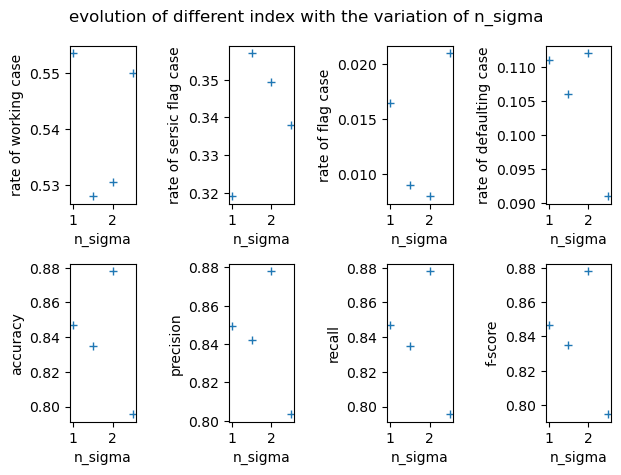

In [129]:
plt.suptitle('evolution of different index with the variation of n_sigma')
plt.subplot(241)
plt.plot(n_sigma,working,'+')
plt.xlabel('n_sigma')
plt.ylabel('rate of working case')

plt.subplot(242)
plt.plot(n_sigma,sersic,'+')
plt.xlabel('n_sigma')
plt.ylabel('rate of sersic flag case')

plt.subplot(243)
plt.plot(n_sigma,flag,'+')
plt.xlabel('n_sigma')
plt.ylabel('rate of flag case')

plt.subplot(244)
plt.plot(n_sigma,defaulting,'+')
plt.xlabel('n_sigma')
plt.ylabel('rate of defaulting case')

plt.subplot(245)
plt.plot(n_sigma,accuracies,'+')
plt.xlabel('n_sigma')
plt.ylabel('accuracy')

plt.subplot(246)
plt.plot(n_sigma,precisions,'+')
plt.xlabel('n_sigma')
plt.ylabel('precision')

plt.subplot(247)
plt.plot(n_sigma,recalls,'+')
plt.xlabel('n_sigma')
plt.ylabel('recall')

plt.subplot(248)
plt.plot(n_sigma,f_scores,'+')
plt.xlabel('n_sigma')
plt.ylabel('f-score')

plt.tight_layout()
plt.show()

In [130]:
from IPython.display import Audio
sound_file = './sound/beep.mp3'
Audio(sound_file, autoplay=True)

## detect threshold with computed background mean of each image with corner method

In [131]:
###First non_lensed data

n_sigma=np.arange(1, 3, 0.5)
working,sersic,flag,defaulting=[],[],[],[]
scores, accuracies, precisions, recalls, f_scores=[],[],[],[],[]

for n in n_sigma:


    lrg_sersic_flag={'file':[],'warning':[],'sersic_amplitude':[],'sersic_rhalf':[],'sersic_n':[],'sersic_xc':[],'sersic_yc':[],
                 'sersic_ellip':[],'sersic_theta':[],'asymetry':[],'concentration':[],'deviation':[],'gini':[],'intensity':[],
                 'm20':[],'rpetro_circ':[],'smoothness':[]}
    lrg_flag={'file':[],'warning':[],'sersic_amplitude':[],'sersic_rhalf':[],'sersic_n':[],'sersic_xc':[],'sersic_yc':[],
          'sersic_ellip':[],'sersic_theta':[],'asymetry':[],'concentration':[],'deviation':[],'gini':[],'intensity':[],
          'm20':[],'rpetro_circ':[],'smoothness':[]}
    lrg_defaulting={'file':[],'warning':[]}
    lrg_working={'file':[],'sersic_amplitude':[],'sersic_rhalf':[],'sersic_n':[],'sersic_xc':[],'sersic_yc':[],
             'sersic_ellip':[],'sersic_theta':[],'asymetry':[],'concentration':[],'deviation':[],'gini':[],'intensity':[],
             'm20':[],'rpetro_circ':[],'smoothness':[]}
    
    
    lens_sersic_flag={'file':[],'warning':[],'sersic_amplitude':[],'sersic_rhalf':[],'sersic_n':[],'sersic_xc':[],'sersic_yc':[],
                  'sersic_ellip':[],'sersic_theta':[],'asymetry':[],'concentration':[],'deviation':[],'gini':[],'intensity':[],
                  'm20':[],'rpetro_circ':[],'smoothness':[]}
    lens_flag={'file':[],'warning':[],'sersic_amplitude':[],'sersic_rhalf':[],'sersic_n':[],'sersic_xc':[],'sersic_yc':[],
           'sersic_ellip':[],'sersic_theta':[],'asymetry':[],'concentration':[],'deviation':[],'gini':[],'intensity':[],
           'm20':[],'rpetro_circ':[],'smoothness':[]}
    lens_defaulting={'file':[],'warning':[]}
    lens_working={'file':[],'sersic_amplitude':[],'sersic_rhalf':[],'sersic_n':[],'sersic_xc':[],'sersic_yc':[],
              'sersic_ellip':[],'sersic_theta':[],'asymetry':[],'concentration':[],'deviation':[],'gini':[],'intensity':[],
              'm20':[],'rpetro_circ':[],'smoothness':[]}

    for file in choice(data,1000,replace=False):
        file_path=path+non_lensed+file
        image, header = fits.getdata(file_path, header=True)
        rms_path=path+RMS+file
        rms,rms_header=fits.getdata(rms_path,header=True)
        psf_path=path+PSF+file
        psf,psf_header=fits.getdata(psf_path,header=True)
        
        mean_background=np.mean(corner_value(image))
    
        threshold=detect_threshold(image,n,background=mean_background)
        segm = detect_sources(image, threshold, npixels=5)
    
        Mask=mask(segm)
        segm_map=galaxy_map(segm)
    
    # construction de la rms
    
        weight_map=1/rms
    
    #estimation of the background
    #let's take the median estimator
        try:
            source_morphs = statmorph.source_morphology(image, segm_map, weightmap=weight_map, mask=Mask,psf=psf)
            morph = source_morphs[0]
            if morph.flag_sersic==1:
                with warnings.catch_warnings(record=True) as w:
                    warnings.simplefilter("always")
                    lrg_sersic_flag['file'].append(file)
                    lrg_sersic_flag['warning'].append(w)
                    lrg_sersic_flag['sersic_amplitude'].append(morph.sersic_amplitude)
                    lrg_sersic_flag['sersic_rhalf'].append(morph.sersic_rhalf)
                    lrg_sersic_flag['sersic_n'].append(morph.sersic_n)
                    lrg_sersic_flag['sersic_xc'].append(morph.sersic_xc)
                    lrg_sersic_flag['sersic_yc'].append(morph.sersic_yc)
                    lrg_sersic_flag['sersic_ellip'].append(morph.sersic_ellip)
                    lrg_sersic_flag['sersic_theta'].append(morph.sersic_theta)
                    lrg_sersic_flag['asymetry'].append(morph.asymmetry)
                    lrg_sersic_flag['concentration'].append(morph.concentration)
                    lrg_sersic_flag['deviation'].append(morph.deviation)
                    lrg_sersic_flag['gini'].append(morph.gini)
                    lrg_sersic_flag['intensity'].append(morph.intensity)
                    lrg_sersic_flag['m20'].append(morph.m20)
                    lrg_sersic_flag['rpetro_circ'].append(morph.rpetro_circ)
                    lrg_sersic_flag['smoothness'].append(morph.smoothness)
            elif morph.flag==1:
                with warnings.catch_warnings(record=True) as w:
                    warnings.simplefilter("always")
                    lrg_flag['file'].append(file)
                    lrg_flag['warning'].append(w)
                    lrg_flag['sersic_amplitude'].append(morph.sersic_amplitude)
                    lrg_flag['sersic_rhalf'].append(morph.sersic_rhalf)
                    lrg_flag['sersic_n'].append(morph.sersic_n)
                    lrg_flag['sersic_xc'].append(morph.sersic_xc)
                    lrg_flag['sersic_yc'].append(morph.sersic_yc)
                    lrg_flag['sersic_ellip'].append(morph.sersic_ellip)
                    lrg_flag['sersic_theta'].append(morph.sersic_theta)
                    lrg_flag['asymetry'].append(morph.asymmetry)
                    lrg_flag['concentration'].append(morph.concentration)
                    lrg_flag['deviation'].append(morph.deviation)
                    lrg_flag['gini'].append(morph.gini)
                    lrg_flag['intensity'].append(morph.intensity)
                    lrg_flag['m20'].append(morph.m20)
                    lrg_flag['rpetro_circ'].append(morph.rpetro_circ)
                    lrg_flag['smoothness'].append(morph.smoothness)
            else:
                lrg_working['file'].append(file)
                lrg_working['sersic_amplitude'].append(morph.sersic_amplitude)
                lrg_working['sersic_rhalf'].append(morph.sersic_rhalf)
                lrg_working['sersic_n'].append(morph.sersic_n)
                lrg_working['sersic_xc'].append(morph.sersic_xc)
                lrg_working['sersic_yc'].append(morph.sersic_yc)
                lrg_working['sersic_ellip'].append(morph.sersic_ellip)
                lrg_working['sersic_theta'].append(morph.sersic_theta)
                lrg_working['asymetry'].append(morph.asymmetry)
                lrg_working['concentration'].append(morph.concentration)
                lrg_working['deviation'].append(morph.deviation)
                lrg_working['gini'].append(morph.gini)
                lrg_working['intensity'].append(morph.intensity)
                lrg_working['m20'].append(morph.m20)
                lrg_working['rpetro_circ'].append(morph.rpetro_circ)
                lrg_working['smoothness'].append(morph.smoothness)
        except:
            with warnings.catch_warnings(record=True) as w:
                warnings.simplefilter("always")
                lrg_defaulting['file'].append(file)
                lrg_defaulting['warning'].append(w)

    
    for file in choice(data,1000,replace=False):
        file_path=path+lensed+file
        image, header = fits.getdata(file_path, header=True)
        
        mean_background=np.mean(corner_value(image))
    
        threshold=detect_threshold(image,n,background=mean_background)
        segm = detect_sources(image, threshold, npixels=5)
    
        Mask=mask(segm)
        segm_map=galaxy_map(segm)
    
    # construction de la rms
        source_path=path+lensed_source+file
        rms_path=path+RMS+file
        lrg_path=path+non_lensed+file
        psf_path=path+PSF+file
    
        source,source_header=fits.getdata(source_path, header=True)
        rms,rms_header=fits.getdata(rms_path,header=True)
        lrg,lrg_header=fits.getdata(lrg_path,header=True)
        psf,psf_header=fits.getdata(psf_path,header=True)
    
        gain=lrg_header['GAIN']
        source_rms=source/gain
    
        total_rms=rms+source_rms
    
        weight_map=1/total_rms
    
    #estimation of the background
    #let's take the median estimator
        try:
            source_morphs = statmorph.source_morphology(image, segm_map, weightmap=weight_map, mask=Mask,psf=psf)
            morph = source_morphs[0]
            if morph.flag_sersic==1:
                with warnings.catch_warnings(record=True) as w:
                    warnings.simplefilter("always")
                    lens_sersic_flag['file'].append(file)
                    lens_sersic_flag['warning'].append(w)
                    lens_sersic_flag['sersic_amplitude'].append(morph.sersic_amplitude)
                    lens_sersic_flag['sersic_rhalf'].append(morph.sersic_rhalf)
                    lens_sersic_flag['sersic_n'].append(morph.sersic_n)
                    lens_sersic_flag['sersic_xc'].append(morph.sersic_xc)
                    lens_sersic_flag['sersic_yc'].append(morph.sersic_yc)
                    lens_sersic_flag['sersic_ellip'].append(morph.sersic_ellip)
                    lens_sersic_flag['sersic_theta'].append(morph.sersic_theta)
                    lens_sersic_flag['asymetry'].append(morph.asymmetry)
                    lens_sersic_flag['concentration'].append(morph.concentration)
                    lens_sersic_flag['deviation'].append(morph.deviation)
                    lens_sersic_flag['gini'].append(morph.gini)
                    lens_sersic_flag['intensity'].append(morph.intensity)
                    lens_sersic_flag['m20'].append(morph.m20)
                    lens_sersic_flag['rpetro_circ'].append(morph.rpetro_circ)
                    lens_sersic_flag['smoothness'].append(morph.smoothness)
            elif morph.flag==1:
                with warnings.catch_warnings(record=True) as w:
                    warnings.simplefilter("always")
                    lens_flag['file'].append(file)
                    lens_flag['warning'].append(w)
                    lens_flag['sersic_amplitude'].append(morph.sersic_amplitude)
                    lens_flag['sersic_rhalf'].append(morph.sersic_rhalf)
                    lens_flag['sersic_n'].append(morph.sersic_n)
                    lens_flag['sersic_xc'].append(morph.sersic_xc)
                    lens_flag['sersic_yc'].append(morph.sersic_yc)
                    lens_flag['sersic_ellip'].append(morph.sersic_ellip)
                    lens_flag['sersic_theta'].append(morph.sersic_theta)
                    lens_flag['asymetry'].append(morph.asymmetry)
                    lens_flag['concentration'].append(morph.concentration)
                    lens_flag['deviation'].append(morph.deviation)
                    lens_flag['gini'].append(morph.gini)
                    lens_flag['intensity'].append(morph.intensity)
                    lens_flag['m20'].append(morph.m20)
                    lens_flag['rpetro_circ'].append(morph.rpetro_circ)
                    lens_flag['smoothness'].append(morph.smoothness)
            else:
                lens_working['file'].append(file)
                lens_working['sersic_amplitude'].append(morph.sersic_amplitude)
                lens_working['sersic_rhalf'].append(morph.sersic_rhalf)
                lens_working['sersic_n'].append(morph.sersic_n)
                lens_working['sersic_xc'].append(morph.sersic_xc)
                lens_working['sersic_yc'].append(morph.sersic_yc)
                lens_working['sersic_ellip'].append(morph.sersic_ellip)
                lens_working['sersic_theta'].append(morph.sersic_theta)
                lens_working['asymetry'].append(morph.asymmetry)
                lens_working['concentration'].append(morph.concentration)
                lens_working['deviation'].append(morph.deviation)
                lens_working['gini'].append(morph.gini)
                lens_working['intensity'].append(morph.intensity)
                lens_working['m20'].append(morph.m20)
                lens_working['rpetro_circ'].append(morph.rpetro_circ)
                lens_working['smoothness'].append(morph.smoothness)
        except:
            with warnings.catch_warnings(record=True) as w:
                warnings.simplefilter("always")
                lens_defaulting['file'].append(file)
                lens_defaulting['warning'].append(w)

    working.append((len(lrg_working['file'])+len(lens_working['file']))/2000)
    sersic.append((len(lrg_sersic_flag['file'])+len(lens_sersic_flag['file']))/2000)
    flag.append((len(lrg_flag['file'])+len(lens_flag['file']))/2000)
    defaulting.append((len(lrg_defaulting['file'])+len(lens_defaulting['file']))/2000)
    
    #preprocessing of data
    x=[lrg_working['sersic_amplitude']+lens_working['sersic_amplitude'],lrg_working['sersic_rhalf']+lens_working['sersic_rhalf'],
       lrg_working['sersic_n']+lens_working['sersic_n'],lrg_working['sersic_xc']+lens_working['sersic_xc'],
       lrg_working['sersic_yc']+lens_working['sersic_yc'],lrg_working['sersic_ellip']+lens_working['sersic_ellip'],
       lrg_working['sersic_theta']+lens_working['sersic_theta'],lrg_working['file']+lens_working['file'],
       [0 for i in range(len(lrg_working['file']))]+[1 for j in range(len(lens_working['file']))]]
    X=np.transpose(x)
    rng = np.random.default_rng()
    rng.shuffle(X)

    y=X[:,-1]
    y_file=X[:,-2]
    X=X[:,:-2]

    cut1,cut2=int(0.6*len(X)),int(0.8*len((X)))
    X_train,X_valid,X_test=X[:cut1],X[cut1:cut2],X[cut2:]
    y_train,y_valid,y_test=y[:cut1],y[cut1:cut2],y[cut2:]
    y_file_train,y_file_valid,y_file_test=y_file[:cut1],y_file[cut1:cut2],y_file[cut2:]
        
    clf = make_pipeline(StandardScaler(), SVC(gamma='auto'))
    clf=clf.fit(X_train, y_train)
    
    scores.append(clf.score(X_valid,y_valid))
    
    pred=clf.predict(X_test)
    
    precision,recall,fscore,support=precision_recall_fscore_support(y_test,pred,average='weighted')
    
    accuracies.append(accuracy_score(y_test,pred))
    precisions.append(precision)
    recalls.append(recall)
    f_scores.append(fscore)

/home/clement/anaconda3/envs/memoire/lib/python3.11/site-packages/astropy/modeling/functional_models.py:3109: RuntimeWarning: overflow encountered in power
  return amplitude * np.exp(-bn * (z ** (1 / n) - 1))
/home/clement/anaconda3/envs/memoire/lib/python3.11/site-packages/astropy/modeling/functional_models.py:3109: RuntimeWarning: overflow encountered in power
  return amplitude * np.exp(-bn * (z ** (1 / n) - 1))
/home/clement/anaconda3/envs/memoire/lib/python3.11/site-packages/astropy/modeling/functional_models.py:3109: RuntimeWarning: overflow encountered in power
  return amplitude * np.exp(-bn * (z ** (1 / n) - 1))
/home/clement/anaconda3/envs/memoire/lib/python3.11/site-packages/astropy/modeling/functional_models.py:3109: RuntimeWarning: overflow encountered in power
  return amplitude * np.exp(-bn * (z ** (1 / n) - 1))
/home/clement/anaconda3/envs/memoire/lib/python3.11/site-packages/astropy/modeling/functional_models.py:3109: RuntimeWarning: overflow encountered in power
  re

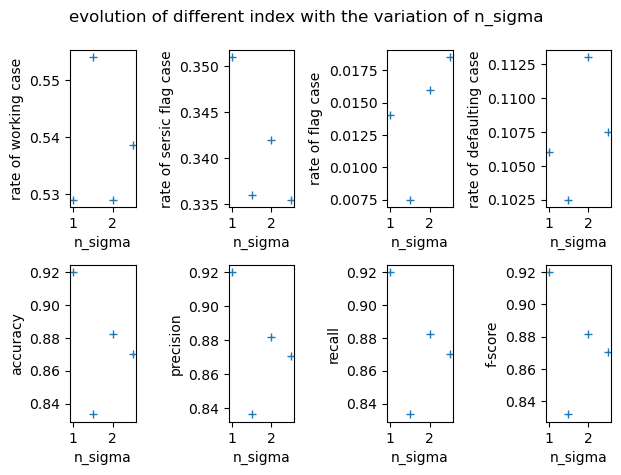

In [132]:
plt.suptitle('evolution of different index with the variation of n_sigma')
plt.subplot(241)
plt.plot(n_sigma,working,'+')
plt.xlabel('n_sigma')
plt.ylabel('rate of working case')

plt.subplot(242)
plt.plot(n_sigma,sersic,'+')
plt.xlabel('n_sigma')
plt.ylabel('rate of sersic flag case')

plt.subplot(243)
plt.plot(n_sigma,flag,'+')
plt.xlabel('n_sigma')
plt.ylabel('rate of flag case')

plt.subplot(244)
plt.plot(n_sigma,defaulting,'+')
plt.xlabel('n_sigma')
plt.ylabel('rate of defaulting case')

plt.subplot(245)
plt.plot(n_sigma,accuracies,'+')
plt.xlabel('n_sigma')
plt.ylabel('accuracy')

plt.subplot(246)
plt.plot(n_sigma,precisions,'+')
plt.xlabel('n_sigma')
plt.ylabel('precision')

plt.subplot(247)
plt.plot(n_sigma,recalls,'+')
plt.xlabel('n_sigma')
plt.ylabel('recall')

plt.subplot(248)
plt.plot(n_sigma,f_scores,'+')
plt.xlabel('n_sigma')
plt.ylabel('f-score')

plt.tight_layout()
plt.show()

In [133]:
from IPython.display import Audio
sound_file = './sound/beep.mp3'
Audio(sound_file, autoplay=True)

## detect threshold with computed average and std of each image with corner method

In [134]:
###First non_lensed data

n_sigma=np.arange(1, 3, 0.5)
working,sersic,flag,defaulting=[],[],[],[]
scores, accuracies, precisions, recalls, f_scores=[],[],[],[],[]

for n in n_sigma:


    lrg_sersic_flag={'file':[],'warning':[],'sersic_amplitude':[],'sersic_rhalf':[],'sersic_n':[],'sersic_xc':[],'sersic_yc':[],
                 'sersic_ellip':[],'sersic_theta':[],'asymetry':[],'concentration':[],'deviation':[],'gini':[],'intensity':[],
                 'm20':[],'rpetro_circ':[],'smoothness':[]}
    lrg_flag={'file':[],'warning':[],'sersic_amplitude':[],'sersic_rhalf':[],'sersic_n':[],'sersic_xc':[],'sersic_yc':[],
          'sersic_ellip':[],'sersic_theta':[],'asymetry':[],'concentration':[],'deviation':[],'gini':[],'intensity':[],
          'm20':[],'rpetro_circ':[],'smoothness':[]}
    lrg_defaulting={'file':[],'warning':[]}
    lrg_working={'file':[],'sersic_amplitude':[],'sersic_rhalf':[],'sersic_n':[],'sersic_xc':[],'sersic_yc':[],
             'sersic_ellip':[],'sersic_theta':[],'asymetry':[],'concentration':[],'deviation':[],'gini':[],'intensity':[],
             'm20':[],'rpetro_circ':[],'smoothness':[]}
    
    
    lens_sersic_flag={'file':[],'warning':[],'sersic_amplitude':[],'sersic_rhalf':[],'sersic_n':[],'sersic_xc':[],'sersic_yc':[],
                  'sersic_ellip':[],'sersic_theta':[],'asymetry':[],'concentration':[],'deviation':[],'gini':[],'intensity':[],
                  'm20':[],'rpetro_circ':[],'smoothness':[]}
    lens_flag={'file':[],'warning':[],'sersic_amplitude':[],'sersic_rhalf':[],'sersic_n':[],'sersic_xc':[],'sersic_yc':[],
           'sersic_ellip':[],'sersic_theta':[],'asymetry':[],'concentration':[],'deviation':[],'gini':[],'intensity':[],
           'm20':[],'rpetro_circ':[],'smoothness':[]}
    lens_defaulting={'file':[],'warning':[]}
    lens_working={'file':[],'sersic_amplitude':[],'sersic_rhalf':[],'sersic_n':[],'sersic_xc':[],'sersic_yc':[],
              'sersic_ellip':[],'sersic_theta':[],'asymetry':[],'concentration':[],'deviation':[],'gini':[],'intensity':[],
              'm20':[],'rpetro_circ':[],'smoothness':[]}

    for file in choice(data,1000,replace=False):
        file_path=path+non_lensed+file
        image, header = fits.getdata(file_path, header=True)
        rms_path=path+RMS+file
        rms,rms_header=fits.getdata(rms_path,header=True)
        psf_path=path+PSF+file
        psf,psf_header=fits.getdata(psf_path,header=True)
        
        mean_background=np.mean(corner_value(image))
        std_background=np.std(corner_value(image))
    
        threshold=detect_threshold(image,n,background=mean_background,error=std_background)
        segm = detect_sources(image, threshold, npixels=5)
    
        Mask=mask(segm)
        segm_map=galaxy_map(segm)
    
    # construction de la rms
    
        weight_map=1/rms
    
    #estimation of the background
    #let's take the median estimator
        try:
            source_morphs = statmorph.source_morphology(image, segm_map, weightmap=weight_map, mask=Mask,psf=psf)
            morph = source_morphs[0]
            if morph.flag_sersic==1:
                with warnings.catch_warnings(record=True) as w:
                    warnings.simplefilter("always")
                    lrg_sersic_flag['file'].append(file)
                    lrg_sersic_flag['warning'].append(w)
                    lrg_sersic_flag['sersic_amplitude'].append(morph.sersic_amplitude)
                    lrg_sersic_flag['sersic_rhalf'].append(morph.sersic_rhalf)
                    lrg_sersic_flag['sersic_n'].append(morph.sersic_n)
                    lrg_sersic_flag['sersic_xc'].append(morph.sersic_xc)
                    lrg_sersic_flag['sersic_yc'].append(morph.sersic_yc)
                    lrg_sersic_flag['sersic_ellip'].append(morph.sersic_ellip)
                    lrg_sersic_flag['sersic_theta'].append(morph.sersic_theta)
                    lrg_sersic_flag['asymetry'].append(morph.asymmetry)
                    lrg_sersic_flag['concentration'].append(morph.concentration)
                    lrg_sersic_flag['deviation'].append(morph.deviation)
                    lrg_sersic_flag['gini'].append(morph.gini)
                    lrg_sersic_flag['intensity'].append(morph.intensity)
                    lrg_sersic_flag['m20'].append(morph.m20)
                    lrg_sersic_flag['rpetro_circ'].append(morph.rpetro_circ)
                    lrg_sersic_flag['smoothness'].append(morph.smoothness)
            elif morph.flag==1:
                with warnings.catch_warnings(record=True) as w:
                    warnings.simplefilter("always")
                    lrg_flag['file'].append(file)
                    lrg_flag['warning'].append(w)
                    lrg_flag['sersic_amplitude'].append(morph.sersic_amplitude)
                    lrg_flag['sersic_rhalf'].append(morph.sersic_rhalf)
                    lrg_flag['sersic_n'].append(morph.sersic_n)
                    lrg_flag['sersic_xc'].append(morph.sersic_xc)
                    lrg_flag['sersic_yc'].append(morph.sersic_yc)
                    lrg_flag['sersic_ellip'].append(morph.sersic_ellip)
                    lrg_flag['sersic_theta'].append(morph.sersic_theta)
                    lrg_flag['asymetry'].append(morph.asymmetry)
                    lrg_flag['concentration'].append(morph.concentration)
                    lrg_flag['deviation'].append(morph.deviation)
                    lrg_flag['gini'].append(morph.gini)
                    lrg_flag['intensity'].append(morph.intensity)
                    lrg_flag['m20'].append(morph.m20)
                    lrg_flag['rpetro_circ'].append(morph.rpetro_circ)
                    lrg_flag['smoothness'].append(morph.smoothness)
            else:
                lrg_working['file'].append(file)
                lrg_working['sersic_amplitude'].append(morph.sersic_amplitude)
                lrg_working['sersic_rhalf'].append(morph.sersic_rhalf)
                lrg_working['sersic_n'].append(morph.sersic_n)
                lrg_working['sersic_xc'].append(morph.sersic_xc)
                lrg_working['sersic_yc'].append(morph.sersic_yc)
                lrg_working['sersic_ellip'].append(morph.sersic_ellip)
                lrg_working['sersic_theta'].append(morph.sersic_theta)
                lrg_working['asymetry'].append(morph.asymmetry)
                lrg_working['concentration'].append(morph.concentration)
                lrg_working['deviation'].append(morph.deviation)
                lrg_working['gini'].append(morph.gini)
                lrg_working['intensity'].append(morph.intensity)
                lrg_working['m20'].append(morph.m20)
                lrg_working['rpetro_circ'].append(morph.rpetro_circ)
                lrg_working['smoothness'].append(morph.smoothness)
        except:
            with warnings.catch_warnings(record=True) as w:
                warnings.simplefilter("always")
                lrg_defaulting['file'].append(file)
                lrg_defaulting['warning'].append(w)

    
    for file in choice(data,1000,replace=False):
        file_path=path+lensed+file
        image, header = fits.getdata(file_path, header=True)
        
        mean_background=np.mean(corner_value(image))
        std_background=np.std(corner_value(image))
        
        threshold=detect_threshold(image,n,background=mean_background,error=std_background)
        segm = detect_sources(image, threshold, npixels=5)
    
        Mask=mask(segm)
        segm_map=galaxy_map(segm)
    
    # construction de la rms
        source_path=path+lensed_source+file
        rms_path=path+RMS+file
        lrg_path=path+non_lensed+file
        psf_path=path+PSF+file
    
        source,source_header=fits.getdata(source_path, header=True)
        rms,rms_header=fits.getdata(rms_path,header=True)
        lrg,lrg_header=fits.getdata(lrg_path,header=True)
        psf,psf_header=fits.getdata(psf_path,header=True)
    
        gain=lrg_header['GAIN']
        source_rms=source/gain
    
        total_rms=rms+source_rms
    
        weight_map=1/total_rms
    
    #estimation of the background
    #let's take the median estimator
        try:
            source_morphs = statmorph.source_morphology(image, segm_map, weightmap=weight_map, mask=Mask,psf=psf)
            morph = source_morphs[0]
            if morph.flag_sersic==1:
                with warnings.catch_warnings(record=True) as w:
                    warnings.simplefilter("always")
                    lens_sersic_flag['file'].append(file)
                    lens_sersic_flag['warning'].append(w)
                    lens_sersic_flag['sersic_amplitude'].append(morph.sersic_amplitude)
                    lens_sersic_flag['sersic_rhalf'].append(morph.sersic_rhalf)
                    lens_sersic_flag['sersic_n'].append(morph.sersic_n)
                    lens_sersic_flag['sersic_xc'].append(morph.sersic_xc)
                    lens_sersic_flag['sersic_yc'].append(morph.sersic_yc)
                    lens_sersic_flag['sersic_ellip'].append(morph.sersic_ellip)
                    lens_sersic_flag['sersic_theta'].append(morph.sersic_theta)
                    lens_sersic_flag['asymetry'].append(morph.asymmetry)
                    lens_sersic_flag['concentration'].append(morph.concentration)
                    lens_sersic_flag['deviation'].append(morph.deviation)
                    lens_sersic_flag['gini'].append(morph.gini)
                    lens_sersic_flag['intensity'].append(morph.intensity)
                    lens_sersic_flag['m20'].append(morph.m20)
                    lens_sersic_flag['rpetro_circ'].append(morph.rpetro_circ)
                    lens_sersic_flag['smoothness'].append(morph.smoothness)
            elif morph.flag==1:
                with warnings.catch_warnings(record=True) as w:
                    warnings.simplefilter("always")
                    lens_flag['file'].append(file)
                    lens_flag['warning'].append(w)
                    lens_flag['sersic_amplitude'].append(morph.sersic_amplitude)
                    lens_flag['sersic_rhalf'].append(morph.sersic_rhalf)
                    lens_flag['sersic_n'].append(morph.sersic_n)
                    lens_flag['sersic_xc'].append(morph.sersic_xc)
                    lens_flag['sersic_yc'].append(morph.sersic_yc)
                    lens_flag['sersic_ellip'].append(morph.sersic_ellip)
                    lens_flag['sersic_theta'].append(morph.sersic_theta)
                    lens_flag['asymetry'].append(morph.asymmetry)
                    lens_flag['concentration'].append(morph.concentration)
                    lens_flag['deviation'].append(morph.deviation)
                    lens_flag['gini'].append(morph.gini)
                    lens_flag['intensity'].append(morph.intensity)
                    lens_flag['m20'].append(morph.m20)
                    lens_flag['rpetro_circ'].append(morph.rpetro_circ)
                    lens_flag['smoothness'].append(morph.smoothness)
            else:
                lens_working['file'].append(file)
                lens_working['sersic_amplitude'].append(morph.sersic_amplitude)
                lens_working['sersic_rhalf'].append(morph.sersic_rhalf)
                lens_working['sersic_n'].append(morph.sersic_n)
                lens_working['sersic_xc'].append(morph.sersic_xc)
                lens_working['sersic_yc'].append(morph.sersic_yc)
                lens_working['sersic_ellip'].append(morph.sersic_ellip)
                lens_working['sersic_theta'].append(morph.sersic_theta)
                lens_working['asymetry'].append(morph.asymmetry)
                lens_working['concentration'].append(morph.concentration)
                lens_working['deviation'].append(morph.deviation)
                lens_working['gini'].append(morph.gini)
                lens_working['intensity'].append(morph.intensity)
                lens_working['m20'].append(morph.m20)
                lens_working['rpetro_circ'].append(morph.rpetro_circ)
                lens_working['smoothness'].append(morph.smoothness)
        except:
            with warnings.catch_warnings(record=True) as w:
                warnings.simplefilter("always")
                lens_defaulting['file'].append(file)
                lens_defaulting['warning'].append(w)

    working.append((len(lrg_working['file'])+len(lens_working['file']))/2000)
    sersic.append((len(lrg_sersic_flag['file'])+len(lens_sersic_flag['file']))/2000)
    flag.append((len(lrg_flag['file'])+len(lens_flag['file']))/2000)
    defaulting.append((len(lrg_defaulting['file'])+len(lens_defaulting['file']))/2000)
    
    #preprocessing of data
    x=[lrg_working['sersic_amplitude']+lens_working['sersic_amplitude'],lrg_working['sersic_rhalf']+lens_working['sersic_rhalf'],
       lrg_working['sersic_n']+lens_working['sersic_n'],lrg_working['sersic_xc']+lens_working['sersic_xc'],
       lrg_working['sersic_yc']+lens_working['sersic_yc'],lrg_working['sersic_ellip']+lens_working['sersic_ellip'],
       lrg_working['sersic_theta']+lens_working['sersic_theta'],lrg_working['file']+lens_working['file'],
       [0 for i in range(len(lrg_working['file']))]+[1 for j in range(len(lens_working['file']))]]
    X=np.transpose(x)
    rng = np.random.default_rng()
    rng.shuffle(X)

    y=X[:,-1]
    y_file=X[:,-2]
    X=X[:,:-2]

    cut1,cut2=int(0.6*len(X)),int(0.8*len((X)))
    X_train,X_valid,X_test=X[:cut1],X[cut1:cut2],X[cut2:]
    y_train,y_valid,y_test=y[:cut1],y[cut1:cut2],y[cut2:]
    y_file_train,y_file_valid,y_file_test=y_file[:cut1],y_file[cut1:cut2],y_file[cut2:]
        
    clf = make_pipeline(StandardScaler(), SVC(gamma='auto'))
    clf=clf.fit(X_train, y_train)
    
    scores.append(clf.score(X_valid,y_valid))
    
    pred=clf.predict(X_test)
    
    precision,recall,fscore,support=precision_recall_fscore_support(y_test,pred,average='weighted')
    
    accuracies.append(accuracy_score(y_test,pred))
    precisions.append(precision)
    recalls.append(recall)
    f_scores.append(fscore)

/home/clement/anaconda3/envs/memoire/lib/python3.11/site-packages/astropy/modeling/functional_models.py:3109: RuntimeWarning: overflow encountered in power
  return amplitude * np.exp(-bn * (z ** (1 / n) - 1))
/home/clement/anaconda3/envs/memoire/lib/python3.11/site-packages/astropy/modeling/functional_models.py:3109: RuntimeWarning: overflow encountered in power
  return amplitude * np.exp(-bn * (z ** (1 / n) - 1))
/home/clement/anaconda3/envs/memoire/lib/python3.11/site-packages/astropy/modeling/functional_models.py:3109: RuntimeWarning: overflow encountered in power
  return amplitude * np.exp(-bn * (z ** (1 / n) - 1))
/home/clement/anaconda3/envs/memoire/lib/python3.11/site-packages/astropy/modeling/functional_models.py:3109: RuntimeWarning: overflow encountered in power
  return amplitude * np.exp(-bn * (z ** (1 / n) - 1))
/home/clement/anaconda3/envs/memoire/lib/python3.11/site-packages/astropy/modeling/functional_models.py:3109: RuntimeWarning: overflow encountered in power
  re

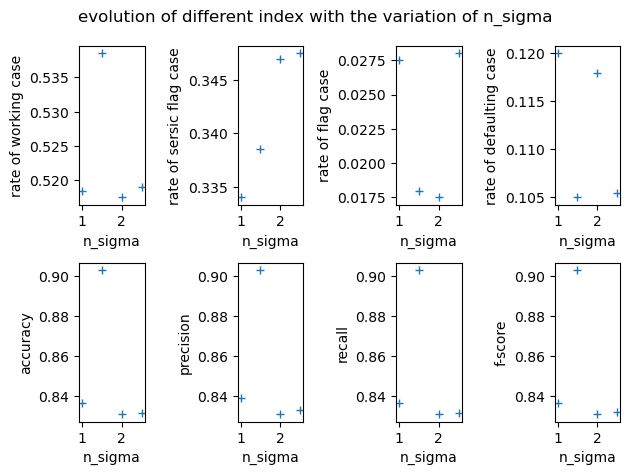

In [135]:
plt.suptitle('evolution of different index with the variation of n_sigma')
plt.subplot(241)
plt.plot(n_sigma,working,'+')
plt.xlabel('n_sigma')
plt.ylabel('rate of working case')

plt.subplot(242)
plt.plot(n_sigma,sersic,'+')
plt.xlabel('n_sigma')
plt.ylabel('rate of sersic flag case')

plt.subplot(243)
plt.plot(n_sigma,flag,'+')
plt.xlabel('n_sigma')
plt.ylabel('rate of flag case')

plt.subplot(244)
plt.plot(n_sigma,defaulting,'+')
plt.xlabel('n_sigma')
plt.ylabel('rate of defaulting case')

plt.subplot(245)
plt.plot(n_sigma,accuracies,'+')
plt.xlabel('n_sigma')
plt.ylabel('accuracy')

plt.subplot(246)
plt.plot(n_sigma,precisions,'+')
plt.xlabel('n_sigma')
plt.ylabel('precision')

plt.subplot(247)
plt.plot(n_sigma,recalls,'+')
plt.xlabel('n_sigma')
plt.ylabel('recall')

plt.subplot(248)
plt.plot(n_sigma,f_scores,'+')
plt.xlabel('n_sigma')
plt.ylabel('f-score')

plt.tight_layout()
plt.show()

In [136]:
from IPython.display import Audio
sound_file = './sound/beep.mp3'
Audio(sound_file, autoplay=True)

## MAD

In [137]:
###First non_lensed data

n_sigma=np.arange(1, 3, 0.5)
working,sersic,flag,defaulting=[],[],[],[]
scores, accuracies, precisions, recalls, f_scores=[],[],[],[],[]

for n in n_sigma:


    lrg_sersic_flag={'file':[],'warning':[],'sersic_amplitude':[],'sersic_rhalf':[],'sersic_n':[],'sersic_xc':[],'sersic_yc':[],
                 'sersic_ellip':[],'sersic_theta':[],'asymetry':[],'concentration':[],'deviation':[],'gini':[],'intensity':[],
                 'm20':[],'rpetro_circ':[],'smoothness':[]}
    lrg_flag={'file':[],'warning':[],'sersic_amplitude':[],'sersic_rhalf':[],'sersic_n':[],'sersic_xc':[],'sersic_yc':[],
          'sersic_ellip':[],'sersic_theta':[],'asymetry':[],'concentration':[],'deviation':[],'gini':[],'intensity':[],
          'm20':[],'rpetro_circ':[],'smoothness':[]}
    lrg_defaulting={'file':[],'warning':[]}
    lrg_working={'file':[],'sersic_amplitude':[],'sersic_rhalf':[],'sersic_n':[],'sersic_xc':[],'sersic_yc':[],
             'sersic_ellip':[],'sersic_theta':[],'asymetry':[],'concentration':[],'deviation':[],'gini':[],'intensity':[],
             'm20':[],'rpetro_circ':[],'smoothness':[]}
    
    
    lens_sersic_flag={'file':[],'warning':[],'sersic_amplitude':[],'sersic_rhalf':[],'sersic_n':[],'sersic_xc':[],'sersic_yc':[],
                  'sersic_ellip':[],'sersic_theta':[],'asymetry':[],'concentration':[],'deviation':[],'gini':[],'intensity':[],
                  'm20':[],'rpetro_circ':[],'smoothness':[]}
    lens_flag={'file':[],'warning':[],'sersic_amplitude':[],'sersic_rhalf':[],'sersic_n':[],'sersic_xc':[],'sersic_yc':[],
           'sersic_ellip':[],'sersic_theta':[],'asymetry':[],'concentration':[],'deviation':[],'gini':[],'intensity':[],
           'm20':[],'rpetro_circ':[],'smoothness':[]}
    lens_defaulting={'file':[],'warning':[]}
    lens_working={'file':[],'sersic_amplitude':[],'sersic_rhalf':[],'sersic_n':[],'sersic_xc':[],'sersic_yc':[],
              'sersic_ellip':[],'sersic_theta':[],'asymetry':[],'concentration':[],'deviation':[],'gini':[],'intensity':[],
              'm20':[],'rpetro_circ':[],'smoothness':[]}

    for file in choice(data,1000,replace=False):
        file_path=path+non_lensed+file
        image, header = fits.getdata(file_path, header=True)
        rms_path=path+RMS+file
        rms,rms_header=fits.getdata(rms_path,header=True)
        psf_path=path+PSF+file
        psf,psf_header=fits.getdata(psf_path,header=True)
        
        std = mad_std(image)
        threshold=n*std
        segm = detect_sources(image, threshold, npixels=5)
    
        Mask=mask(segm)
        segm_map=galaxy_map(segm)
    
    # construction de la rms
    
        weight_map=1/rms
    
    #estimation of the background
    #let's take the median estimator
        try:
            source_morphs = statmorph.source_morphology(image, segm_map, weightmap=weight_map, mask=Mask,psf=psf)
            morph = source_morphs[0]
            if morph.flag_sersic==1:
                with warnings.catch_warnings(record=True) as w:
                    warnings.simplefilter("always")
                    lrg_sersic_flag['file'].append(file)
                    lrg_sersic_flag['warning'].append(w)
                    lrg_sersic_flag['sersic_amplitude'].append(morph.sersic_amplitude)
                    lrg_sersic_flag['sersic_rhalf'].append(morph.sersic_rhalf)
                    lrg_sersic_flag['sersic_n'].append(morph.sersic_n)
                    lrg_sersic_flag['sersic_xc'].append(morph.sersic_xc)
                    lrg_sersic_flag['sersic_yc'].append(morph.sersic_yc)
                    lrg_sersic_flag['sersic_ellip'].append(morph.sersic_ellip)
                    lrg_sersic_flag['sersic_theta'].append(morph.sersic_theta)
                    lrg_sersic_flag['asymetry'].append(morph.asymmetry)
                    lrg_sersic_flag['concentration'].append(morph.concentration)
                    lrg_sersic_flag['deviation'].append(morph.deviation)
                    lrg_sersic_flag['gini'].append(morph.gini)
                    lrg_sersic_flag['intensity'].append(morph.intensity)
                    lrg_sersic_flag['m20'].append(morph.m20)
                    lrg_sersic_flag['rpetro_circ'].append(morph.rpetro_circ)
                    lrg_sersic_flag['smoothness'].append(morph.smoothness)
            elif morph.flag==1:
                with warnings.catch_warnings(record=True) as w:
                    warnings.simplefilter("always")
                    lrg_flag['file'].append(file)
                    lrg_flag['warning'].append(w)
                    lrg_flag['sersic_amplitude'].append(morph.sersic_amplitude)
                    lrg_flag['sersic_rhalf'].append(morph.sersic_rhalf)
                    lrg_flag['sersic_n'].append(morph.sersic_n)
                    lrg_flag['sersic_xc'].append(morph.sersic_xc)
                    lrg_flag['sersic_yc'].append(morph.sersic_yc)
                    lrg_flag['sersic_ellip'].append(morph.sersic_ellip)
                    lrg_flag['sersic_theta'].append(morph.sersic_theta)
                    lrg_flag['asymetry'].append(morph.asymmetry)
                    lrg_flag['concentration'].append(morph.concentration)
                    lrg_flag['deviation'].append(morph.deviation)
                    lrg_flag['gini'].append(morph.gini)
                    lrg_flag['intensity'].append(morph.intensity)
                    lrg_flag['m20'].append(morph.m20)
                    lrg_flag['rpetro_circ'].append(morph.rpetro_circ)
                    lrg_flag['smoothness'].append(morph.smoothness)
            else:
                lrg_working['file'].append(file)
                lrg_working['sersic_amplitude'].append(morph.sersic_amplitude)
                lrg_working['sersic_rhalf'].append(morph.sersic_rhalf)
                lrg_working['sersic_n'].append(morph.sersic_n)
                lrg_working['sersic_xc'].append(morph.sersic_xc)
                lrg_working['sersic_yc'].append(morph.sersic_yc)
                lrg_working['sersic_ellip'].append(morph.sersic_ellip)
                lrg_working['sersic_theta'].append(morph.sersic_theta)
                lrg_working['asymetry'].append(morph.asymmetry)
                lrg_working['concentration'].append(morph.concentration)
                lrg_working['deviation'].append(morph.deviation)
                lrg_working['gini'].append(morph.gini)
                lrg_working['intensity'].append(morph.intensity)
                lrg_working['m20'].append(morph.m20)
                lrg_working['rpetro_circ'].append(morph.rpetro_circ)
                lrg_working['smoothness'].append(morph.smoothness)
        except:
            with warnings.catch_warnings(record=True) as w:
                warnings.simplefilter("always")
                lrg_defaulting['file'].append(file)
                lrg_defaulting['warning'].append(w)

    
    for file in choice(data,1000,replace=False):
        file_path=path+lensed+file
        image, header = fits.getdata(file_path, header=True)
        
        mean_background=np.mean(corner_value(image))
        std_background=np.std(corner_value(image))
        
        std = mad_std(image)
        threshold=n*std
        segm = detect_sources(image, threshold, npixels=5)
    
        Mask=mask(segm)
        segm_map=galaxy_map(segm)
    
    # construction de la rms
        source_path=path+lensed_source+file
        rms_path=path+RMS+file
        lrg_path=path+non_lensed+file
        psf_path=path+PSF+file
    
        source,source_header=fits.getdata(source_path, header=True)
        rms,rms_header=fits.getdata(rms_path,header=True)
        lrg,lrg_header=fits.getdata(lrg_path,header=True)
        psf,psf_header=fits.getdata(psf_path,header=True)
    
        gain=lrg_header['GAIN']
        source_rms=source/gain
    
        total_rms=rms+source_rms
    
        weight_map=1/total_rms
    
    #estimation of the background
    #let's take the median estimator
        try:
            source_morphs = statmorph.source_morphology(image, segm_map, weightmap=weight_map, mask=Mask,psf=psf)
            morph = source_morphs[0]
            if morph.flag_sersic==1:
                with warnings.catch_warnings(record=True) as w:
                    warnings.simplefilter("always")
                    lens_sersic_flag['file'].append(file)
                    lens_sersic_flag['warning'].append(w)
                    lens_sersic_flag['sersic_amplitude'].append(morph.sersic_amplitude)
                    lens_sersic_flag['sersic_rhalf'].append(morph.sersic_rhalf)
                    lens_sersic_flag['sersic_n'].append(morph.sersic_n)
                    lens_sersic_flag['sersic_xc'].append(morph.sersic_xc)
                    lens_sersic_flag['sersic_yc'].append(morph.sersic_yc)
                    lens_sersic_flag['sersic_ellip'].append(morph.sersic_ellip)
                    lens_sersic_flag['sersic_theta'].append(morph.sersic_theta)
                    lens_sersic_flag['asymetry'].append(morph.asymmetry)
                    lens_sersic_flag['concentration'].append(morph.concentration)
                    lens_sersic_flag['deviation'].append(morph.deviation)
                    lens_sersic_flag['gini'].append(morph.gini)
                    lens_sersic_flag['intensity'].append(morph.intensity)
                    lens_sersic_flag['m20'].append(morph.m20)
                    lens_sersic_flag['rpetro_circ'].append(morph.rpetro_circ)
                    lens_sersic_flag['smoothness'].append(morph.smoothness)
            elif morph.flag==1:
                with warnings.catch_warnings(record=True) as w:
                    warnings.simplefilter("always")
                    lens_flag['file'].append(file)
                    lens_flag['warning'].append(w)
                    lens_flag['sersic_amplitude'].append(morph.sersic_amplitude)
                    lens_flag['sersic_rhalf'].append(morph.sersic_rhalf)
                    lens_flag['sersic_n'].append(morph.sersic_n)
                    lens_flag['sersic_xc'].append(morph.sersic_xc)
                    lens_flag['sersic_yc'].append(morph.sersic_yc)
                    lens_flag['sersic_ellip'].append(morph.sersic_ellip)
                    lens_flag['sersic_theta'].append(morph.sersic_theta)
                    lens_flag['asymetry'].append(morph.asymmetry)
                    lens_flag['concentration'].append(morph.concentration)
                    lens_flag['deviation'].append(morph.deviation)
                    lens_flag['gini'].append(morph.gini)
                    lens_flag['intensity'].append(morph.intensity)
                    lens_flag['m20'].append(morph.m20)
                    lens_flag['rpetro_circ'].append(morph.rpetro_circ)
                    lens_flag['smoothness'].append(morph.smoothness)
            else:
                lens_working['file'].append(file)
                lens_working['sersic_amplitude'].append(morph.sersic_amplitude)
                lens_working['sersic_rhalf'].append(morph.sersic_rhalf)
                lens_working['sersic_n'].append(morph.sersic_n)
                lens_working['sersic_xc'].append(morph.sersic_xc)
                lens_working['sersic_yc'].append(morph.sersic_yc)
                lens_working['sersic_ellip'].append(morph.sersic_ellip)
                lens_working['sersic_theta'].append(morph.sersic_theta)
                lens_working['asymetry'].append(morph.asymmetry)
                lens_working['concentration'].append(morph.concentration)
                lens_working['deviation'].append(morph.deviation)
                lens_working['gini'].append(morph.gini)
                lens_working['intensity'].append(morph.intensity)
                lens_working['m20'].append(morph.m20)
                lens_working['rpetro_circ'].append(morph.rpetro_circ)
                lens_working['smoothness'].append(morph.smoothness)
        except:
            with warnings.catch_warnings(record=True) as w:
                warnings.simplefilter("always")
                lens_defaulting['file'].append(file)
                lens_defaulting['warning'].append(w)

    working.append((len(lrg_working['file'])+len(lens_working['file']))/2000)
    sersic.append((len(lrg_sersic_flag['file'])+len(lens_sersic_flag['file']))/2000)
    flag.append((len(lrg_flag['file'])+len(lens_flag['file']))/2000)
    defaulting.append((len(lrg_defaulting['file'])+len(lens_defaulting['file']))/2000)
    
    #preprocessing of data
    x=[lrg_working['sersic_amplitude']+lens_working['sersic_amplitude'],lrg_working['sersic_rhalf']+lens_working['sersic_rhalf'],
       lrg_working['sersic_n']+lens_working['sersic_n'],lrg_working['sersic_xc']+lens_working['sersic_xc'],
       lrg_working['sersic_yc']+lens_working['sersic_yc'],lrg_working['sersic_ellip']+lens_working['sersic_ellip'],
       lrg_working['sersic_theta']+lens_working['sersic_theta'],lrg_working['file']+lens_working['file'],
       [0 for i in range(len(lrg_working['file']))]+[1 for j in range(len(lens_working['file']))]]
    X=np.transpose(x)
    rng = np.random.default_rng()
    rng.shuffle(X)

    y=X[:,-1]
    y_file=X[:,-2]
    X=X[:,:-2]

    cut1,cut2=int(0.6*len(X)),int(0.8*len((X)))
    X_train,X_valid,X_test=X[:cut1],X[cut1:cut2],X[cut2:]
    y_train,y_valid,y_test=y[:cut1],y[cut1:cut2],y[cut2:]
    y_file_train,y_file_valid,y_file_test=y_file[:cut1],y_file[cut1:cut2],y_file[cut2:]
        
    clf = make_pipeline(StandardScaler(), SVC(gamma='auto'))
    clf=clf.fit(X_train, y_train)
    
    scores.append(clf.score(X_valid,y_valid))
    
    pred=clf.predict(X_test)
    
    precision,recall,fscore,support=precision_recall_fscore_support(y_test,pred,average='weighted')
    
    accuracies.append(accuracy_score(y_test,pred))
    precisions.append(precision)
    recalls.append(recall)
    f_scores.append(fscore)

/home/clement/anaconda3/envs/memoire/lib/python3.11/site-packages/astropy/modeling/functional_models.py:3109: RuntimeWarning: overflow encountered in power
  return amplitude * np.exp(-bn * (z ** (1 / n) - 1))
/home/clement/anaconda3/envs/memoire/lib/python3.11/site-packages/astropy/modeling/functional_models.py:3109: RuntimeWarning: overflow encountered in power
  return amplitude * np.exp(-bn * (z ** (1 / n) - 1))
/home/clement/anaconda3/envs/memoire/lib/python3.11/site-packages/astropy/modeling/functional_models.py:3109: RuntimeWarning: overflow encountered in power
  return amplitude * np.exp(-bn * (z ** (1 / n) - 1))
/home/clement/anaconda3/envs/memoire/lib/python3.11/site-packages/astropy/modeling/functional_models.py:3109: RuntimeWarning: overflow encountered in power
  return amplitude * np.exp(-bn * (z ** (1 / n) - 1))
/home/clement/anaconda3/envs/memoire/lib/python3.11/site-packages/astropy/modeling/functional_models.py:3109: RuntimeWarning: overflow encountered in power
  re

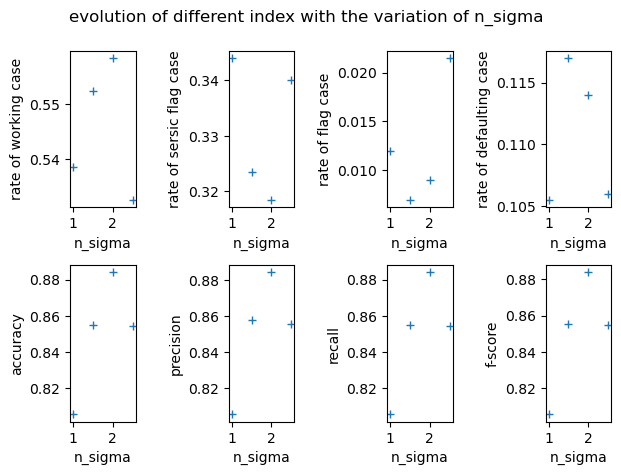

In [138]:
plt.suptitle('evolution of different index with the variation of n_sigma')
plt.subplot(241)
plt.plot(n_sigma,working,'+')
plt.xlabel('n_sigma')
plt.ylabel('rate of working case')

plt.subplot(242)
plt.plot(n_sigma,sersic,'+')
plt.xlabel('n_sigma')
plt.ylabel('rate of sersic flag case')

plt.subplot(243)
plt.plot(n_sigma,flag,'+')
plt.xlabel('n_sigma')
plt.ylabel('rate of flag case')

plt.subplot(244)
plt.plot(n_sigma,defaulting,'+')
plt.xlabel('n_sigma')
plt.ylabel('rate of defaulting case')

plt.subplot(245)
plt.plot(n_sigma,accuracies,'+')
plt.xlabel('n_sigma')
plt.ylabel('accuracy')

plt.subplot(246)
plt.plot(n_sigma,precisions,'+')
plt.xlabel('n_sigma')
plt.ylabel('precision')

plt.subplot(247)
plt.plot(n_sigma,recalls,'+')
plt.xlabel('n_sigma')
plt.ylabel('recall')

plt.subplot(248)
plt.plot(n_sigma,f_scores,'+')
plt.xlabel('n_sigma')
plt.ylabel('f-score')

plt.tight_layout()
plt.show()

In [139]:
from IPython.display import Audio
sound_file = './sound/beep.mp3'
Audio(sound_file, autoplay=True)

## different value of n_pixels

### npixel=3

In [162]:
###First non_lensed data

n_sigma=np.arange(1, 3, 0.5)
working,sersic,flag,defaulting=[],[],[],[]
scores, accuracies, precisions, recalls, f_scores=[],[],[],[],[]

for n in n_sigma:


    lrg_sersic_flag={'file':[],'warning':[],'sersic_amplitude':[],'sersic_rhalf':[],'sersic_n':[],'sersic_xc':[],'sersic_yc':[],
                 'sersic_ellip':[],'sersic_theta':[],'asymetry':[],'concentration':[],'deviation':[],'gini':[],'intensity':[],
                 'm20':[],'rpetro_circ':[],'smoothness':[]}
    lrg_flag={'file':[],'warning':[],'sersic_amplitude':[],'sersic_rhalf':[],'sersic_n':[],'sersic_xc':[],'sersic_yc':[],
          'sersic_ellip':[],'sersic_theta':[],'asymetry':[],'concentration':[],'deviation':[],'gini':[],'intensity':[],
          'm20':[],'rpetro_circ':[],'smoothness':[]}
    lrg_defaulting={'file':[],'warning':[]}
    lrg_working={'file':[],'sersic_amplitude':[],'sersic_rhalf':[],'sersic_n':[],'sersic_xc':[],'sersic_yc':[],
             'sersic_ellip':[],'sersic_theta':[],'asymetry':[],'concentration':[],'deviation':[],'gini':[],'intensity':[],
             'm20':[],'rpetro_circ':[],'smoothness':[]}
    
    
    lens_sersic_flag={'file':[],'warning':[],'sersic_amplitude':[],'sersic_rhalf':[],'sersic_n':[],'sersic_xc':[],'sersic_yc':[],
                  'sersic_ellip':[],'sersic_theta':[],'asymetry':[],'concentration':[],'deviation':[],'gini':[],'intensity':[],
                  'm20':[],'rpetro_circ':[],'smoothness':[]}
    lens_flag={'file':[],'warning':[],'sersic_amplitude':[],'sersic_rhalf':[],'sersic_n':[],'sersic_xc':[],'sersic_yc':[],
           'sersic_ellip':[],'sersic_theta':[],'asymetry':[],'concentration':[],'deviation':[],'gini':[],'intensity':[],
           'm20':[],'rpetro_circ':[],'smoothness':[]}
    lens_defaulting={'file':[],'warning':[]}
    lens_working={'file':[],'sersic_amplitude':[],'sersic_rhalf':[],'sersic_n':[],'sersic_xc':[],'sersic_yc':[],
              'sersic_ellip':[],'sersic_theta':[],'asymetry':[],'concentration':[],'deviation':[],'gini':[],'intensity':[],
              'm20':[],'rpetro_circ':[],'smoothness':[]}

    for file in choice(data,1000,replace=False):
        file_path=path+non_lensed+file
        image, header = fits.getdata(file_path, header=True)
        rms_path=path+RMS+file
        rms,rms_header=fits.getdata(rms_path,header=True)
        psf_path=path+PSF+file
        psf,psf_header=fits.getdata(psf_path,header=True)
        
        mean_background=np.mean(corner_value(image))
        std_background=np.std(corner_value(image))
    
        threshold=detect_threshold(image,n,background=mean_background,error=std_background)
        segm = detect_sources(image, threshold, npixels=3)
    
        Mask=mask(segm)
        segm_map=galaxy_map(segm)
    
    # construction de la rms
    
        weight_map=1/rms
    
    #estimation of the background
    #let's take the median estimator
        try:
            source_morphs = statmorph.source_morphology(image, segm_map, weightmap=weight_map, mask=Mask,psf=psf)
            morph = source_morphs[0]
            if morph.flag_sersic==1:
                with warnings.catch_warnings(record=True) as w:
                    warnings.simplefilter("always")
                    lrg_sersic_flag['file'].append(file)
                    lrg_sersic_flag['warning'].append(w)
                    lrg_sersic_flag['sersic_amplitude'].append(morph.sersic_amplitude)
                    lrg_sersic_flag['sersic_rhalf'].append(morph.sersic_rhalf)
                    lrg_sersic_flag['sersic_n'].append(morph.sersic_n)
                    lrg_sersic_flag['sersic_xc'].append(morph.sersic_xc)
                    lrg_sersic_flag['sersic_yc'].append(morph.sersic_yc)
                    lrg_sersic_flag['sersic_ellip'].append(morph.sersic_ellip)
                    lrg_sersic_flag['sersic_theta'].append(morph.sersic_theta)
                    lrg_sersic_flag['asymetry'].append(morph.asymmetry)
                    lrg_sersic_flag['concentration'].append(morph.concentration)
                    lrg_sersic_flag['deviation'].append(morph.deviation)
                    lrg_sersic_flag['gini'].append(morph.gini)
                    lrg_sersic_flag['intensity'].append(morph.intensity)
                    lrg_sersic_flag['m20'].append(morph.m20)
                    lrg_sersic_flag['rpetro_circ'].append(morph.rpetro_circ)
                    lrg_sersic_flag['smoothness'].append(morph.smoothness)
            elif morph.flag==1:
                with warnings.catch_warnings(record=True) as w:
                    warnings.simplefilter("always")
                    lrg_flag['file'].append(file)
                    lrg_flag['warning'].append(w)
                    lrg_flag['sersic_amplitude'].append(morph.sersic_amplitude)
                    lrg_flag['sersic_rhalf'].append(morph.sersic_rhalf)
                    lrg_flag['sersic_n'].append(morph.sersic_n)
                    lrg_flag['sersic_xc'].append(morph.sersic_xc)
                    lrg_flag['sersic_yc'].append(morph.sersic_yc)
                    lrg_flag['sersic_ellip'].append(morph.sersic_ellip)
                    lrg_flag['sersic_theta'].append(morph.sersic_theta)
                    lrg_flag['asymetry'].append(morph.asymmetry)
                    lrg_flag['concentration'].append(morph.concentration)
                    lrg_flag['deviation'].append(morph.deviation)
                    lrg_flag['gini'].append(morph.gini)
                    lrg_flag['intensity'].append(morph.intensity)
                    lrg_flag['m20'].append(morph.m20)
                    lrg_flag['rpetro_circ'].append(morph.rpetro_circ)
                    lrg_flag['smoothness'].append(morph.smoothness)
            else:
                lrg_working['file'].append(file)
                lrg_working['sersic_amplitude'].append(morph.sersic_amplitude)
                lrg_working['sersic_rhalf'].append(morph.sersic_rhalf)
                lrg_working['sersic_n'].append(morph.sersic_n)
                lrg_working['sersic_xc'].append(morph.sersic_xc)
                lrg_working['sersic_yc'].append(morph.sersic_yc)
                lrg_working['sersic_ellip'].append(morph.sersic_ellip)
                lrg_working['sersic_theta'].append(morph.sersic_theta)
                lrg_working['asymetry'].append(morph.asymmetry)
                lrg_working['concentration'].append(morph.concentration)
                lrg_working['deviation'].append(morph.deviation)
                lrg_working['gini'].append(morph.gini)
                lrg_working['intensity'].append(morph.intensity)
                lrg_working['m20'].append(morph.m20)
                lrg_working['rpetro_circ'].append(morph.rpetro_circ)
                lrg_working['smoothness'].append(morph.smoothness)
        except:
            with warnings.catch_warnings(record=True) as w:
                warnings.simplefilter("always")
                lrg_defaulting['file'].append(file)
                lrg_defaulting['warning'].append(w)

    
    for file in choice(data,1000,replace=False):
        file_path=path+lensed+file
        image, header = fits.getdata(file_path, header=True)
        
        mean_background=np.mean(corner_value(image))
        std_background=np.std(corner_value(image))
        
        threshold=detect_threshold(image,n,background=mean_background,error=std_background)
        segm = detect_sources(image, threshold, npixels=3)
    
        Mask=mask(segm)
        segm_map=galaxy_map(segm)
    
    # construction de la rms
        source_path=path+lensed_source+file
        rms_path=path+RMS+file
        lrg_path=path+non_lensed+file
        psf_path=path+PSF+file
    
        source,source_header=fits.getdata(source_path, header=True)
        rms,rms_header=fits.getdata(rms_path,header=True)
        lrg,lrg_header=fits.getdata(lrg_path,header=True)
        psf,psf_header=fits.getdata(psf_path,header=True)
    
        gain=lrg_header['GAIN']
        source_rms=source/gain
    
        total_rms=rms+source_rms
    
        weight_map=1/total_rms
    
    #estimation of the background
    #let's take the median estimator
        try:
            source_morphs = statmorph.source_morphology(image, segm_map, weightmap=weight_map, mask=Mask,psf=psf)
            morph = source_morphs[0]
            if morph.flag_sersic==1:
                with warnings.catch_warnings(record=True) as w:
                    warnings.simplefilter("always")
                    lens_sersic_flag['file'].append(file)
                    lens_sersic_flag['warning'].append(w)
                    lens_sersic_flag['sersic_amplitude'].append(morph.sersic_amplitude)
                    lens_sersic_flag['sersic_rhalf'].append(morph.sersic_rhalf)
                    lens_sersic_flag['sersic_n'].append(morph.sersic_n)
                    lens_sersic_flag['sersic_xc'].append(morph.sersic_xc)
                    lens_sersic_flag['sersic_yc'].append(morph.sersic_yc)
                    lens_sersic_flag['sersic_ellip'].append(morph.sersic_ellip)
                    lens_sersic_flag['sersic_theta'].append(morph.sersic_theta)
                    lens_sersic_flag['asymetry'].append(morph.asymmetry)
                    lens_sersic_flag['concentration'].append(morph.concentration)
                    lens_sersic_flag['deviation'].append(morph.deviation)
                    lens_sersic_flag['gini'].append(morph.gini)
                    lens_sersic_flag['intensity'].append(morph.intensity)
                    lens_sersic_flag['m20'].append(morph.m20)
                    lens_sersic_flag['rpetro_circ'].append(morph.rpetro_circ)
                    lens_sersic_flag['smoothness'].append(morph.smoothness)
            elif morph.flag==1:
                with warnings.catch_warnings(record=True) as w:
                    warnings.simplefilter("always")
                    lens_flag['file'].append(file)
                    lens_flag['warning'].append(w)
                    lens_flag['sersic_amplitude'].append(morph.sersic_amplitude)
                    lens_flag['sersic_rhalf'].append(morph.sersic_rhalf)
                    lens_flag['sersic_n'].append(morph.sersic_n)
                    lens_flag['sersic_xc'].append(morph.sersic_xc)
                    lens_flag['sersic_yc'].append(morph.sersic_yc)
                    lens_flag['sersic_ellip'].append(morph.sersic_ellip)
                    lens_flag['sersic_theta'].append(morph.sersic_theta)
                    lens_flag['asymetry'].append(morph.asymmetry)
                    lens_flag['concentration'].append(morph.concentration)
                    lens_flag['deviation'].append(morph.deviation)
                    lens_flag['gini'].append(morph.gini)
                    lens_flag['intensity'].append(morph.intensity)
                    lens_flag['m20'].append(morph.m20)
                    lens_flag['rpetro_circ'].append(morph.rpetro_circ)
                    lens_flag['smoothness'].append(morph.smoothness)
            else:
                lens_working['file'].append(file)
                lens_working['sersic_amplitude'].append(morph.sersic_amplitude)
                lens_working['sersic_rhalf'].append(morph.sersic_rhalf)
                lens_working['sersic_n'].append(morph.sersic_n)
                lens_working['sersic_xc'].append(morph.sersic_xc)
                lens_working['sersic_yc'].append(morph.sersic_yc)
                lens_working['sersic_ellip'].append(morph.sersic_ellip)
                lens_working['sersic_theta'].append(morph.sersic_theta)
                lens_working['asymetry'].append(morph.asymmetry)
                lens_working['concentration'].append(morph.concentration)
                lens_working['deviation'].append(morph.deviation)
                lens_working['gini'].append(morph.gini)
                lens_working['intensity'].append(morph.intensity)
                lens_working['m20'].append(morph.m20)
                lens_working['rpetro_circ'].append(morph.rpetro_circ)
                lens_working['smoothness'].append(morph.smoothness)
        except:
            with warnings.catch_warnings(record=True) as w:
                warnings.simplefilter("always")
                lens_defaulting['file'].append(file)
                lens_defaulting['warning'].append(w)

    working.append((len(lrg_working['file'])+len(lens_working['file']))/2000)
    sersic.append((len(lrg_sersic_flag['file'])+len(lens_sersic_flag['file']))/2000)
    flag.append((len(lrg_flag['file'])+len(lens_flag['file']))/2000)
    defaulting.append((len(lrg_defaulting['file'])+len(lens_defaulting['file']))/2000)
    
    #preprocessing of data
    x=[lrg_working['sersic_amplitude']+lens_working['sersic_amplitude'],lrg_working['sersic_rhalf']+lens_working['sersic_rhalf'],
       lrg_working['sersic_n']+lens_working['sersic_n'],lrg_working['sersic_xc']+lens_working['sersic_xc'],
       lrg_working['sersic_yc']+lens_working['sersic_yc'],lrg_working['sersic_ellip']+lens_working['sersic_ellip'],
       lrg_working['sersic_theta']+lens_working['sersic_theta'],lrg_working['file']+lens_working['file'],
       [0 for i in range(len(lrg_working['file']))]+[1 for j in range(len(lens_working['file']))]]
    X=np.transpose(x)
    rng = np.random.default_rng()
    rng.shuffle(X)

    y=X[:,-1]
    y_file=X[:,-2]
    X=X[:,:-2]

    cut1,cut2=int(0.6*len(X)),int(0.8*len((X)))
    X_train,X_valid,X_test=X[:cut1],X[cut1:cut2],X[cut2:]
    y_train,y_valid,y_test=y[:cut1],y[cut1:cut2],y[cut2:]
    y_file_train,y_file_valid,y_file_test=y_file[:cut1],y_file[cut1:cut2],y_file[cut2:]
        
    clf = make_pipeline(StandardScaler(), SVC(gamma='auto'))
    clf=clf.fit(X_train, y_train)
    
    scores.append(clf.score(X_valid,y_valid))
    
    pred=clf.predict(X_test)
    
    precision,recall,fscore,support=precision_recall_fscore_support(y_test,pred,average='weighted')
    
    accuracies.append(accuracy_score(y_test,pred))
    precisions.append(precision)
    recalls.append(recall)
    f_scores.append(fscore)

/home/clement/anaconda3/envs/memoire/lib/python3.11/site-packages/astropy/modeling/functional_models.py:3109: RuntimeWarning: overflow encountered in power
  return amplitude * np.exp(-bn * (z ** (1 / n) - 1))
/home/clement/anaconda3/envs/memoire/lib/python3.11/site-packages/astropy/modeling/functional_models.py:3109: RuntimeWarning: overflow encountered in power
  return amplitude * np.exp(-bn * (z ** (1 / n) - 1))
/home/clement/anaconda3/envs/memoire/lib/python3.11/site-packages/astropy/modeling/functional_models.py:3109: RuntimeWarning: overflow encountered in power
  return amplitude * np.exp(-bn * (z ** (1 / n) - 1))
/home/clement/anaconda3/envs/memoire/lib/python3.11/site-packages/astropy/modeling/functional_models.py:3109: RuntimeWarning: overflow encountered in power
  return amplitude * np.exp(-bn * (z ** (1 / n) - 1))
/home/clement/anaconda3/envs/memoire/lib/python3.11/site-packages/astropy/modeling/functional_models.py:3109: RuntimeWarning: overflow encountered in power
  re

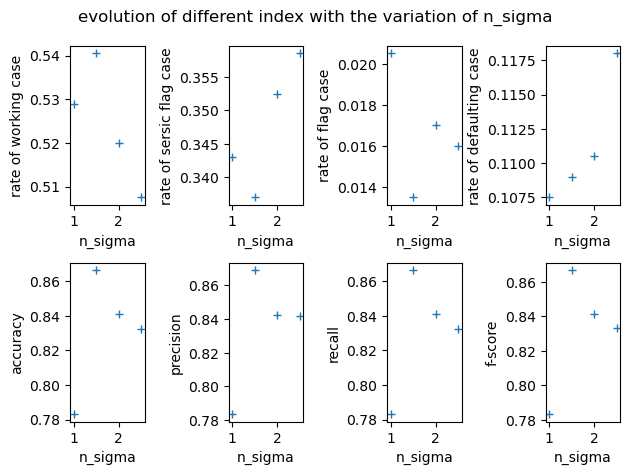

In [163]:
plt.suptitle('evolution of different index with the variation of n_sigma')
plt.subplot(241)
plt.plot(n_sigma,working,'+')
plt.xlabel('n_sigma')
plt.ylabel('rate of working case')

plt.subplot(242)
plt.plot(n_sigma,sersic,'+')
plt.xlabel('n_sigma')
plt.ylabel('rate of sersic flag case')

plt.subplot(243)
plt.plot(n_sigma,flag,'+')
plt.xlabel('n_sigma')
plt.ylabel('rate of flag case')

plt.subplot(244)
plt.plot(n_sigma,defaulting,'+')
plt.xlabel('n_sigma')
plt.ylabel('rate of defaulting case')

plt.subplot(245)
plt.plot(n_sigma,accuracies,'+')
plt.xlabel('n_sigma')
plt.ylabel('accuracy')

plt.subplot(246)
plt.plot(n_sigma,precisions,'+')
plt.xlabel('n_sigma')
plt.ylabel('precision')

plt.subplot(247)
plt.plot(n_sigma,recalls,'+')
plt.xlabel('n_sigma')
plt.ylabel('recall')

plt.subplot(248)
plt.plot(n_sigma,f_scores,'+')
plt.xlabel('n_sigma')
plt.ylabel('f-score')

plt.tight_layout()
plt.show()

### npixel=4

In [166]:
###First non_lensed data

n_sigma=np.arange(1, 3, 0.5)
working,sersic,flag,defaulting=[],[],[],[]
scores, accuracies, precisions, recalls, f_scores=[],[],[],[],[]

for n in n_sigma:


    lrg_sersic_flag={'file':[],'warning':[],'sersic_amplitude':[],'sersic_rhalf':[],'sersic_n':[],'sersic_xc':[],'sersic_yc':[],
                 'sersic_ellip':[],'sersic_theta':[],'asymetry':[],'concentration':[],'deviation':[],'gini':[],'intensity':[],
                 'm20':[],'rpetro_circ':[],'smoothness':[]}
    lrg_flag={'file':[],'warning':[],'sersic_amplitude':[],'sersic_rhalf':[],'sersic_n':[],'sersic_xc':[],'sersic_yc':[],
          'sersic_ellip':[],'sersic_theta':[],'asymetry':[],'concentration':[],'deviation':[],'gini':[],'intensity':[],
          'm20':[],'rpetro_circ':[],'smoothness':[]}
    lrg_defaulting={'file':[],'warning':[]}
    lrg_working={'file':[],'sersic_amplitude':[],'sersic_rhalf':[],'sersic_n':[],'sersic_xc':[],'sersic_yc':[],
             'sersic_ellip':[],'sersic_theta':[],'asymetry':[],'concentration':[],'deviation':[],'gini':[],'intensity':[],
             'm20':[],'rpetro_circ':[],'smoothness':[]}
    
    
    lens_sersic_flag={'file':[],'warning':[],'sersic_amplitude':[],'sersic_rhalf':[],'sersic_n':[],'sersic_xc':[],'sersic_yc':[],
                  'sersic_ellip':[],'sersic_theta':[],'asymetry':[],'concentration':[],'deviation':[],'gini':[],'intensity':[],
                  'm20':[],'rpetro_circ':[],'smoothness':[]}
    lens_flag={'file':[],'warning':[],'sersic_amplitude':[],'sersic_rhalf':[],'sersic_n':[],'sersic_xc':[],'sersic_yc':[],
           'sersic_ellip':[],'sersic_theta':[],'asymetry':[],'concentration':[],'deviation':[],'gini':[],'intensity':[],
           'm20':[],'rpetro_circ':[],'smoothness':[]}
    lens_defaulting={'file':[],'warning':[]}
    lens_working={'file':[],'sersic_amplitude':[],'sersic_rhalf':[],'sersic_n':[],'sersic_xc':[],'sersic_yc':[],
              'sersic_ellip':[],'sersic_theta':[],'asymetry':[],'concentration':[],'deviation':[],'gini':[],'intensity':[],
              'm20':[],'rpetro_circ':[],'smoothness':[]}

    for file in choice(data,1000,replace=False):
        file_path=path+non_lensed+file
        image, header = fits.getdata(file_path, header=True)
        rms_path=path+RMS+file
        rms,rms_header=fits.getdata(rms_path,header=True)
        psf_path=path+PSF+file
        psf,psf_header=fits.getdata(psf_path,header=True)
        
        mean_background=np.mean(corner_value(image))
        std_background=np.std(corner_value(image))
    
        threshold=detect_threshold(image,n,background=mean_background,error=std_background)
        segm = detect_sources(image, threshold, npixels=4)
    
        Mask=mask(segm)
        segm_map=galaxy_map(segm)
    
    # construction de la rms
    
        weight_map=1/rms
    
    #estimation of the background
    #let's take the median estimator
        try:
            source_morphs = statmorph.source_morphology(image, segm_map, weightmap=weight_map, mask=Mask,psf=psf)
            morph = source_morphs[0]
            if morph.flag_sersic==1:
                with warnings.catch_warnings(record=True) as w:
                    warnings.simplefilter("always")
                    lrg_sersic_flag['file'].append(file)
                    lrg_sersic_flag['warning'].append(w)
                    lrg_sersic_flag['sersic_amplitude'].append(morph.sersic_amplitude)
                    lrg_sersic_flag['sersic_rhalf'].append(morph.sersic_rhalf)
                    lrg_sersic_flag['sersic_n'].append(morph.sersic_n)
                    lrg_sersic_flag['sersic_xc'].append(morph.sersic_xc)
                    lrg_sersic_flag['sersic_yc'].append(morph.sersic_yc)
                    lrg_sersic_flag['sersic_ellip'].append(morph.sersic_ellip)
                    lrg_sersic_flag['sersic_theta'].append(morph.sersic_theta)
                    lrg_sersic_flag['asymetry'].append(morph.asymmetry)
                    lrg_sersic_flag['concentration'].append(morph.concentration)
                    lrg_sersic_flag['deviation'].append(morph.deviation)
                    lrg_sersic_flag['gini'].append(morph.gini)
                    lrg_sersic_flag['intensity'].append(morph.intensity)
                    lrg_sersic_flag['m20'].append(morph.m20)
                    lrg_sersic_flag['rpetro_circ'].append(morph.rpetro_circ)
                    lrg_sersic_flag['smoothness'].append(morph.smoothness)
            elif morph.flag==1:
                with warnings.catch_warnings(record=True) as w:
                    warnings.simplefilter("always")
                    lrg_flag['file'].append(file)
                    lrg_flag['warning'].append(w)
                    lrg_flag['sersic_amplitude'].append(morph.sersic_amplitude)
                    lrg_flag['sersic_rhalf'].append(morph.sersic_rhalf)
                    lrg_flag['sersic_n'].append(morph.sersic_n)
                    lrg_flag['sersic_xc'].append(morph.sersic_xc)
                    lrg_flag['sersic_yc'].append(morph.sersic_yc)
                    lrg_flag['sersic_ellip'].append(morph.sersic_ellip)
                    lrg_flag['sersic_theta'].append(morph.sersic_theta)
                    lrg_flag['asymetry'].append(morph.asymmetry)
                    lrg_flag['concentration'].append(morph.concentration)
                    lrg_flag['deviation'].append(morph.deviation)
                    lrg_flag['gini'].append(morph.gini)
                    lrg_flag['intensity'].append(morph.intensity)
                    lrg_flag['m20'].append(morph.m20)
                    lrg_flag['rpetro_circ'].append(morph.rpetro_circ)
                    lrg_flag['smoothness'].append(morph.smoothness)
            else:
                lrg_working['file'].append(file)
                lrg_working['sersic_amplitude'].append(morph.sersic_amplitude)
                lrg_working['sersic_rhalf'].append(morph.sersic_rhalf)
                lrg_working['sersic_n'].append(morph.sersic_n)
                lrg_working['sersic_xc'].append(morph.sersic_xc)
                lrg_working['sersic_yc'].append(morph.sersic_yc)
                lrg_working['sersic_ellip'].append(morph.sersic_ellip)
                lrg_working['sersic_theta'].append(morph.sersic_theta)
                lrg_working['asymetry'].append(morph.asymmetry)
                lrg_working['concentration'].append(morph.concentration)
                lrg_working['deviation'].append(morph.deviation)
                lrg_working['gini'].append(morph.gini)
                lrg_working['intensity'].append(morph.intensity)
                lrg_working['m20'].append(morph.m20)
                lrg_working['rpetro_circ'].append(morph.rpetro_circ)
                lrg_working['smoothness'].append(morph.smoothness)
        except:
            with warnings.catch_warnings(record=True) as w:
                warnings.simplefilter("always")
                lrg_defaulting['file'].append(file)
                lrg_defaulting['warning'].append(w)

    
    for file in choice(data,1000,replace=False):
        file_path=path+lensed+file
        image, header = fits.getdata(file_path, header=True)
        
        mean_background=np.mean(corner_value(image))
        std_background=np.std(corner_value(image))
        
        threshold=detect_threshold(image,n,background=mean_background,error=std_background)
        segm = detect_sources(image, threshold, npixels=4)
    
        Mask=mask(segm)
        segm_map=galaxy_map(segm)
    
    # construction de la rms
        source_path=path+lensed_source+file
        rms_path=path+RMS+file
        lrg_path=path+non_lensed+file
        psf_path=path+PSF+file
    
        source,source_header=fits.getdata(source_path, header=True)
        rms,rms_header=fits.getdata(rms_path,header=True)
        lrg,lrg_header=fits.getdata(lrg_path,header=True)
        psf,psf_header=fits.getdata(psf_path,header=True)
    
        gain=lrg_header['GAIN']
        source_rms=source/gain
    
        total_rms=rms+source_rms
    
        weight_map=1/total_rms
    
    #estimation of the background
    #let's take the median estimator
        try:
            source_morphs = statmorph.source_morphology(image, segm_map, weightmap=weight_map, mask=Mask,psf=psf)
            morph = source_morphs[0]
            if morph.flag_sersic==1:
                with warnings.catch_warnings(record=True) as w:
                    warnings.simplefilter("always")
                    lens_sersic_flag['file'].append(file)
                    lens_sersic_flag['warning'].append(w)
                    lens_sersic_flag['sersic_amplitude'].append(morph.sersic_amplitude)
                    lens_sersic_flag['sersic_rhalf'].append(morph.sersic_rhalf)
                    lens_sersic_flag['sersic_n'].append(morph.sersic_n)
                    lens_sersic_flag['sersic_xc'].append(morph.sersic_xc)
                    lens_sersic_flag['sersic_yc'].append(morph.sersic_yc)
                    lens_sersic_flag['sersic_ellip'].append(morph.sersic_ellip)
                    lens_sersic_flag['sersic_theta'].append(morph.sersic_theta)
                    lens_sersic_flag['asymetry'].append(morph.asymmetry)
                    lens_sersic_flag['concentration'].append(morph.concentration)
                    lens_sersic_flag['deviation'].append(morph.deviation)
                    lens_sersic_flag['gini'].append(morph.gini)
                    lens_sersic_flag['intensity'].append(morph.intensity)
                    lens_sersic_flag['m20'].append(morph.m20)
                    lens_sersic_flag['rpetro_circ'].append(morph.rpetro_circ)
                    lens_sersic_flag['smoothness'].append(morph.smoothness)
            elif morph.flag==1:
                with warnings.catch_warnings(record=True) as w:
                    warnings.simplefilter("always")
                    lens_flag['file'].append(file)
                    lens_flag['warning'].append(w)
                    lens_flag['sersic_amplitude'].append(morph.sersic_amplitude)
                    lens_flag['sersic_rhalf'].append(morph.sersic_rhalf)
                    lens_flag['sersic_n'].append(morph.sersic_n)
                    lens_flag['sersic_xc'].append(morph.sersic_xc)
                    lens_flag['sersic_yc'].append(morph.sersic_yc)
                    lens_flag['sersic_ellip'].append(morph.sersic_ellip)
                    lens_flag['sersic_theta'].append(morph.sersic_theta)
                    lens_flag['asymetry'].append(morph.asymmetry)
                    lens_flag['concentration'].append(morph.concentration)
                    lens_flag['deviation'].append(morph.deviation)
                    lens_flag['gini'].append(morph.gini)
                    lens_flag['intensity'].append(morph.intensity)
                    lens_flag['m20'].append(morph.m20)
                    lens_flag['rpetro_circ'].append(morph.rpetro_circ)
                    lens_flag['smoothness'].append(morph.smoothness)
            else:
                lens_working['file'].append(file)
                lens_working['sersic_amplitude'].append(morph.sersic_amplitude)
                lens_working['sersic_rhalf'].append(morph.sersic_rhalf)
                lens_working['sersic_n'].append(morph.sersic_n)
                lens_working['sersic_xc'].append(morph.sersic_xc)
                lens_working['sersic_yc'].append(morph.sersic_yc)
                lens_working['sersic_ellip'].append(morph.sersic_ellip)
                lens_working['sersic_theta'].append(morph.sersic_theta)
                lens_working['asymetry'].append(morph.asymmetry)
                lens_working['concentration'].append(morph.concentration)
                lens_working['deviation'].append(morph.deviation)
                lens_working['gini'].append(morph.gini)
                lens_working['intensity'].append(morph.intensity)
                lens_working['m20'].append(morph.m20)
                lens_working['rpetro_circ'].append(morph.rpetro_circ)
                lens_working['smoothness'].append(morph.smoothness)
        except:
            with warnings.catch_warnings(record=True) as w:
                warnings.simplefilter("always")
                lens_defaulting['file'].append(file)
                lens_defaulting['warning'].append(w)

    working.append((len(lrg_working['file'])+len(lens_working['file']))/2000)
    sersic.append((len(lrg_sersic_flag['file'])+len(lens_sersic_flag['file']))/2000)
    flag.append((len(lrg_flag['file'])+len(lens_flag['file']))/2000)
    defaulting.append((len(lrg_defaulting['file'])+len(lens_defaulting['file']))/2000)
    
    #preprocessing of data
    x=[lrg_working['sersic_amplitude']+lens_working['sersic_amplitude'],lrg_working['sersic_rhalf']+lens_working['sersic_rhalf'],
       lrg_working['sersic_n']+lens_working['sersic_n'],lrg_working['sersic_xc']+lens_working['sersic_xc'],
       lrg_working['sersic_yc']+lens_working['sersic_yc'],lrg_working['sersic_ellip']+lens_working['sersic_ellip'],
       lrg_working['sersic_theta']+lens_working['sersic_theta'],lrg_working['file']+lens_working['file'],
       [0 for i in range(len(lrg_working['file']))]+[1 for j in range(len(lens_working['file']))]]
    X=np.transpose(x)
    rng = np.random.default_rng()
    rng.shuffle(X)

    y=X[:,-1]
    y_file=X[:,-2]
    X=X[:,:-2]

    cut1,cut2=int(0.6*len(X)),int(0.8*len((X)))
    X_train,X_valid,X_test=X[:cut1],X[cut1:cut2],X[cut2:]
    y_train,y_valid,y_test=y[:cut1],y[cut1:cut2],y[cut2:]
    y_file_train,y_file_valid,y_file_test=y_file[:cut1],y_file[cut1:cut2],y_file[cut2:]
        
    clf = make_pipeline(StandardScaler(), SVC(gamma='auto'))
    clf=clf.fit(X_train, y_train)
    
    scores.append(clf.score(X_valid,y_valid))
    
    pred=clf.predict(X_test)
    
    precision,recall,fscore,support=precision_recall_fscore_support(y_test,pred,average='weighted')
    
    accuracies.append(accuracy_score(y_test,pred))
    precisions.append(precision)
    recalls.append(recall)
    f_scores.append(fscore)

/home/clement/anaconda3/envs/memoire/lib/python3.11/site-packages/astropy/modeling/functional_models.py:3109: RuntimeWarning: overflow encountered in power
  return amplitude * np.exp(-bn * (z ** (1 / n) - 1))
/home/clement/anaconda3/envs/memoire/lib/python3.11/site-packages/astropy/modeling/functional_models.py:3109: RuntimeWarning: overflow encountered in power
  return amplitude * np.exp(-bn * (z ** (1 / n) - 1))
/home/clement/anaconda3/envs/memoire/lib/python3.11/site-packages/astropy/modeling/functional_models.py:3109: RuntimeWarning: overflow encountered in power
  return amplitude * np.exp(-bn * (z ** (1 / n) - 1))
/home/clement/anaconda3/envs/memoire/lib/python3.11/site-packages/astropy/modeling/functional_models.py:3109: RuntimeWarning: overflow encountered in power
  return amplitude * np.exp(-bn * (z ** (1 / n) - 1))
/home/clement/anaconda3/envs/memoire/lib/python3.11/site-packages/astropy/modeling/functional_models.py:3109: RuntimeWarning: overflow encountered in power
  re

AttributeError: 'NoneType' object has no attribute 'areas'

In [ ]:
plt.suptitle('evolution of different index with the variation of n_sigma')
plt.subplot(241)
plt.plot(n_sigma,working,'+')
plt.xlabel('n_sigma')
plt.ylabel('rate of working case')

plt.subplot(242)
plt.plot(n_sigma,sersic,'+')
plt.xlabel('n_sigma')
plt.ylabel('rate of sersic flag case')

plt.subplot(243)
plt.plot(n_sigma,flag,'+')
plt.xlabel('n_sigma')
plt.ylabel('rate of flag case')

plt.subplot(244)
plt.plot(n_sigma,defaulting,'+')
plt.xlabel('n_sigma')
plt.ylabel('rate of defaulting case')

plt.subplot(245)
plt.plot(n_sigma,accuracies,'+')
plt.xlabel('n_sigma')
plt.ylabel('accuracy')

plt.subplot(246)
plt.plot(n_sigma,precisions,'+')
plt.xlabel('n_sigma')
plt.ylabel('precision')

plt.subplot(247)
plt.plot(n_sigma,recalls,'+')
plt.xlabel('n_sigma')
plt.ylabel('recall')

plt.subplot(248)
plt.plot(n_sigma,f_scores,'+')
plt.xlabel('n_sigma')
plt.ylabel('f-score')

plt.tight_layout()
plt.show()

### npixel=6

In [ ]:
###First non_lensed data

n_sigma=np.arange(1, 3, 0.5)
working,sersic,flag,defaulting=[],[],[],[]
scores, accuracies, precisions, recalls, f_scores=[],[],[],[],[]

for n in n_sigma:


    lrg_sersic_flag={'file':[],'warning':[],'sersic_amplitude':[],'sersic_rhalf':[],'sersic_n':[],'sersic_xc':[],'sersic_yc':[],
                 'sersic_ellip':[],'sersic_theta':[],'asymetry':[],'concentration':[],'deviation':[],'gini':[],'intensity':[],
                 'm20':[],'rpetro_circ':[],'smoothness':[]}
    lrg_flag={'file':[],'warning':[],'sersic_amplitude':[],'sersic_rhalf':[],'sersic_n':[],'sersic_xc':[],'sersic_yc':[],
          'sersic_ellip':[],'sersic_theta':[],'asymetry':[],'concentration':[],'deviation':[],'gini':[],'intensity':[],
          'm20':[],'rpetro_circ':[],'smoothness':[]}
    lrg_defaulting={'file':[],'warning':[]}
    lrg_working={'file':[],'sersic_amplitude':[],'sersic_rhalf':[],'sersic_n':[],'sersic_xc':[],'sersic_yc':[],
             'sersic_ellip':[],'sersic_theta':[],'asymetry':[],'concentration':[],'deviation':[],'gini':[],'intensity':[],
             'm20':[],'rpetro_circ':[],'smoothness':[]}
    
    
    lens_sersic_flag={'file':[],'warning':[],'sersic_amplitude':[],'sersic_rhalf':[],'sersic_n':[],'sersic_xc':[],'sersic_yc':[],
                  'sersic_ellip':[],'sersic_theta':[],'asymetry':[],'concentration':[],'deviation':[],'gini':[],'intensity':[],
                  'm20':[],'rpetro_circ':[],'smoothness':[]}
    lens_flag={'file':[],'warning':[],'sersic_amplitude':[],'sersic_rhalf':[],'sersic_n':[],'sersic_xc':[],'sersic_yc':[],
           'sersic_ellip':[],'sersic_theta':[],'asymetry':[],'concentration':[],'deviation':[],'gini':[],'intensity':[],
           'm20':[],'rpetro_circ':[],'smoothness':[]}
    lens_defaulting={'file':[],'warning':[]}
    lens_working={'file':[],'sersic_amplitude':[],'sersic_rhalf':[],'sersic_n':[],'sersic_xc':[],'sersic_yc':[],
              'sersic_ellip':[],'sersic_theta':[],'asymetry':[],'concentration':[],'deviation':[],'gini':[],'intensity':[],
              'm20':[],'rpetro_circ':[],'smoothness':[]}

    for file in choice(data,1000,replace=False):
        file_path=path+non_lensed+file
        image, header = fits.getdata(file_path, header=True)
        rms_path=path+RMS+file
        rms,rms_header=fits.getdata(rms_path,header=True)
        psf_path=path+PSF+file
        psf,psf_header=fits.getdata(psf_path,header=True)
        
        mean_background=np.mean(corner_value(image))
        std_background=np.std(corner_value(image))
    
        threshold=detect_threshold(image,n,background=mean_background,error=std_background)
        segm = detect_sources(image, threshold, npixels=6)
    
        Mask=mask(segm)
        segm_map=galaxy_map(segm)
    
    # construction de la rms
    
        weight_map=1/rms
    
    #estimation of the background
    #let's take the median estimator
        try:
            source_morphs = statmorph.source_morphology(image, segm_map, weightmap=weight_map, mask=Mask,psf=psf)
            morph = source_morphs[0]
            if morph.flag_sersic==1:
                with warnings.catch_warnings(record=True) as w:
                    warnings.simplefilter("always")
                    lrg_sersic_flag['file'].append(file)
                    lrg_sersic_flag['warning'].append(w)
                    lrg_sersic_flag['sersic_amplitude'].append(morph.sersic_amplitude)
                    lrg_sersic_flag['sersic_rhalf'].append(morph.sersic_rhalf)
                    lrg_sersic_flag['sersic_n'].append(morph.sersic_n)
                    lrg_sersic_flag['sersic_xc'].append(morph.sersic_xc)
                    lrg_sersic_flag['sersic_yc'].append(morph.sersic_yc)
                    lrg_sersic_flag['sersic_ellip'].append(morph.sersic_ellip)
                    lrg_sersic_flag['sersic_theta'].append(morph.sersic_theta)
                    lrg_sersic_flag['asymetry'].append(morph.asymmetry)
                    lrg_sersic_flag['concentration'].append(morph.concentration)
                    lrg_sersic_flag['deviation'].append(morph.deviation)
                    lrg_sersic_flag['gini'].append(morph.gini)
                    lrg_sersic_flag['intensity'].append(morph.intensity)
                    lrg_sersic_flag['m20'].append(morph.m20)
                    lrg_sersic_flag['rpetro_circ'].append(morph.rpetro_circ)
                    lrg_sersic_flag['smoothness'].append(morph.smoothness)
            elif morph.flag==1:
                with warnings.catch_warnings(record=True) as w:
                    warnings.simplefilter("always")
                    lrg_flag['file'].append(file)
                    lrg_flag['warning'].append(w)
                    lrg_flag['sersic_amplitude'].append(morph.sersic_amplitude)
                    lrg_flag['sersic_rhalf'].append(morph.sersic_rhalf)
                    lrg_flag['sersic_n'].append(morph.sersic_n)
                    lrg_flag['sersic_xc'].append(morph.sersic_xc)
                    lrg_flag['sersic_yc'].append(morph.sersic_yc)
                    lrg_flag['sersic_ellip'].append(morph.sersic_ellip)
                    lrg_flag['sersic_theta'].append(morph.sersic_theta)
                    lrg_flag['asymetry'].append(morph.asymmetry)
                    lrg_flag['concentration'].append(morph.concentration)
                    lrg_flag['deviation'].append(morph.deviation)
                    lrg_flag['gini'].append(morph.gini)
                    lrg_flag['intensity'].append(morph.intensity)
                    lrg_flag['m20'].append(morph.m20)
                    lrg_flag['rpetro_circ'].append(morph.rpetro_circ)
                    lrg_flag['smoothness'].append(morph.smoothness)
            else:
                lrg_working['file'].append(file)
                lrg_working['sersic_amplitude'].append(morph.sersic_amplitude)
                lrg_working['sersic_rhalf'].append(morph.sersic_rhalf)
                lrg_working['sersic_n'].append(morph.sersic_n)
                lrg_working['sersic_xc'].append(morph.sersic_xc)
                lrg_working['sersic_yc'].append(morph.sersic_yc)
                lrg_working['sersic_ellip'].append(morph.sersic_ellip)
                lrg_working['sersic_theta'].append(morph.sersic_theta)
                lrg_working['asymetry'].append(morph.asymmetry)
                lrg_working['concentration'].append(morph.concentration)
                lrg_working['deviation'].append(morph.deviation)
                lrg_working['gini'].append(morph.gini)
                lrg_working['intensity'].append(morph.intensity)
                lrg_working['m20'].append(morph.m20)
                lrg_working['rpetro_circ'].append(morph.rpetro_circ)
                lrg_working['smoothness'].append(morph.smoothness)
        except:
            with warnings.catch_warnings(record=True) as w:
                warnings.simplefilter("always")
                lrg_defaulting['file'].append(file)
                lrg_defaulting['warning'].append(w)

    
    for file in choice(data,1000,replace=False):
        file_path=path+lensed+file
        image, header = fits.getdata(file_path, header=True)
        
        mean_background=np.mean(corner_value(image))
        std_background=np.std(corner_value(image))
        
        threshold=detect_threshold(image,n,background=mean_background,error=std_background)
        segm = detect_sources(image, threshold, npixels=6)
    
        Mask=mask(segm)
        segm_map=galaxy_map(segm)
    
    # construction de la rms
        source_path=path+lensed_source+file
        rms_path=path+RMS+file
        lrg_path=path+non_lensed+file
        psf_path=path+PSF+file
    
        source,source_header=fits.getdata(source_path, header=True)
        rms,rms_header=fits.getdata(rms_path,header=True)
        lrg,lrg_header=fits.getdata(lrg_path,header=True)
        psf,psf_header=fits.getdata(psf_path,header=True)
    
        gain=lrg_header['GAIN']
        source_rms=source/gain
    
        total_rms=rms+source_rms
    
        weight_map=1/total_rms
    
    #estimation of the background
    #let's take the median estimator
        try:
            source_morphs = statmorph.source_morphology(image, segm_map, weightmap=weight_map, mask=Mask,psf=psf)
            morph = source_morphs[0]
            if morph.flag_sersic==1:
                with warnings.catch_warnings(record=True) as w:
                    warnings.simplefilter("always")
                    lens_sersic_flag['file'].append(file)
                    lens_sersic_flag['warning'].append(w)
                    lens_sersic_flag['sersic_amplitude'].append(morph.sersic_amplitude)
                    lens_sersic_flag['sersic_rhalf'].append(morph.sersic_rhalf)
                    lens_sersic_flag['sersic_n'].append(morph.sersic_n)
                    lens_sersic_flag['sersic_xc'].append(morph.sersic_xc)
                    lens_sersic_flag['sersic_yc'].append(morph.sersic_yc)
                    lens_sersic_flag['sersic_ellip'].append(morph.sersic_ellip)
                    lens_sersic_flag['sersic_theta'].append(morph.sersic_theta)
                    lens_sersic_flag['asymetry'].append(morph.asymmetry)
                    lens_sersic_flag['concentration'].append(morph.concentration)
                    lens_sersic_flag['deviation'].append(morph.deviation)
                    lens_sersic_flag['gini'].append(morph.gini)
                    lens_sersic_flag['intensity'].append(morph.intensity)
                    lens_sersic_flag['m20'].append(morph.m20)
                    lens_sersic_flag['rpetro_circ'].append(morph.rpetro_circ)
                    lens_sersic_flag['smoothness'].append(morph.smoothness)
            elif morph.flag==1:
                with warnings.catch_warnings(record=True) as w:
                    warnings.simplefilter("always")
                    lens_flag['file'].append(file)
                    lens_flag['warning'].append(w)
                    lens_flag['sersic_amplitude'].append(morph.sersic_amplitude)
                    lens_flag['sersic_rhalf'].append(morph.sersic_rhalf)
                    lens_flag['sersic_n'].append(morph.sersic_n)
                    lens_flag['sersic_xc'].append(morph.sersic_xc)
                    lens_flag['sersic_yc'].append(morph.sersic_yc)
                    lens_flag['sersic_ellip'].append(morph.sersic_ellip)
                    lens_flag['sersic_theta'].append(morph.sersic_theta)
                    lens_flag['asymetry'].append(morph.asymmetry)
                    lens_flag['concentration'].append(morph.concentration)
                    lens_flag['deviation'].append(morph.deviation)
                    lens_flag['gini'].append(morph.gini)
                    lens_flag['intensity'].append(morph.intensity)
                    lens_flag['m20'].append(morph.m20)
                    lens_flag['rpetro_circ'].append(morph.rpetro_circ)
                    lens_flag['smoothness'].append(morph.smoothness)
            else:
                lens_working['file'].append(file)
                lens_working['sersic_amplitude'].append(morph.sersic_amplitude)
                lens_working['sersic_rhalf'].append(morph.sersic_rhalf)
                lens_working['sersic_n'].append(morph.sersic_n)
                lens_working['sersic_xc'].append(morph.sersic_xc)
                lens_working['sersic_yc'].append(morph.sersic_yc)
                lens_working['sersic_ellip'].append(morph.sersic_ellip)
                lens_working['sersic_theta'].append(morph.sersic_theta)
                lens_working['asymetry'].append(morph.asymmetry)
                lens_working['concentration'].append(morph.concentration)
                lens_working['deviation'].append(morph.deviation)
                lens_working['gini'].append(morph.gini)
                lens_working['intensity'].append(morph.intensity)
                lens_working['m20'].append(morph.m20)
                lens_working['rpetro_circ'].append(morph.rpetro_circ)
                lens_working['smoothness'].append(morph.smoothness)
        except:
            with warnings.catch_warnings(record=True) as w:
                warnings.simplefilter("always")
                lens_defaulting['file'].append(file)
                lens_defaulting['warning'].append(w)

    working.append((len(lrg_working['file'])+len(lens_working['file']))/2000)
    sersic.append((len(lrg_sersic_flag['file'])+len(lens_sersic_flag['file']))/2000)
    flag.append((len(lrg_flag['file'])+len(lens_flag['file']))/2000)
    defaulting.append((len(lrg_defaulting['file'])+len(lens_defaulting['file']))/2000)
    
    #preprocessing of data
    x=[lrg_working['sersic_amplitude']+lens_working['sersic_amplitude'],lrg_working['sersic_rhalf']+lens_working['sersic_rhalf'],
       lrg_working['sersic_n']+lens_working['sersic_n'],lrg_working['sersic_xc']+lens_working['sersic_xc'],
       lrg_working['sersic_yc']+lens_working['sersic_yc'],lrg_working['sersic_ellip']+lens_working['sersic_ellip'],
       lrg_working['sersic_theta']+lens_working['sersic_theta'],lrg_working['file']+lens_working['file'],
       [0 for i in range(len(lrg_working['file']))]+[1 for j in range(len(lens_working['file']))]]
    X=np.transpose(x)
    rng = np.random.default_rng()
    rng.shuffle(X)

    y=X[:,-1]
    y_file=X[:,-2]
    X=X[:,:-2]

    cut1,cut2=int(0.6*len(X)),int(0.8*len((X)))
    X_train,X_valid,X_test=X[:cut1],X[cut1:cut2],X[cut2:]
    y_train,y_valid,y_test=y[:cut1],y[cut1:cut2],y[cut2:]
    y_file_train,y_file_valid,y_file_test=y_file[:cut1],y_file[cut1:cut2],y_file[cut2:]
        
    clf = make_pipeline(StandardScaler(), SVC(gamma='auto'))
    clf=clf.fit(X_train, y_train)
    
    scores.append(clf.score(X_valid,y_valid))
    
    pred=clf.predict(X_test)
    
    precision,recall,fscore,support=precision_recall_fscore_support(y_test,pred,average='weighted')
    
    accuracies.append(accuracy_score(y_test,pred))
    precisions.append(precision)
    recalls.append(recall)
    f_scores.append(fscore)

In [ ]:
plt.suptitle('evolution of different index with the variation of n_sigma')
plt.subplot(241)
plt.plot(n_sigma,working,'+')
plt.xlabel('n_sigma')
plt.ylabel('rate of working case')

plt.subplot(242)
plt.plot(n_sigma,sersic,'+')
plt.xlabel('n_sigma')
plt.ylabel('rate of sersic flag case')

plt.subplot(243)
plt.plot(n_sigma,flag,'+')
plt.xlabel('n_sigma')
plt.ylabel('rate of flag case')

plt.subplot(244)
plt.plot(n_sigma,defaulting,'+')
plt.xlabel('n_sigma')
plt.ylabel('rate of defaulting case')

plt.subplot(245)
plt.plot(n_sigma,accuracies,'+')
plt.xlabel('n_sigma')
plt.ylabel('accuracy')

plt.subplot(246)
plt.plot(n_sigma,precisions,'+')
plt.xlabel('n_sigma')
plt.ylabel('precision')

plt.subplot(247)
plt.plot(n_sigma,recalls,'+')
plt.xlabel('n_sigma')
plt.ylabel('recall')

plt.subplot(248)
plt.plot(n_sigma,f_scores,'+')
plt.xlabel('n_sigma')
plt.ylabel('f-score')

plt.tight_layout()
plt.show()

In [ ]:
from IPython.display import Audio
sound_file = './sound/beep.mp3'
Audio(sound_file, autoplay=True)